Tarea Minería de Datos
‘Práctica de Evaluación’
- David Perez Diaz

_Notas:_

_Debido a la configuracion de mi teclado (English Setup) no tengo acceso a la tecla enye, por lo que cada vez que se necesite una enye se vera sustituida por ny._


## **Ejercicio 1**

Con el conjunto de datos “FEV_data.csv”, información en fev.doc (live.com), que se  encuentra en la carpeta de datos de la documentación, y sabiendo que la variable  objetivo es ‘fev’, se pide:


In [4]:
from NuestrasFunciones import *
import pandas as pd
import numpy as np
import seaborn as sn
from os import path
import warnings
warnings.filterwarnings('ignore')

In [5]:
ruta_carpeta = path.join("C:\\", "Users", "David Pérez", "OneDrive", "Escritorio", "Master Big Data", "Subjects", "Minería_de_datos_y_modelización predictiva", "Datos")
ruta_archivo_ejercicio1 = path.join(ruta_carpeta, "FEV_data.csv")

In [6]:
DataEjercicio1 = pd.read_csv(ruta_archivo_ejercicio1, index_col = 'seqnbr')

In [7]:
DataEjercicio1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 654 entries, 1 to 654
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   subjid  654 non-null    int64  
 1   age     654 non-null    int64  
 2   fev     654 non-null    float64
 3   height  654 non-null    float64
 4   sex     654 non-null    int64  
 5   smoke   654 non-null    int64  
dtypes: float64(2), int64(4)
memory usage: 35.8 KB


Notas tutoria:  probar log

In [8]:
DataEjercicio1['subjid'].nunique()

654

In [9]:
DataEjercicio1.nunique()

subjid    654
age        17
fev       575
height     56
sex         2
smoke       2
dtype: int64

En  primer lugar tenemos un dataset con 654 registros. Adhieriendonos a la descripcion de los datos tenemos lo siguiente:
- sqnbr: Numero del caso va desde el 0 hasta el 654. Variable que podemos hemos dedicido cargarla como indice. 
- subjid: ID de cada sujeto estudiado. Valor unico para cada uno. Posible variable a ser descartada de cara a modelo.
- fev: Medicion de FEV (litros por segundo). A mayor sea la unidad de medida, mayor sera la capacidad respiratoria del sujeto.
- height: Altura de cada sujeto en el momento de la medida. Medido en pulgadas
- age: Edad del sujeto en el momento de la medida. Medidod en anyos.
- sex: Variable categorica que representa el sexo de cada sujeto. 1 en caso de varon, 2 en caso de mujer.
- smoke: Variable categorica que representa el habito de fumar del sujeto. 1 en caso de que fume habitualmente, 2 en caso de que no. 

Teniendo en cuenta la informacion del dataset, transformamos las variables cuyos valores unicos son menores que 10. Las variables a transformar son:
- Sex
- Smoke

Utilizamos el siguiente codigo.


In [10]:
to_factor = list(DataEjercicio1.loc[:,DataEjercicio1.nunique() < 10])
DataEjercicio1[to_factor] = DataEjercicio1[to_factor].astype('category')

In [11]:
DataEjercicio1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 654 entries, 1 to 654
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   subjid  654 non-null    int64   
 1   age     654 non-null    int64   
 2   fev     654 non-null    float64 
 3   height  654 non-null    float64 
 4   sex     654 non-null    category
 5   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(2)
memory usage: 27.1 KB


Una vez realizada la transformacion, procedemos a realizar un analisis visual. Para ello nos valdremos de histogramas, boxplots, y otra herramientas de visualizacion.

- Descripcion variables continuas:

In [12]:
DataEjercicio1.describe()

,subjid,age,fev,height
count,654.000000,654.000000,654.000000,654.000000
mean,37169.571865,9.931193,2.636780,61.143578
std,23690.860350,2.953935,0.867059,5.703513
min,201.000000,3.000000,0.791000,46.000000
25%,15811.000000,8.000000,1.981000,57.000000
50%,36071.000000,10.000000,2.547500,61.500000
75%,53638.500000,12.000000,3.118500,65.500000
max,90001.000000,19.000000,5.793000,74.000000


- Descripcion variables categoricas:

In [13]:
DataEjercicio1.describe(exclude=np.number)

,sex,smoke
count,654,654
unique,2,2
top,1,2
freq,336,589


Cont


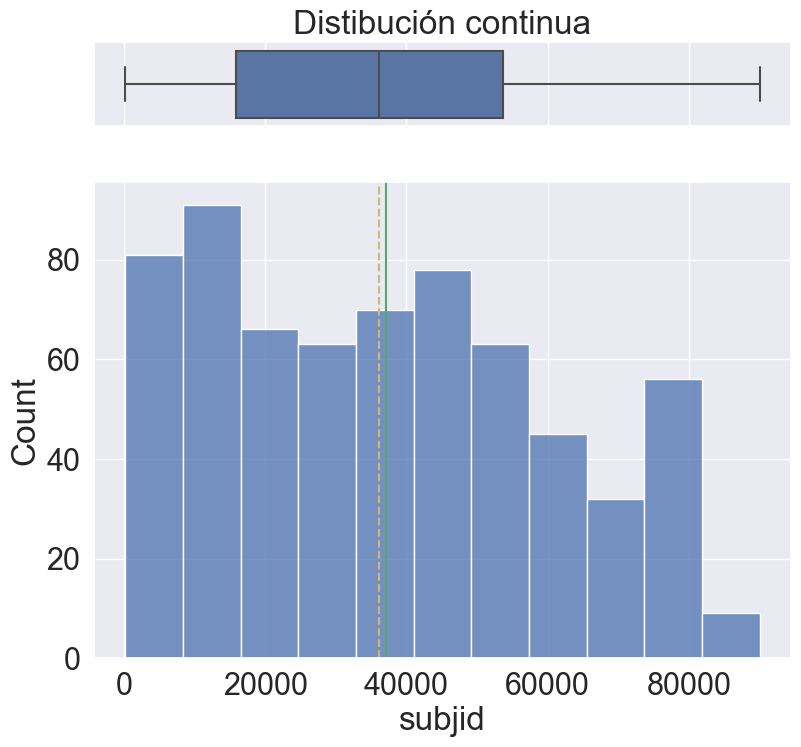

Cont


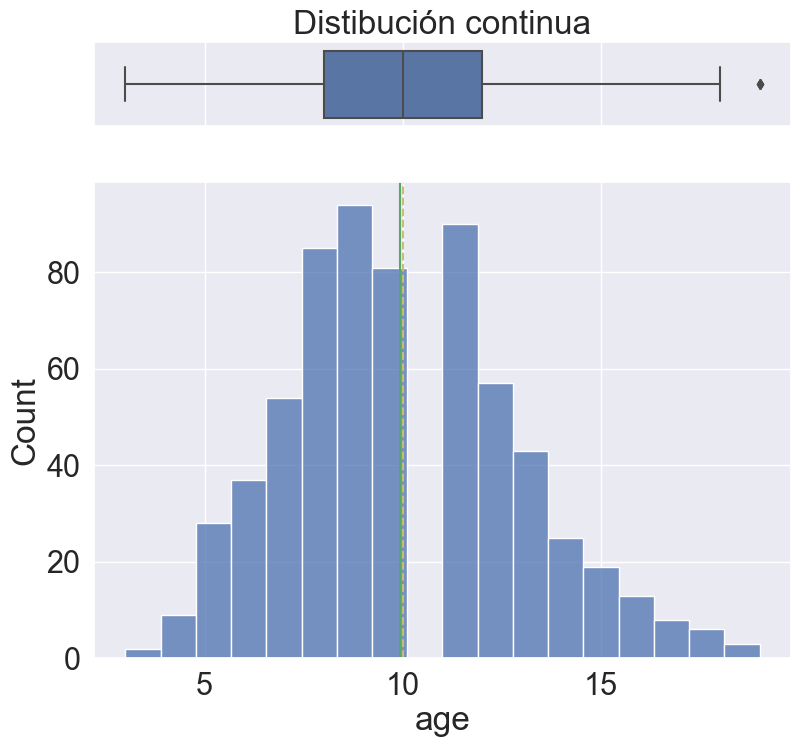

Cont


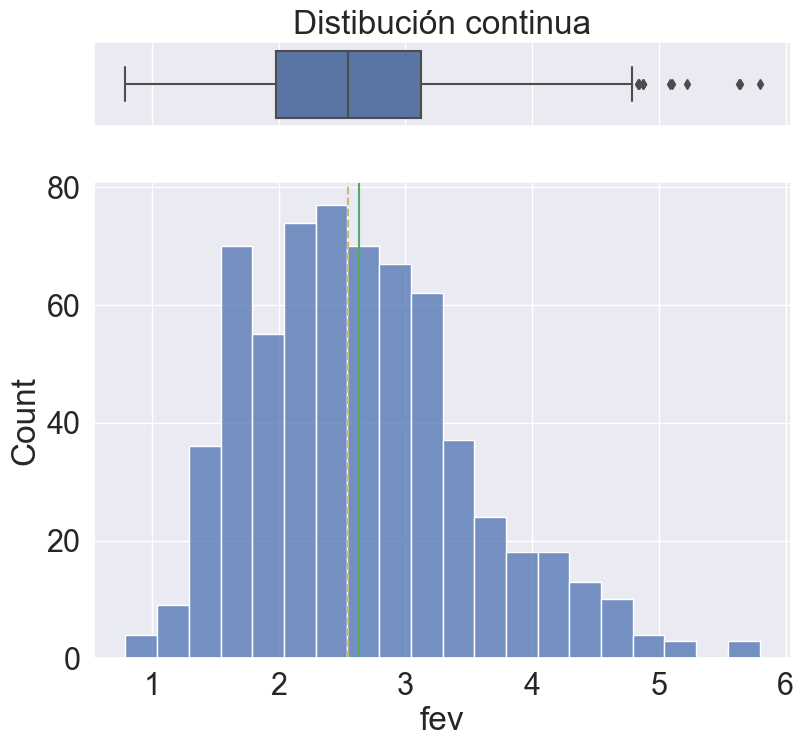

Cont


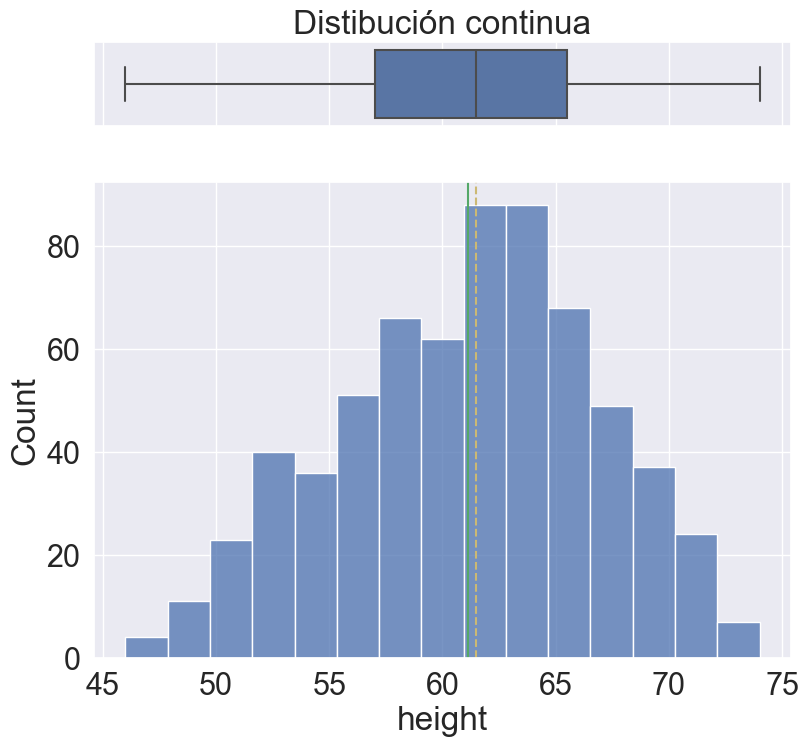

Cat


Cat


subjid    None
age       None
fev       None
height    None
sex       None
smoke     None
dtype: object

In [14]:
DataEjercicio1.apply(plot)

En primer lugar, dadas las primeras observaciones tanto graficas como descriptivas, vemos una seria de variables bastante correctas, con pocas o casi ninguna presencia de outliers, asi como poca dispersion en los datos.
La unica variable que presenta algunos *outliers* a tener en cuenta es la variable fev, pero no podemos sacar ninguna conclusion definitiva de ellos debido fundamentalemente a que no sabemos que tipo de relacion tienen con el resto de variables y incluso si tienen importancia.

Por otro lado las variables categoricas presentan diferencias. En primer lugar, la variable _smoke_ parece bastante descompensada, ya que la inmensa mayoria de los sujetos son no fumadores. Senyalando la variable _sex_ no hay nada que resaltar, presenta similares pesos.

Hay varios casos en particular en la variable 'age', los cual presentan 9 sujetos con mas de 18 anyos. Esos sujetos a mi opion particular, deberian ser eliminados del dataset, ya que han dejado de ser ninyos para convertirse en adultos, o  mejor dicho potenciales contribuyentes.
Valoraremos la eliminacion de estos sujetos mas adelante. 

Por otro lado, tambien llama a la curiosidad, que hay sujetos cuya edad esta entre 3 y 5 anyos. Despues de analizar estos diminutos sujetos llegamos la conclusion que son representan ningun tipo de error.

Aunque el dataset bajo mi punto de vista no requiere de ninguna importante modificacion, voy a cambiar la unidad de medida para la variable *'height'* de inches a centimetros, ya que me resulta mucho mas comodo a la hora de interpretar esta variable.

El factor de conversion va a ser el siguiente:

1 inch = 2.54 centimetros

*Fuente https://www.convert-me.com/es/convert/length/inch.html?u=inch&v=1*

In [15]:
DataEjercicio1['height'] = DataEjercicio1['height'] * 2.54

In [16]:
DataEjercicio1['height'].describe()

count    654.000000
mean     155.304688
std       14.486923
min      116.840000
25%      144.780000
50%      156.210000
75%      166.370000
max      187.960000
Name: height, dtype: float64

Una vez realizadas las modificaciones convenientes al dataset, procedemos a realizar un analisis de correlacion con respecto a la variable objetivo (fev). De esa forma podremos vez que tipo de relacion existe con ella, asi como poder intuir que variables pueden ser potencialmente a incluir en un futuro modelo.

In [17]:
corr_matrix = DataEjercicio1.corr()
corr_matrix['fev'].sort_values(ascending=False)[1:]

height    0.868135
age       0.756459
subjid   -0.014737
Name: fev, dtype: float64

Aqui vemos representado la correlacion de cada una de las variables continuas del dataset con nuestra variable objetivo. Observamos una fuerte correlacion positiva de las variables _height_ y _age_.
Por otro lado tenemos la variable _subjid_ la cual, como era de esperar, no presenta ningun tipo de relacion con nuestra variable objetivo. Este variable, sera eliminada mas adelante.


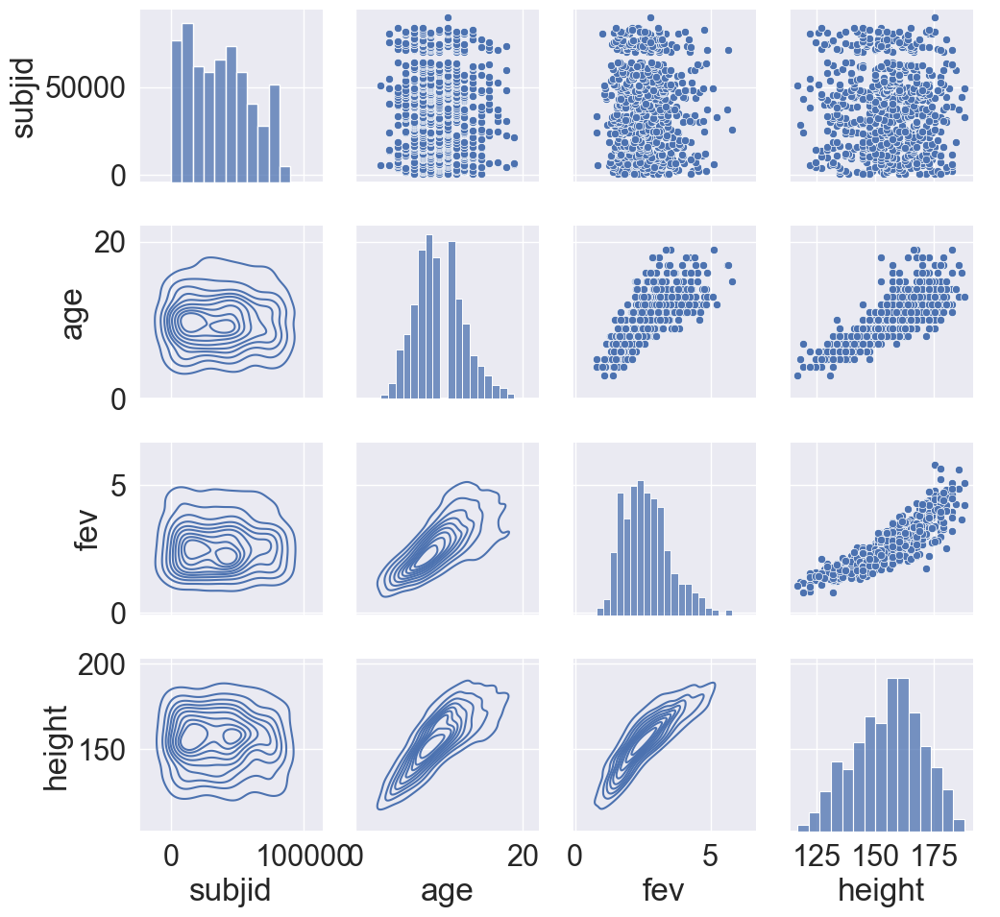

In [18]:
g = sns.PairGrid(DataEjercicio1.iloc[:,:])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()

Aqui podemos observar de una manera mas visual este fuerte correlacion observada en las variables _age_ y _height_.

1. Preparacion de datos de cara a modelo.

Para observar cual es el comportamiento de la variable objetivo con respecto a variables totalmente aleatorias, vamos a introducir dos tipos de esta variable. Asi podremos ver si la variable objetivo sigue algun de aleatoriedad con las variables principales. 

In [19]:
DataEjercicio1['aleatorio'] = np.random.uniform(0,1,size=DataEjercicio1.shape[0])
DataEjercicio1['aleatorio2'] = np.random.uniform(0,1,size=DataEjercicio1.shape[0])
DataEjercicio1.head()

,subjid,age,fev,height,sex,smoke,aleatorio,aleatorio2
seqnbr,,,,,,,,
1,301,9,1.708,144.78,2,2,0.226265,0.855206
2,451,8,1.724,171.45,2,2,0.771497,0.899338
3,501,7,1.720,138.43,2,2,0.952910,0.207574
4,642,9,1.558,134.62,1,2,0.067273,0.491315
5,901,9,1.895,144.78,1,2,0.309733,0.617165


Sirviendonos del paquete _pandas-profiling_, vamos a obtener una visualizacion completa del dataset, representando sus principales caracteristicas asi como visualizacion.
Desde que vi este paquete, tenia claro que queria introducirlo en mis actividades, asi que alla va.


In [20]:
# pip install pandas_profiling
import pandas_profiling
pandas_profiling.ProfileReport(DataEjercicio1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

2.  Separcion de varibles dependiente e independiente 

In [21]:
import scipy.stats as stats

Eliminamos la variable _subjid_

In [22]:
DepSmokers = DataEjercicio1.drop('subjid', axis=1)
imputSmokers = DepSmokers.drop('fev', axis=1)
varObj = DataEjercicio1['fev']

Tras previa prueba, hemos percibido que el comporotamiento de los modelos es bastante mejor con la variable obejivo en escala logaritmica. Es por ello que a partir de este momento, la varaible _fev_ sera ln(fev).

In [23]:
DepSmokers = DepSmokers.copy()
imputSmokers = imputSmokers.copy()
varObj = np.log(varObj)

Vamos a representarla mediante un histograma para ver que aspecto se le queda.

Cont


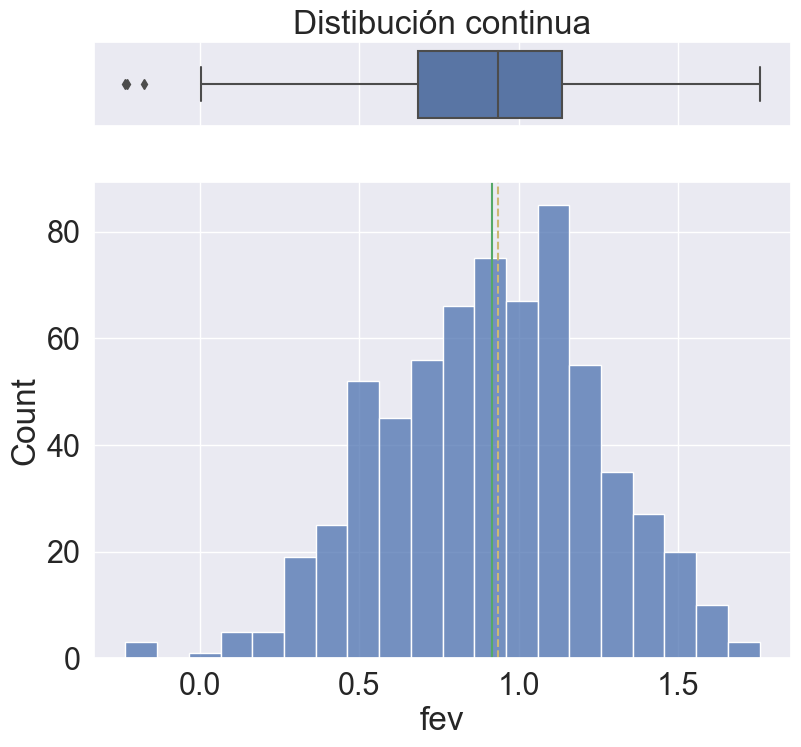

In [24]:
plot(varObj)

Mucho mejor, una distrubucion mas uniforme.

3. Preparacion modelo.

Una vez todo separado y organizado, vamos a servirnos de varias metodos y formulas poder poder observar las relaciones existentes entre nuestras variables dependientes con respecto a la independiente de cara a un modelaje cada vez mas cercano.

In [25]:
tablaCramer = pd.DataFrame(imputSmokers.apply(lambda x: cramers_v(x,varObj)),columns=['VCramer'])

En primer lugar, criterio basado en el estadistico V de Cramer. 

- Este criterio basado en el estadistico Chi-Cuadradado, nos dara un valor entre 0 y 1, donde 1 implica fuerte relacion y 0 ausencia de la misma. Incluso nos ofrece relacion con respecto a la variables categoricas (cosa que la matriz de correlacion no ofrece).

- La ventaja de este criterio con respecto al criterio basado en Chi-Cuadradado es la acotacion del mismo, ya que el estadistico Chi-Cuadrado para aquellas relaciones fuertes puede tener un valor bastante algo.

In [26]:
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente al Fev').update_yaxes(categoryorder="total ascending")

La grafica ilustra una fuerte relacion de las variables _height_ y _age_ (cosa que ya observamos anteriormente en nuestra matrix de correlacion). 

Observando las variables categoricas (_sex_ y _smoke_), vemos que existe relacion con la variable objetivo, pero en un menor grado. Para observar graficamente la relacion entre las anteriormente mencionadas variables categoricas y la variable objetivo vamos a represantar los siguientes _violinplot_.

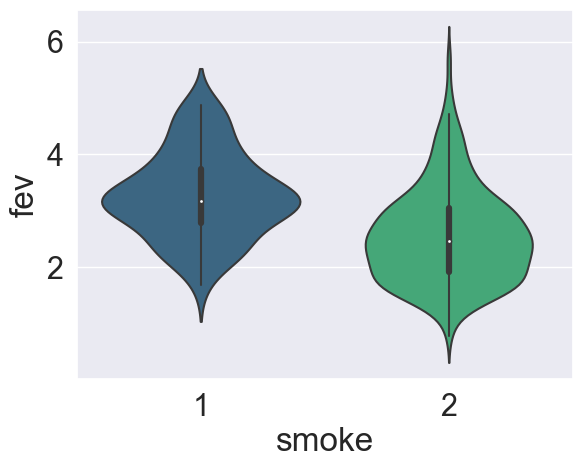

In [27]:
sns.violinplot(x='smoke',y='fev',data=DepSmokers,palette='viridis')
plt.rcParams['figure.figsize'] = (12,8)

En este grafico se aprecia algo bastante contradictorio. La variable categorica _smoke_ cuando toma el valor 1 (fumador), tiene valores de capacidad respiratoria (_fev_) de media mas alto. Esto puede tener su explicacion en que la mayor parte de los datos del dataset incluyen a ninyos menores de 12 anyos, los cuales son muy probables a que nunca hayan probado un cigarrillo. Ademas, aquellas personas fumadoras, por norma general suelen ser mayores de 12 anyos y por lo tanto con una capacidad respiratoria mayor debido a la edad.


Es por eso por lo que la variable _smoke_ pierde a mis ojos un poco de seriedad, a la hora de ayadirla a un posible modelo de regresion.

Vamos a contrastar esta hipotesis restringiendo el dataset solo para aquellos ninyos mayores de 10 anyos.

Porcentaje del dataset para mayores de 10 anyos 40.37 %
Estadísticas para fumadores:
count    59.000000
mean      3.317492
std       0.755910
min       1.694000
25%       2.849000
50%       3.186000
75%       3.792000
max       4.872000
Name: fev, dtype: float64

Estadísticas para no fumadores:
count    205.000000
mean       3.330137
std        0.752621
min        1.916000
25%        2.785000
50%        3.193000
75%        3.791000
max        5.793000
Name: fev, dtype: float64


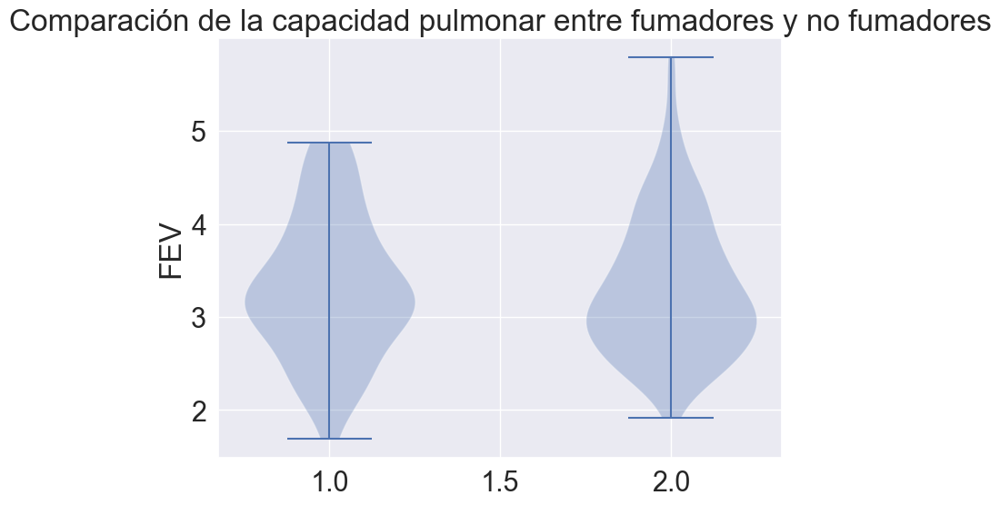

In [28]:
data1  = DataEjercicio1.loc[(DataEjercicio1['age'] > 10)]

print(f'Porcentaje del dataset para mayores de 10 anyos {len(data1)/len(DataEjercicio1)*100:.004} %')

fumadores = data1[data1['smoke'] == 1]
no_fumadores = data1[DataEjercicio1['smoke'] == 2]

print("Estadísticas para fumadores:")
print(fumadores['fev'].describe())

print("\nEstadísticas para no fumadores:")
print(no_fumadores['fev'].describe())

# Gráfico de boxplot
plt.figure(figsize=(8, 6))
plt.violinplot([fumadores['fev'], no_fumadores['fev']])
plt.ylabel('FEV')
plt.title('Comparación de la capacidad pulmonar entre fumadores y no fumadores')
plt.show()


Aqui se aprecian ciertas diferencias. Vemos como en primer lugar tanto la media como la mediana de ambos es muy similar, al contrario las medidas del dataset completo. Incluso los cuartiles son muy similares, salvo los maximo, que al igual que el dataset completo, es mayor en los no fumadores que en los fumadores. 

Me guardo esta interpretacion para la incorporacion de la variable _smoke_ en modelo, ya que quedarnos con el dataset para mayores de 12 aynos conllevaria eliminar la mayor parte de registros, y no es conveniente.

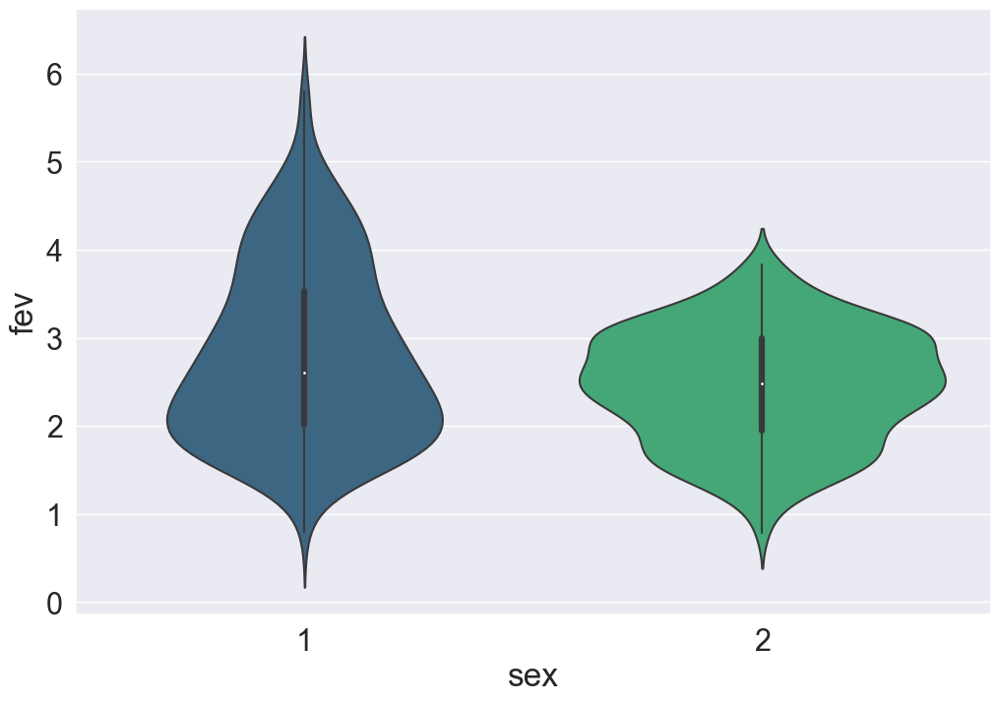

In [29]:
sns.violinplot(x='sex',y='fev',data=DepSmokers,palette='viridis')
plt.rcParams['figure.figsize'] = (12, 8)

In [30]:
fumadores_genero = (DataEjercicio1.loc[DataEjercicio1['smoke'] == 1, 'sex'].value_counts() / len(DataEjercicio1.loc[DataEjercicio1['smoke'] == 1, 'sex'])) * 100
print(f"Distribución de fumadores por género:\n{fumadores_genero}")

Distribución de fumadores por género:
2    60.0
1    40.0
Name: sex, dtype: float64


Aqui vemos como la capacidad respiratoria para hombre es significativamente mayor que para mujeres. La distribucion de fumadores entre ambos sexos es bastante similar, por lo se debe mayormente a otros aspectos desconocidos.

4. Modelaje.

In [31]:
from sklearn.model_selection import train_test_split

In [32]:
X_train, X_test, y_train, y_test = train_test_split(imputSmokers, varObj, test_size=0.2, random_state=42)

# Comprobamos dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (523, 6) (523,)
Testing dataset shape: (131, 6) (131,)


In [33]:
data_train = X_train.join(y_train)
data_train.head()

,age,height,sex,smoke,aleatorio,aleatorio2,fev
seqnbr,,,,,,,
322,12,180.34,1,2,0.017778,0.951357,1.515127
457,12,172.72,1,2,0.779967,0.029906,1.484101
341,10,157.48,1,2,0.226409,0.148285,0.661140
30,9,152.40,2,2,0.544308,0.257642,0.741937
571,10,165.10,1,2,0.464243,0.003023,1.128171


In [34]:
from statsmodels.formula.api import ols 


Modelos sin interacciones.

In [35]:
form1 = ols_formula(data_train, 'fev')

In [36]:
modeloC = ols(form1, data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     344.8
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          6.22e-177
Time:                        15:35:54   Log-Likelihood:                 259.60
No. Observations:                 523   AIC:                            -505.2
Df Residuals:                     516   BIC:                            -475.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9326      0.098    -19.716      0.000      -2.125      -1.740
sex[T.2]      -0.0260      0.013     -1.941      0.053      -0.052       0.000
smoke[T.2]     0.0396      0.024      1.665      0.097      -0.007       0.086
age            0.0236      0.004      5.955      0.000       0.016       0.031
height         0.0167      0.001     21.822      0.000       0.015       0.018
aleatorio     -0.0022      0.023     -0.095      0.925      -0.048       0.043
aleatorio2    -0.0040      0.023     -0.178      0.859      -0.049       0.040
==============================================================================
Omnibus:                       28.179   Durbin-Watson:                   2.085
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.488
Skew:                          -0.485   Prob(JB):                     1.97e-08
Kurtosis:                       3.830   Cond. No.                     2.37e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.37e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [37]:
import statsmodels.api as sm
import patsy

In [38]:

y, X = patsy.dmatrices(form1, data_train, return_type='dataframe')

model=sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     344.8
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          6.22e-177
Time:                        15:35:55   Log-Likelihood:                 259.60
No. Observations:                 523   AIC:                            -505.2
Df Residuals:                     516   BIC:                            -475.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9326      0.098    -19.716      0.000      -2.125      -1.740
sex[T.2]      -0.0260      0.013     -1.941      0.053      -0.052       0.000
smoke[T.2]     0.0396      0.024      1.665      0.097      -0.007       0.086
age            0.0236      0.004      5.955      0.000       0.016       0.031
height         0.0167      0.001     21.822      0.000       0.015       0.018
aleatorio     -0.0022      0.023     -0.095      0.925      -0.048       0.043
aleatorio2    -0.0040      0.023     -0.178      0.859      -0.049       0.040
==============================================================================
Omnibus:                       28.179   Durbin-Watson:                   2.085
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.488
Skew:                          -0.485   Prob(JB):                     1.97e-08
Kurtosis:                       3.830   Cond. No.                     2.37e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.37e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [39]:
from relativeImp import relativeImp

In [40]:
# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calculamos importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'fev', driverNames = names)

# Ordenamos valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
3,height,0.474161,59.242855
2,age,0.291822,36.460940
1,smoke[T.2],0.019662,2.456560
0,sex[T.2],0.013693,1.710805
5,aleatorio2,0.000927,0.115841
4,aleatorio,0.000104,0.012999


In [41]:
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al R2').update_yaxes(categoryorder="total ascending").show()

In [42]:
form2 = ols_formula(data_train, 'fev', 'aleatorio2', 'aleatorio')
form2

'fev ~ age + height + sex + smoke'

In [43]:
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     519.1
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          1.22e-179
Time:                        15:35:55   Log-Likelihood:                 259.58
No. Observations:                 523   AIC:                            -509.2
Df Residuals:                     518   BIC:                            -487.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9359      0.096    -20.070      0.000      -2.125      -1.746
sex[T.2]      -0.0260      0.013     -1.949      0.052      -0.052       0.000
smoke[T.2]     0.0395      0.024      1.673      0.095      -0.007       0.086
age            0.0236      0.004      5.970      0.000       0.016       0.031
height         0.0167      0.001     21.896      0.000       0.015       0.018
==============================================================================
Omnibus:                       28.485   Durbin-Watson:                   2.086
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.006
Skew:                          -0.487   Prob(JB):                     1.52e-08
Kurtosis:                       3.838   Cond. No.                     2.34e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.34e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [44]:
form3 = ols_formula(data_train, 'fev', 'aleatorio2', 'aleatorio', 'smoke')
form3

'fev ~ age + height + sex'

In [45]:
modelC3 = ols(form3, data=data_train).fit()
modelC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     688.9
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          1.73e-180
Time:                        15:35:56   Log-Likelihood:                 258.17
No. Observations:                 523   AIC:                            -508.3
Df Residuals:                     519   BIC:                            -491.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.8907      0.093    -20.384      0.000      -2.073      -1.708
sex[T.2]      -0.0277      0.013     -2.082      0.038      -0.054      -0.002
age            0.0218      0.004      5.721      0.000       0.014       0.029
height         0.0167      0.001     21.967      0.000       0.015       0.018
==============================================================================
Omnibus:                       32.280   Durbin-Watson:                   2.097
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.581
Skew:                          -0.528   Prob(JB):                     9.35e-10
Kurtosis:                       3.891   Cond. No.                     2.24e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.24e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [46]:
form4 = ols_formula(data_train, 'fev', 'aleatorio2', 'aleatorio', 'smoke', 'sex')
form4

'fev ~ age + height'

In [47]:
modelC4 = ols(form4, data=data_train).fit()
modelC4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.798
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     1025.
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          4.13e-181
Time:                        15:35:56   Log-Likelihood:                 255.99
No. Observations:                 523   AIC:                            -506.0
Df Residuals:                     520   BIC:                            -493.2
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9471      0.089    -21.879      0.000      -2.122      -1.772
age            0.0204      0.004      5.419      0.000       0.013       0.028
height         0.0171      0.001     22.993      0.000       0.016       0.019
==============================================================================
Omnibus:                       35.005   Durbin-Watson:                   2.096
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               47.917
Skew:                          -0.536   Prob(JB):                     3.93e-11
Kurtosis:                       4.025   Cond. No.                     2.14e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Tras observar el comportamiento de todos los modelos posibles, llegamos a la conclusion que el mejor modelo sin interacciones es el el siguiente:

- 'fev ~ age + height + sex + smoke'

    - R2 = 0.80
    - R2 Ajustado = 0.79
    - AIC = -509.2

Aunque el modelo que mejor rendimiento en terminos de R2 es aquel que incluye las dos variables aleatorias creadas, nos decantamos por este modelo por la naturaleza de control que tienen dichas componenentes, y por lo tanto la escasa relacion que tienen con variable dependiente. Incluso vemos la escasa significancia que tienen en el modelo cos los p-valores muy por encima de 0.05.

Por otro lado, con respecto al modelo escogido, hay que tener en cuenta que las dos componentes categoricas no son significativas. La variable _sex_ se encuentra al limite de la significatividad con un 0.05, mientras que la variable _smoke_ si presenta un p-valor mas alto, saliendose de la significativad de la variable en el modelo. Anteriormente hemos mencionado los problemas que presentaba esta variable, por lo tanto puede ser uno de los problemas fundamentales de este comportamiento.

In [48]:
stats.spearmanr(data_train['sex'],data_train['smoke'])

SignificanceResult(statistic=-0.07985793521485676, pvalue=0.06802637283187657)

Modelos con interacciones.

In [49]:
form5 = 'fev ~  height + age + smoke*sex'

In [50]:
modelC5 = ols(form5, data=data_train).fit()
modelC5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     414.7
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          2.72e-178
Time:                        15:35:57   Log-Likelihood:                 259.66
No. Observations:                 523   AIC:                            -507.3
Df Residuals:                     517   BIC:                            -481.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -1.9231      0.101    -18.978      0.000      -2.122      -1.724
smoke[T.2]              0.0284      0.036      0.798      0.425      -0.042       0.098
sex[T.2]               -0.0427      0.043     -1.003      0.316      -0.127       0.041
smoke[T.2]:sex[T.2]     0.0184      0.044      0.413      0.679      -0.069       0.106
height                  0.0166      0.001     21.794      0.000       0.015       0.018
age                     0.0237      0.004      5.979      0.000       0.016       0.032
==============================================================================
Omnibus:                       28.858   Durbin-Watson:                   2.086
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.641
Skew:                          -0.490   Prob(JB):                     1.11e-08
Kurtosis:                       3.849   Cond. No.                     2.56e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.56e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [51]:
form6 = 'fev ~  height + age*smoke + smoke + sex'
form6

'fev ~  height + age*smoke + smoke + sex'

In [52]:
modelC6 = ols(form6, data=data_train).fit()
modelC6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     416.0
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          1.41e-178
Time:                        15:35:57   Log-Likelihood:                 260.33
No. Observations:                 523   AIC:                            -508.7
Df Residuals:                     517   BIC:                            -483.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.7467      0.182     -9.574      0.000      -2.105      -1.388
smoke[T.2]        -0.1249      0.137     -0.914      0.361      -0.393       0.143
sex[T.2]          -0.0271      0.013     -2.026      0.043      -0.053      -0.001
height             0.0164      0.001     20.619      0.000       0.015       0.018
age                0.0130      0.010      1.350      0.178      -0.006       0.032
age:smoke[T.2]     0.0127      0.010      1.222      0.222      -0.008       0.033
==============================================================================
Omnibus:                       28.617   Durbin-Watson:                   2.085
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.881
Skew:                          -0.493   Prob(JB):                     1.62e-08
Kurtosis:                       3.822   Cond. No.                     5.35e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.35e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [53]:
form7 = 'fev ~  height*age + smoke + sex'
form7

'fev ~  height*age + smoke + sex'

In [54]:
modelC7 = ols(form7, data=data_train).fit()
modelC7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     414.6
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          2.88e-178
Time:                        15:35:57   Log-Likelihood:                 259.60
No. Observations:                 523   AIC:                            -507.2
Df Residuals:                     517   BIC:                            -481.6
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9828      0.220     -9.010      0.000      -2.415      -1.550
smoke[T.2]     0.0388      0.024      1.634      0.103      -0.008       0.086
sex[T.2]      -0.0268      0.014     -1.949      0.052      -0.054       0.000
height         0.0170      0.002     11.275      0.000       0.014       0.020
age            0.0293      0.024      1.208      0.228      -0.018       0.077
height:age -3.577e-05      0.000     -0.237      0.813      -0.000       0.000
==============================================================================
Omnibus:                       27.786   Durbin-Watson:                   2.087
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.785
Skew:                          -0.482   Prob(JB):                     2.80e-08
Kurtosis:                       3.816   Cond. No.                     5.73e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.73e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Por simple logica, hemos excluido las variables aleatorias de los modelos con interacciones. 

In [55]:
form8 = 'fev ~  height*smoke + age + sex'
modelC8 = ols(form8, data=data_train).fit()
modelC8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     414.7
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          2.74e-178
Time:                        15:35:58   Log-Likelihood:                 259.66
No. Observations:                 523   AIC:                            -507.3
Df Residuals:                     517   BIC:                            -481.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -2.1009      0.426     -4.930      0.000      -2.938      -1.264
smoke[T.2]            0.2125      0.436      0.488      0.626      -0.644       1.069
sex[T.2]             -0.0255      0.013     -1.899      0.058      -0.052       0.001
height                0.0176      0.003      6.922      0.000       0.013       0.023
height:smoke[T.2]    -0.0010      0.003     -0.398      0.691      -0.006       0.004
age                   0.0239      0.004      5.954      0.000       0.016       0.032
==============================================================================
Omnibus:                       28.330   Durbin-Watson:                   2.087
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.904
Skew:                          -0.484   Prob(JB):                     1.60e-08
Kurtosis:                       3.843   Cond. No.                     1.98e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.98e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [56]:
form9 = 'fev ~  smoke + age + height*sex'
modelC9 = ols(form9, data=data_train).fit()
modelC9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     414.8
Date:                Mon, 10 Jul 2023   Prob (F-statistic):          2.51e-178
Time:                        15:35:58   Log-Likelihood:                 259.74
No. Observations:                 523   AIC:                            -507.5
Df Residuals:                     517   BIC:                            -481.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -1.9603      0.105    -18.609      0.000      -2.167      -1.753
smoke[T.2]          0.0381      0.024      1.608      0.108      -0.008       0.085
sex[T.2]            0.0605      0.150      0.402      0.688      -0.235       0.356
age                 0.0238      0.004      5.993      0.000       0.016       0.032
height              0.0168      0.001     20.902      0.000       0.015       0.018
height:sex[T.2]    -0.0006      0.001     -0.577      0.564      -0.002       0.001
==============================================================================
Omnibus:                       28.661   Durbin-Watson:                   2.089
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.280
Skew:                          -0.489   Prob(JB):                     1.32e-08
Kurtosis:                       3.842   Cond. No.                     4.39e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.39e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Tras revisar las interacciones con cada una de las componentes, no obtenemos grandes resultados comparados con los modelos sin interacciones. Si tenemos que seleccionar un modelo para comepetir con el mejor sin interacciones ese va a ser:

- 'fev ~  height + age*smoke + smoke + sex'

    - R2 = 0.80
    - R2 Ajustado = 0.79
    - AIC = -508.7

Este modelo interacciona las variables _age_ y _smoke_ dando como resultado los siguientes indicadores.

Resultados muy similares a lo que tenemos en el modelo sin interacciones, aunque el AIC presenta peor comportamiento que en el modelo sin interacciones. Hemos de senyalar tambien que los parametros que en el modelo sin interacciones eran no significativos por relativamente poco, aqui lo son de forma mas clara, incluso la variable con interaccion (_smoke_ y _age_), sigue el mismo camino que las anteriormente mencionadas. Por lo tanto, con este modelo no mejoramos lo que teniamos anteriormente, sino que lo empeoramos.

In [57]:
from sklearn.linear_model import LinearRegression

In [58]:
list_form = [ form2, form6]

In [59]:
list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,DepSmokers, seed=42, ),list_form))
results = list_res.T.melt()
results.columns = ['Modelo','R2']

Modelo: fev ~ age + height + sex + smoke
Coeficiente de determinación R2: 0.769 (0.030)
Modelo: fev ~  height + age*smoke + smoke + sex
Coeficiente de determinación R2: 0.769 (0.030)


<AxesSubplot: xlabel='Modelo', ylabel='R2'>

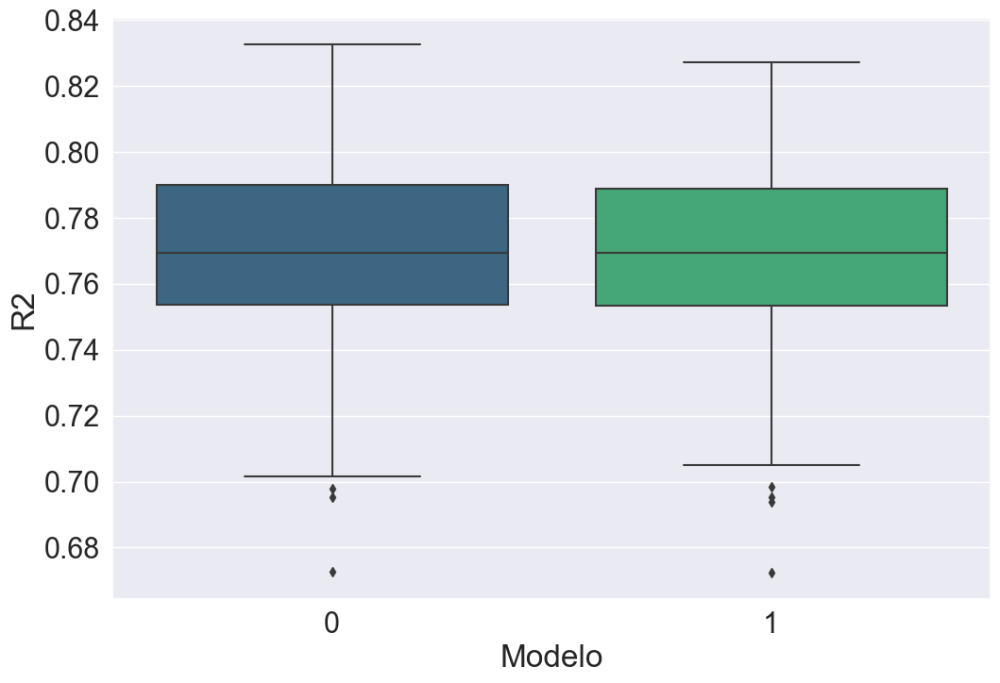

In [60]:
sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')

Tras realizar la comprobacion por validacion curzada, tenemos mismos resultados:

- **Modelo 1: fev ~ age + height + sex + smoke:** Coeficiente de determinación R2: 0.769 (0.030)
- **Modelo 2: fev ~  height + age*smoke + smoke + sex**: Coeficiente de determinación R2: 0.769 (0.030)

Por lo tanto, nos quedamos con el modelo sin interacciones que integra todas las variables (Modelo 1), por tres motivos principalmente:
- En primer lugar, la significancia de las variables tiene mejor comportamiento, recordemos que en el modelo con interaccion las variables categoricas como la interaccionada presentaba unos p-valores bastante altos.
- En segundo lugar, principio de parsimonia, Modelo 1 tiene menos componentes.
- En tercer lugar, mejor comportamiento en cuanto al criterio de AIC.

## **Ejercicio 2**

Con los datos de la serie de “defunciones.xlsx” que se encuentra en la carpeta de  datos de la documentación, se pretende ajustar el mejor modelo de series temporales a cualquiera de las series allí contenidas (elige 1).


Cargamos el dataset y le hacemos las modificaciones pertinentes para poder realizar el analisis de series temporales.

In [61]:
ruta_archivo_ejercicio2 = path.join(ruta_carpeta, "defunciones.xlsx")

data_ejercicio2 = pd.read_excel(ruta_archivo_ejercicio2, index_col=0)
data_ejercicio2.head()

,Todas las causas,Tumores,Causas externas
,,,
1980M01,28681,4883,1277
1980M02,23906,4493,1122
1980M03,25275,4957,1244
1980M04,22500,4523,1214
1980M05,22781,4893,1228


In [62]:
data_ejercicio2.index = data_ejercicio2.index.str.strip()
data_ejercicio2.index = pd.to_datetime(data_ejercicio2.index, format= "%YM%m")

In [63]:
data_ejercicio2.head()

,Todas las causas,Tumores,Causas externas
,,,
1980-01-01,28681,4883,1277
1980-02-01,23906,4493,1122
1980-03-01,25275,4957,1244
1980-04-01,22500,4523,1214
1980-05-01,22781,4893,1228


Tras meditarlo, me dispongo a utilizar la columna 'Tumores' del dataset. En primer lugar, vamos a realizar un representacion grafica del dataset completo, para ver que aspecto tiene.

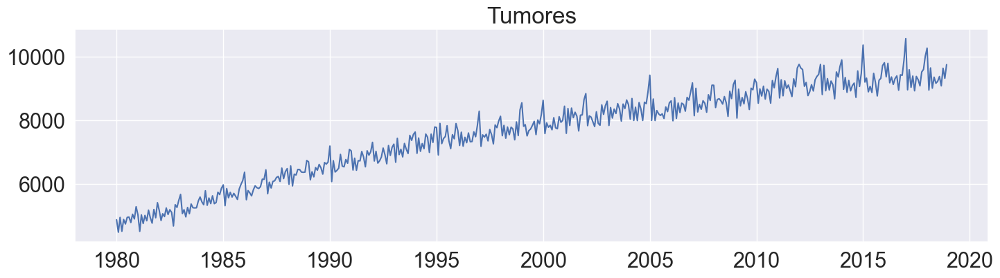

In [64]:
Tumors = data_ejercicio2['Tumores']

plt.figure(figsize=(17, 4))
plt.plot(Tumors)
plt.title('Tumores')
plt.show()

Apreciamos que la evolucion de las defunciones causada por tumores tiene una tendencia creciente desde el inicio de registros.

Para poder empezar a realizar el analisis de series temporales, debemos primero estudiar la variable. Para ello, vamos a aplicar un test para ver si la variable tiene como caracteristica la estacionariedad.

La estacionariedad es la una cualidad de las series temporales en la que la variable mantiene media y mediana a lo largo de su evolucion.

La estacionariedad es una caracteristica importante en el analisis de series temporales. Por lo tanto para observar si se aplica a esta serie, vamos a utilizar el test de Dickey-Fuller con la funcion _test_stationarity_. Sin embargo, podemos adelantar la no estacionariedad de la seria principalmente por la presencia de tendencia.



- H0: La serie NO es estacionaria
- H1: La serie es estacionaria

Nos interesa un p-valor valor para poder rechazar la hipotesis nula.

In [65]:
from statsmodels.tsa.stattools import adfuller

cambiar parametro

In [66]:
test_stationarity(Tumors)

Results of Dickey-Fuller Test:
Test Statistic                  -0.373400
p-value                          0.987651
#Lags Used                      11.000000
Number of Observations Used    456.000000
Critical Value (1%)             -3.978761
Critical Value (5%)             -3.420162
Critical Value (10%)            -3.132739
dtype: float64


P-Valor = 0.98 

No podemos rechazar la hipotesis nula, por lo que no podemos afirmar que nuestra serie sea estacionaria.

1. Descomposicion

Una vez observada la no estacioneriedad de la serie, procedemos a descomponerla para observar las componentes de la misma, es decir, tendencia, estacionalidad y residuos.

Aparentemente, la descomposocion mas oportuna es la multiplicativa, debido fundamentalmente a la variacion de las fluctuaciones a medida que varia la tendencia. Sin embargo, vamos a aplicar ambos metodos y observamos resultados

- Metodo Aditivo

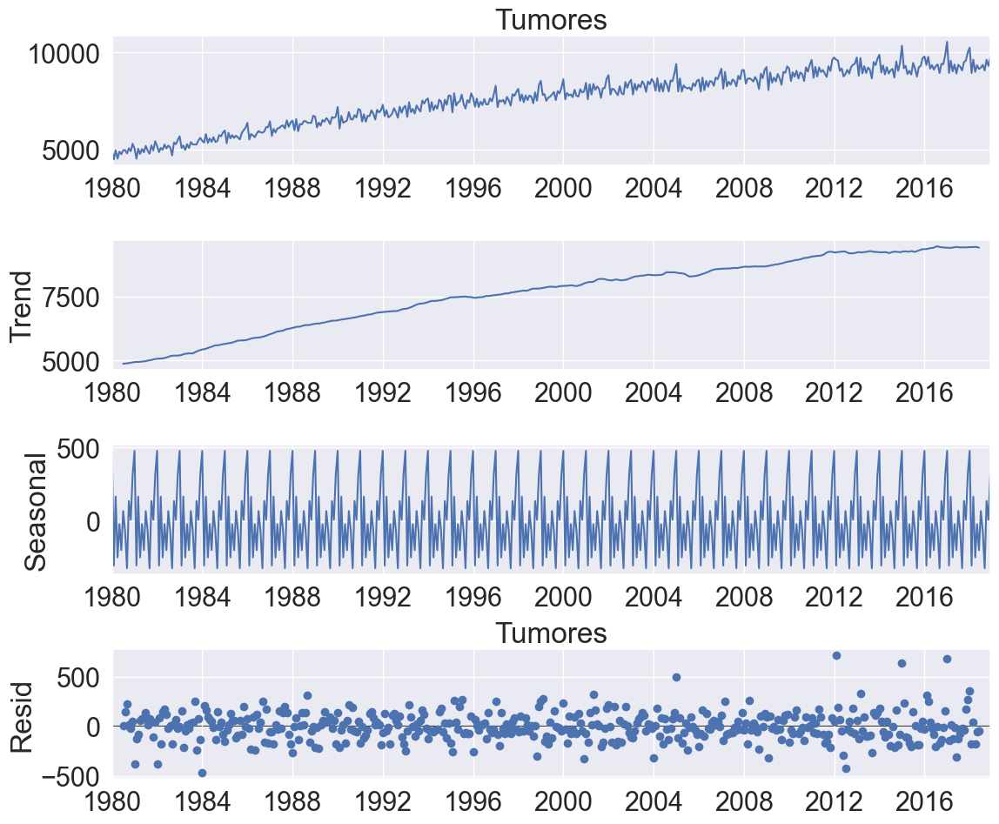

In [67]:
from statsmodels.tsa.seasonal import seasonal_decompose

Tumor_desc_Ad = seasonal_decompose(Tumors, model='additive',period=12)
plt.rcParams["figure.figsize"] = (12,10)
Tumor_desc_Ad.plot()
plt.title('Tumores')
plt.show()


Se ven claramente todas las componentes y su evolucion. 
Por otra parte aplicamos el test de estacionariedad a los residuos. Recordemos que nos interesa un p-valor bajo para poder rechazar la hipotesis nula.

In [68]:
test_stationarity(Tumor_desc_Ad.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -8.913262e+00
p-value                        5.704945e-13
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.979589e+00
Critical Value (5%)           -3.420561e+00
Critical Value (10%)          -3.132974e+00
dtype: float64


Con este p-valor tan bajo podemos decir que la serie de residuos, una vez extraida las componentes de tendencia y estacionalidad, es estacionaria.



Vamos ver el comportamiento aplicando el metodo multiplicativo.

In [69]:
Tumor_desc_Mul = seasonal_decompose(Tumors, model='multiplicative',period=12)

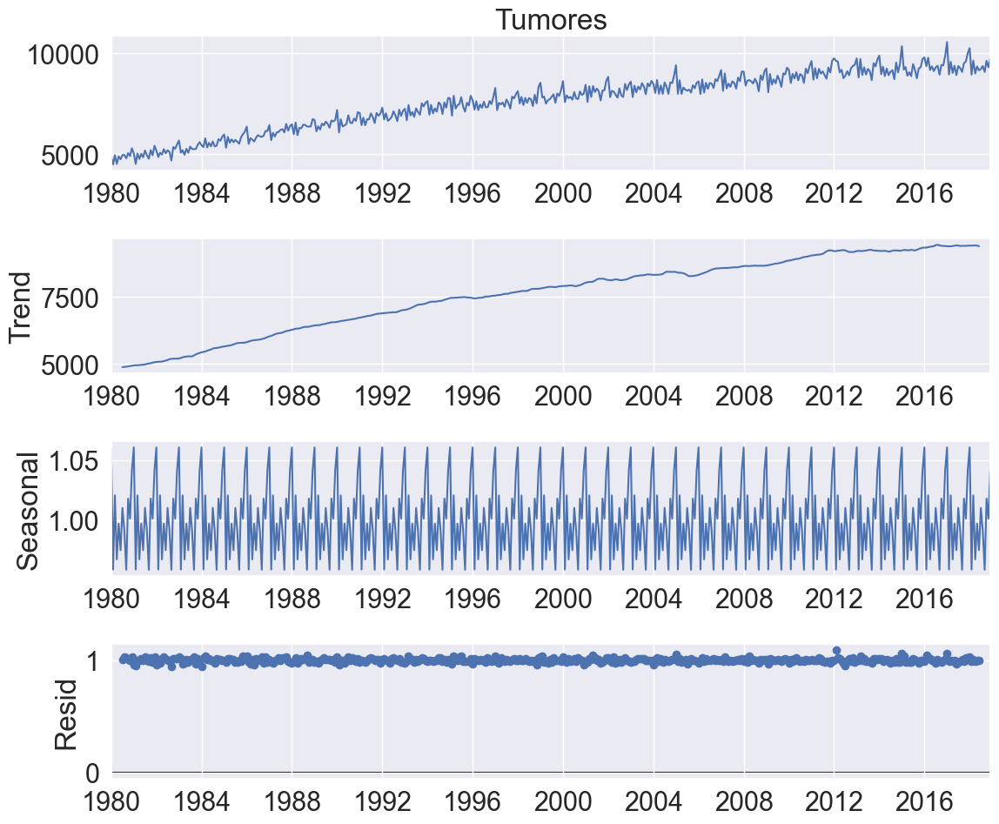

In [70]:
Tumor_desc_Mul.plot()
plt.rcParams["figure.figsize"] = (12,10)
plt.show()


In [71]:
test_stationarity(Tumor_desc_Mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.081083e+00
p-value                        2.381654e-13
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.979589e+00
Critical Value (5%)           -3.420561e+00
Critical Value (10%)          -3.132974e+00
dtype: float64


Mismamente, podemos rechazar la hipotesis nula, ya que el p-valor es bastante bajo. Por lo tanto podemos decir que los residuos son estacionarios, es decir existen raices unitarias en el polinomio caracteristico.

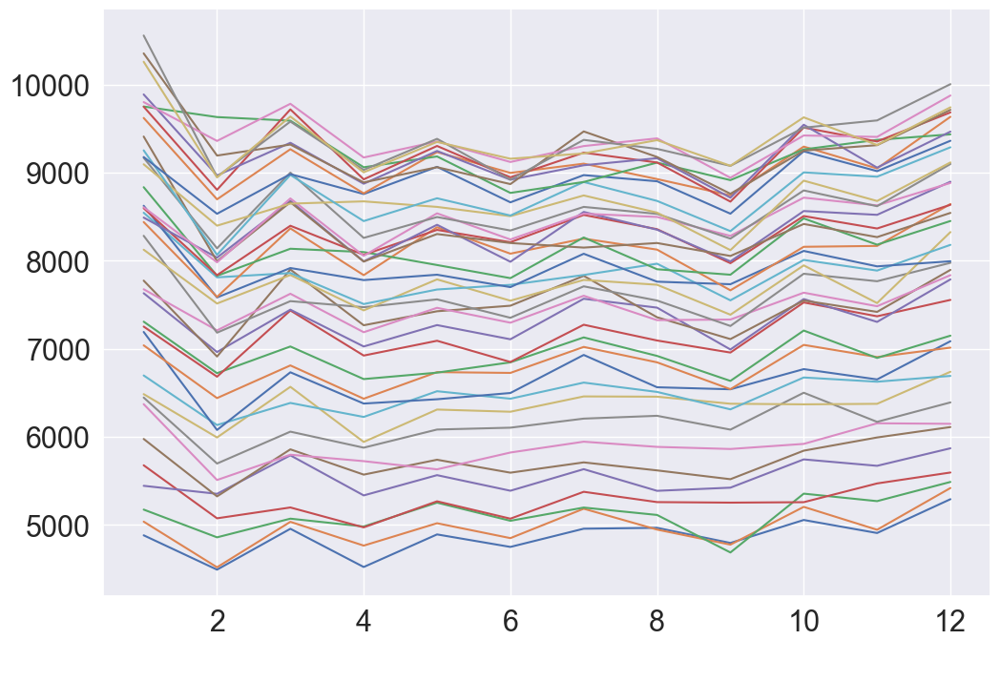

In [72]:
seasonal_plot(data_ejercicio2, column = 'Tumores')
plt.legend().set_visible(False)

A partir de ahora vamos a buscar la estacionaredad de la serie. Para ello vamos a:

- Estabilizar varianza 
- Diferenciacion regular
- Diferenciacion estacional

1. Estabilizacion de la varianza

Para proceder a estabilizar la varianza, vamos aplicar logaritmos a la serie, utilzando numpy.

<AxesSubplot: xlabel=' '>

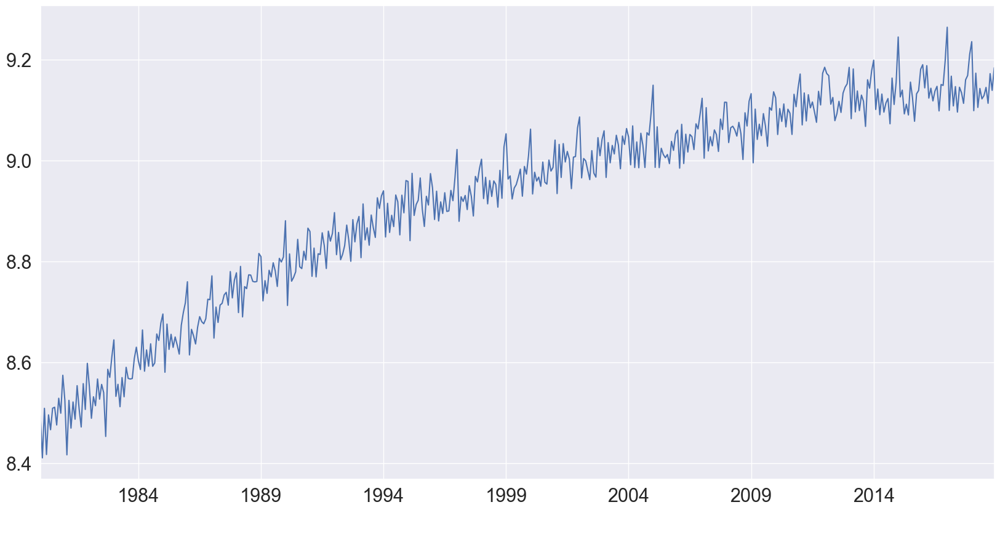

In [73]:
TumorsLog = np.log(Tumors)
plt.rcParams["figure.figsize"] = (20,10)
TumorsLog.plot()

2. Diferenciacion regular

Aplicamos la funcion diff de pandas, especificando el periodo 1

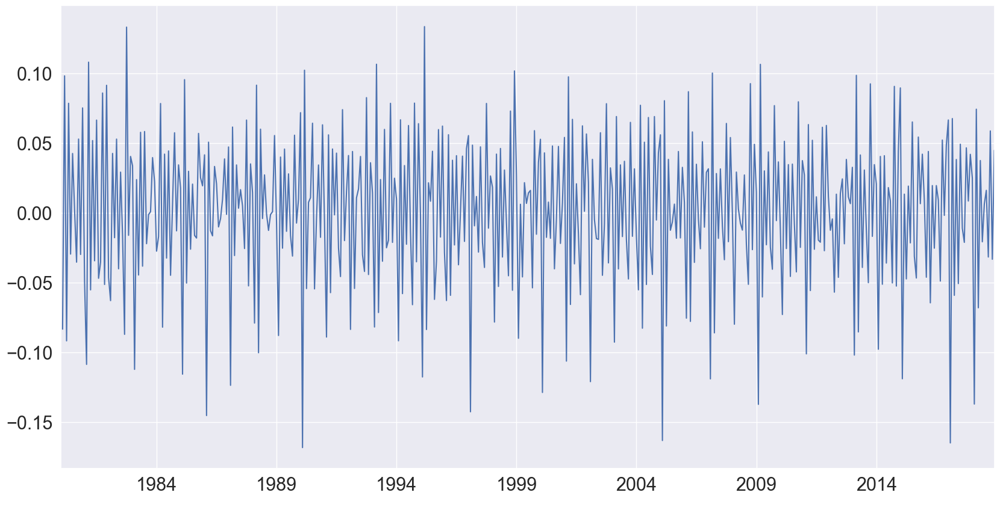

In [74]:
TumorsLog_diff_1 = TumorsLog.diff(periods= 1)
TumorsLog_diff_1.plot()
plt.show()

3. Diferenciacion estacional

Mismo proceso que anteriormente, solo que cambiando el parametro period a 12.

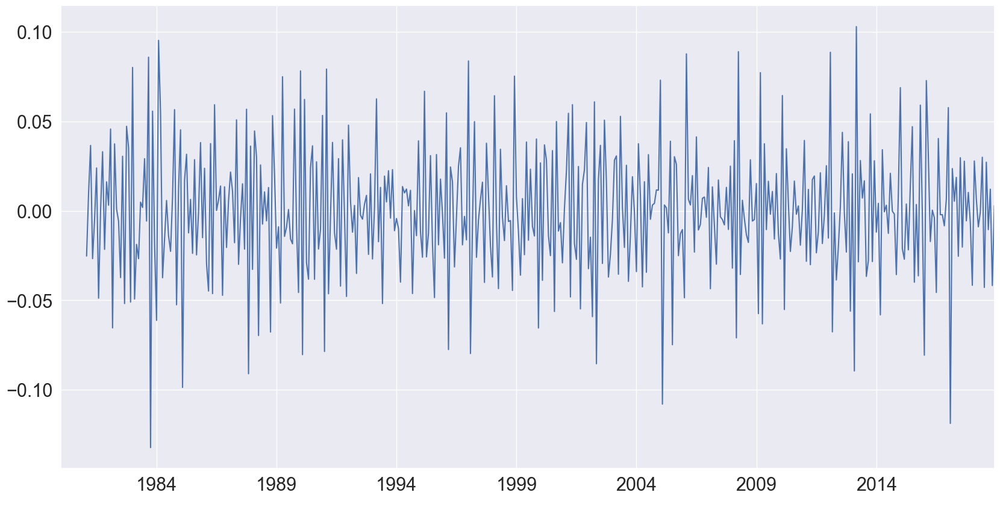

In [75]:
TumorsLog_diff_1_12 = TumorsLog_diff_1.diff(periods= 12)
TumorsLog_diff_1_12.plot()
plt.show()

In [76]:
test_stationarity(TumorsLog_diff_1_12.dropna(inplace = False))

Results of Dickey-Fuller Test:
Test Statistic                -9.999930e+00
p-value                        2.307979e-15
#Lags Used                     1.800000e+01
Number of Observations Used    4.360000e+02
Critical Value (1%)           -3.979685e+00
Critical Value (5%)           -3.420608e+00
Critical Value (10%)          -3.133001e+00
dtype: float64


Ahora si aplicamos el test de estacionariedad y hemos coseguido que la serie se vuelva como tal. Una vez conseguido, procedemos al planteamiento de modelos de prediccion. 

En primer lugar vamos a obtar por los modelos de suavizado:

- Modelo de Alisado Simple
- Modelo de Alisado Doble de Holt
- Modelo de Alisado Holt-Winters Aditivo 
- Modelo de Alisado Holt-Winters Multiplicativo 

Estudio de la autocorrelacion

In [77]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


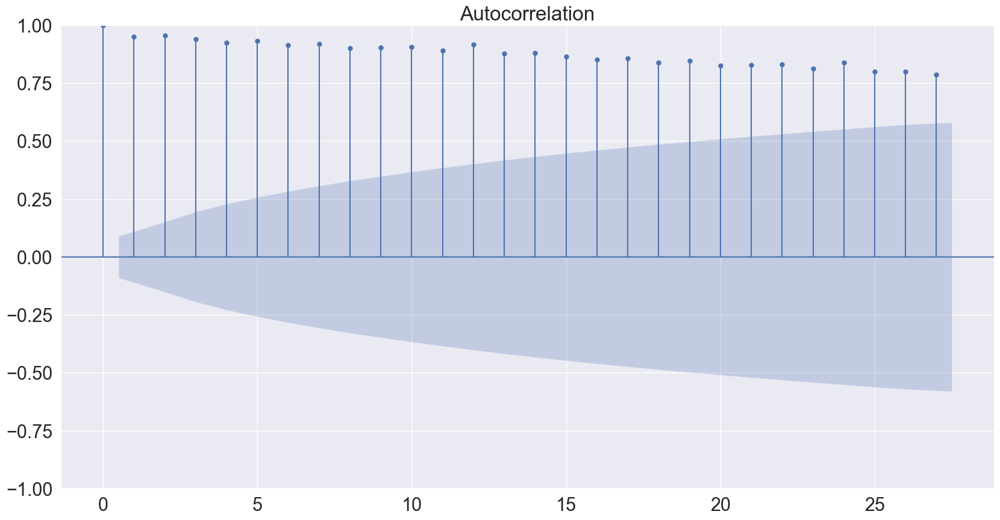

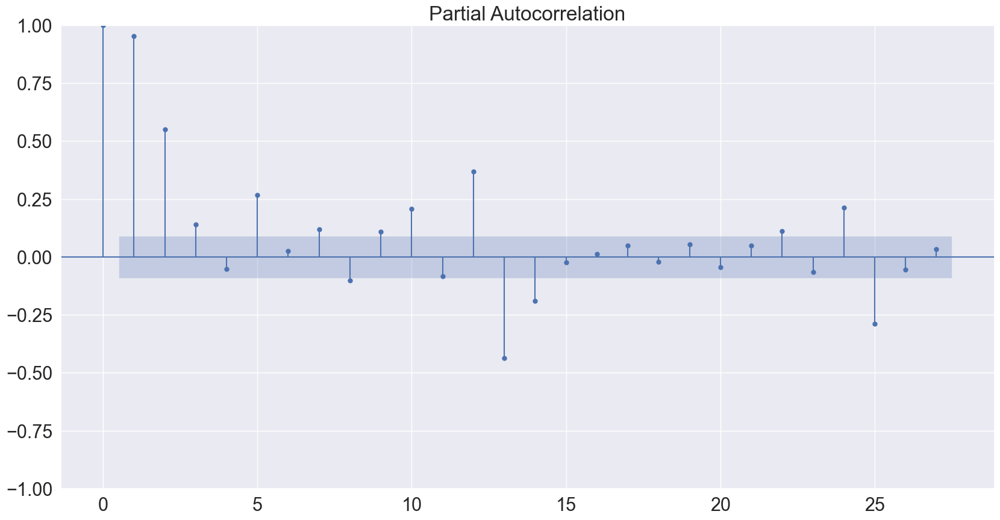

In [78]:
plot_acf(Tumors)
plt.show()
plot_pacf(Tumors)
plt.show()

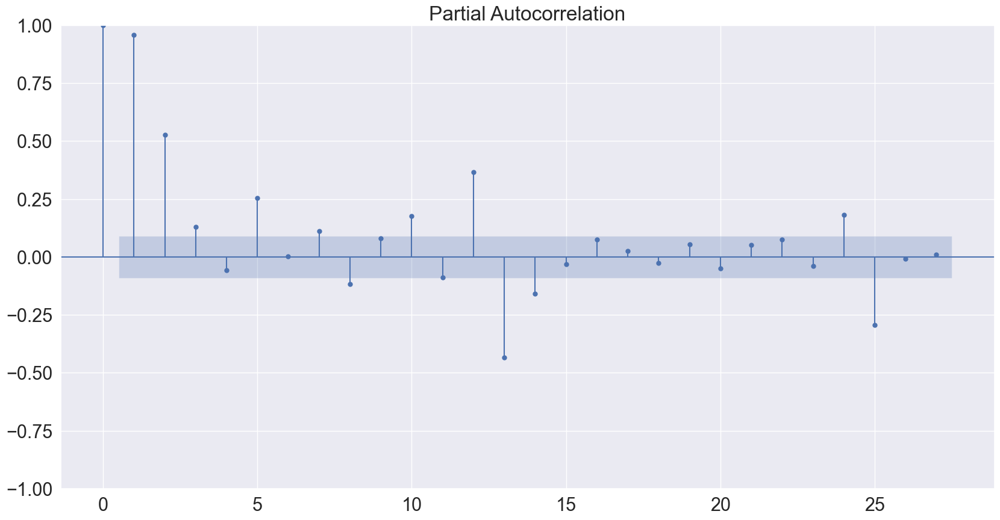

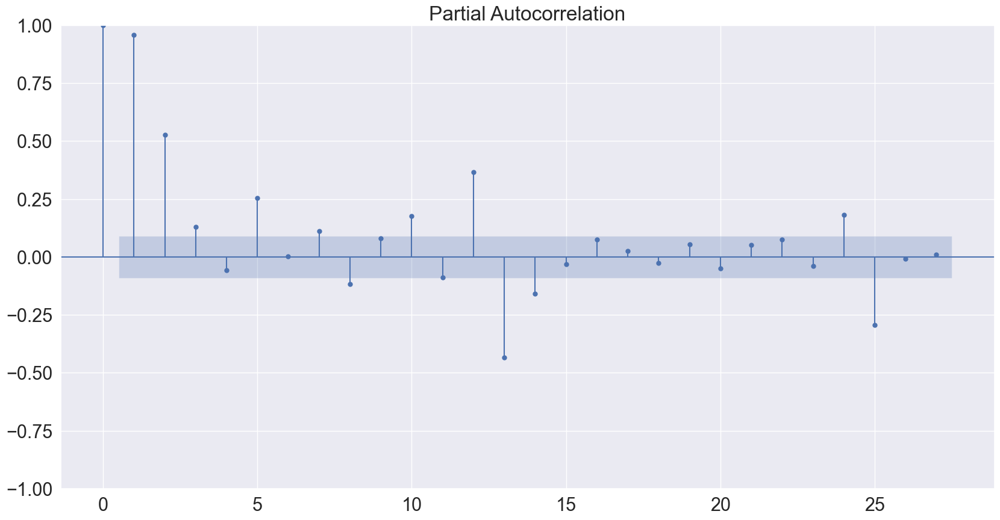

In [79]:
plot_pacf(TumorsLog.dropna(inplace=False))


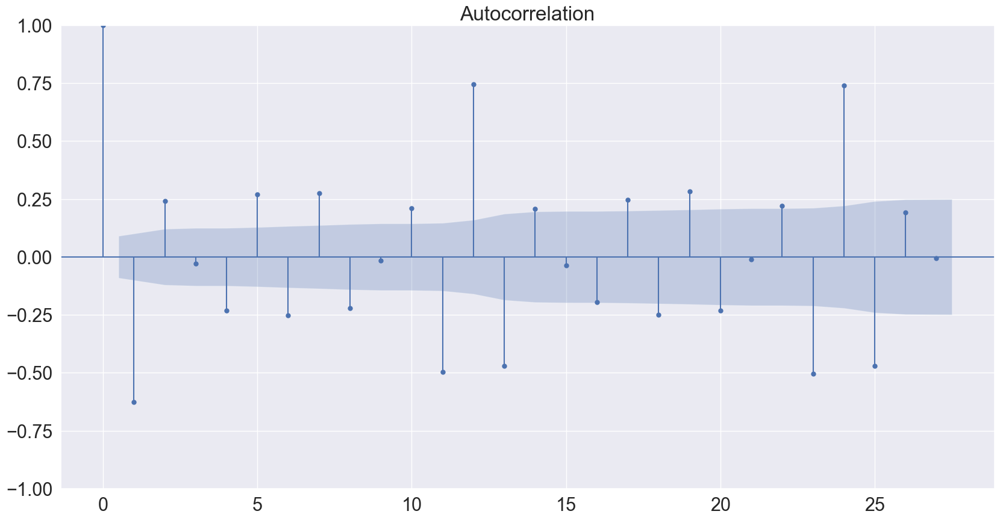

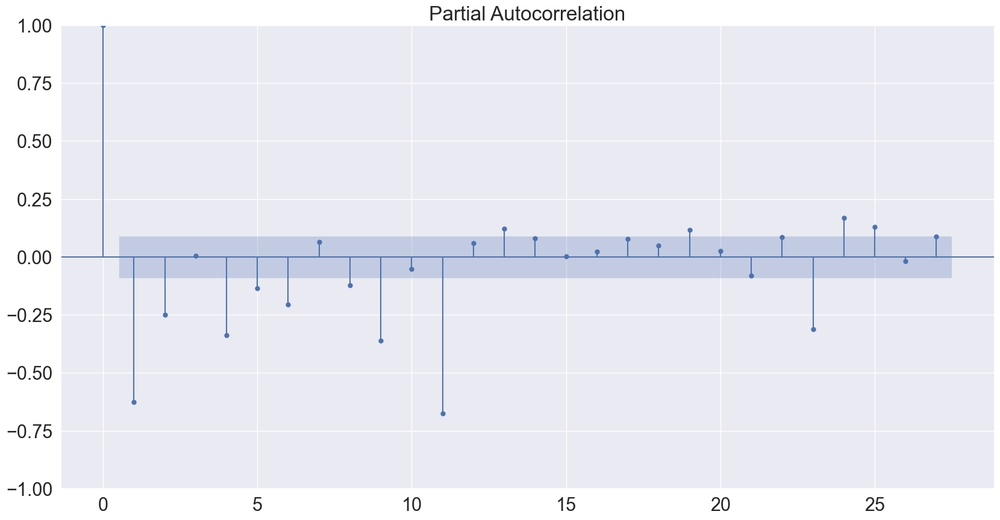

In [80]:
plot_acf(TumorsLog_diff_1.dropna(inplace = False))
plt.show()
plot_pacf(TumorsLog_diff_1.dropna(inplace = False))
plt.show()

En el grafico de arriba aplicamos el correlograma a la serie diferenciada en primer grado, es decir, una vez elimidada la tendencia, y se observa un mejor aspecto del correlograma, aunque se aprecia la componente eestacional. Veamos el aspecto del mismo una vez diferenciado para eliminar la estacionalidad.

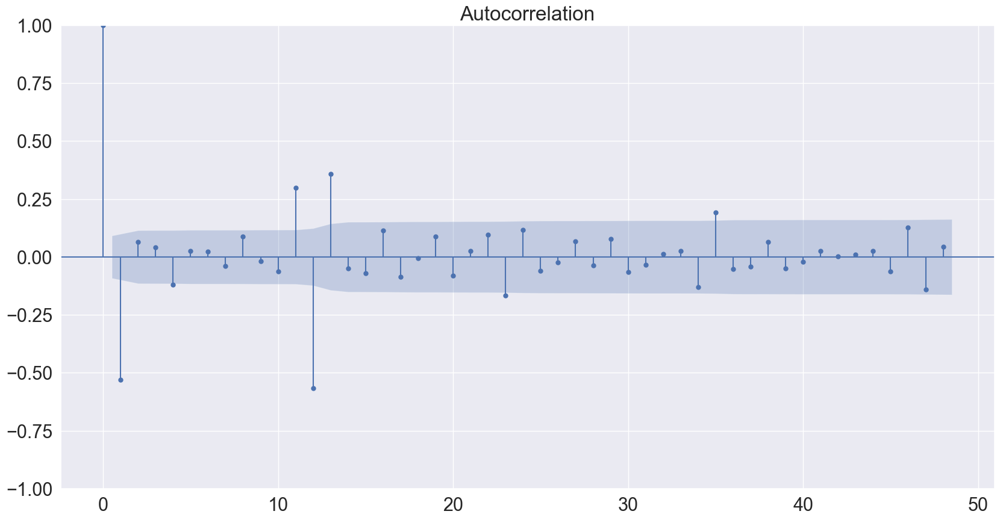

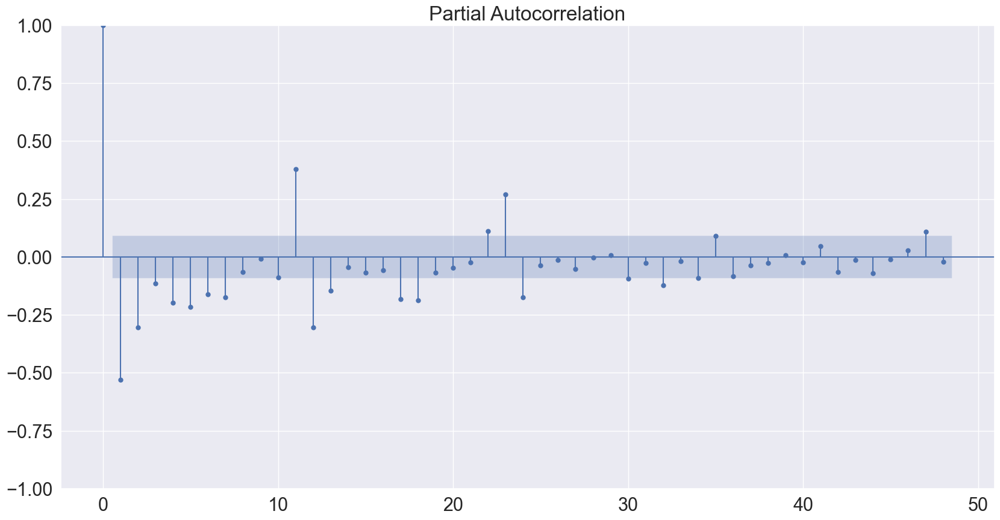

In [81]:
plot_acf(TumorsLog_diff_1_12.dropna(inplace = False), lags = 48)
plt.show()
plot_pacf(TumorsLog_diff_1_12.dropna(inplace = False), lags = 48, method='ywm')
plt.show()

Esto ya pinta mejor, vemos como la autocorrelacion estacional ha bajado bastante, aunque aun se sigue viendo. Con todo esto, nos lanzamos hacia la modelizacion y propondremos modelos en base a estos patrones observamos.

In [82]:
sm.stats.acorr_ljungbox(TumorsLog_diff_1_12.dropna(inplace = False), lags = 12, return_df=True)

,lb_stat,lb_pvalue
1,129.277008,5.898437e-30
2,131.195826,3.244804e-29
3,131.960187,2.044681e-28
4,138.668658,5.440652e-29
5,138.992492,2.929607e-28
6,139.241231,1.449008e-27
7,139.929947,5.257683e-27
8,143.423489,4.601465e-27
9,143.595483,1.865387e-26
10,145.371793,3.332200e-26


In [83]:
sm.stats.acorr_ljungbox(Tumors, lags = 12, return_df=True)

,lb_stat,lb_pvalue
1,426.225823,1.077322e-94
2,856.558157,1.001750e-186
3,1273.280096,9.235979e-276
4,1678.427887,0.000000e+00
5,2089.938925,0.000000e+00
6,2487.653902,0.000000e+00
7,2891.188612,0.000000e+00
8,3280.311834,0.000000e+00
9,3671.927203,0.000000e+00
10,4066.106965,0.000000e+00


In [84]:
import statsmodels.tsa.holtwinters as ets
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

In [85]:
Tumors_tr = TumorsLog[:'2015-12-01'] 
Tumors_test = TumorsLog['2016-01-01':]


### Modelos de Suavizado

In [86]:
hw_add = ets.ExponentialSmoothing(Tumors_tr,trend='add', damped_trend=False, seasonal='add').fit()
hw_add.summary()


Dep. Variable:,Tumores,No. Observations:,432
Model:,ExponentialSmoothing,SSE,0.163
Optimized:,True,AIC,-3374.492
Trend:,Additive,BIC,-3309.397
Seasonal:,Additive,AICC,-3372.836
Seasonal Periods:,12,Date:,"Mon, 10 Jul 2023"
Box-Cox:,False,Time:,15:36:11
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1368114,alpha,True
smoothing_trend,0.0260989,beta,True


No se porque razon la funcion _evalmodel_ de NuestrasFunciones me representa erronamente los graficos He eliminado el parametro figsize y la importo directamente en el notebook y parace ser que funciona. Ademas le he anyadido el parametro _ylabel_ anaydirle la etiqueta correspondiente en el eje Y, ya que venia _Pasajeros_ por defecto.

In [87]:
def eval_model(model,tr,tst,name='Model',lags=12, y_label = None):
    lb = np.mean(sm.stats.acorr_ljungbox(model.resid, lags=lags, return_df=True).lb_pvalue)
    pred = model.forecast(steps=len(tst))
    fig1, ax = plt.subplots()
    ax.plot(tr, label='training')
    ax.plot(tst, label='test')
    ax.plot(pred, label='prediction')
    plt.legend(loc='upper left')
    tit = name + ":  LjungBox p-value --> " + str(lb) + "\n MAPE: " + str(round(mean_absolute_percentage_error(tst, pred)*100,2)) + "%"
    plt.title(tit)
    plt.ylabel(y_label)
    plt.xlabel('Date')
    plt.show()
    print(lb)
 

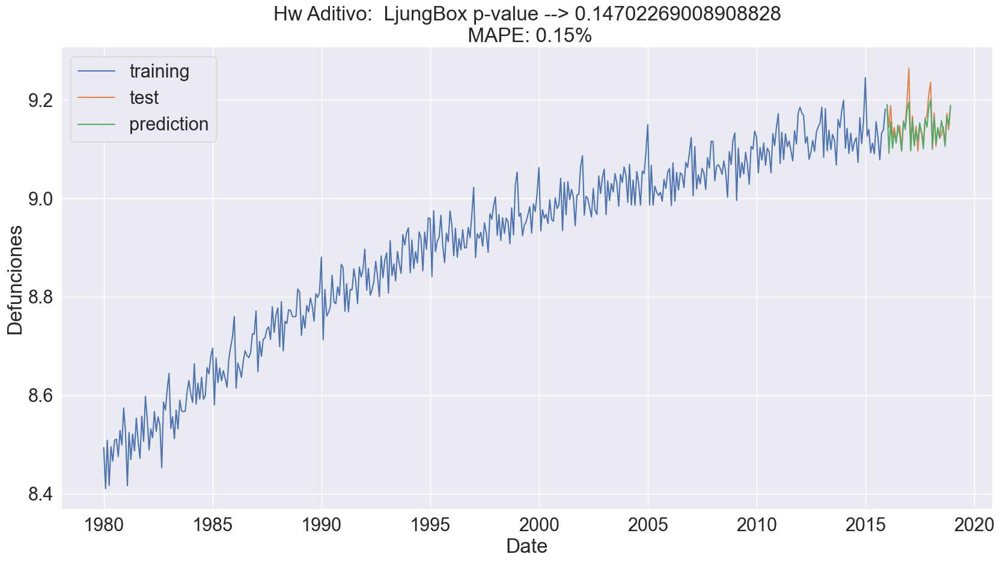

0.14702269008908828


In [88]:
eval_model(hw_add,Tumors_tr,Tumors_test,'Hw Aditivo', lags=12, y_label = 'Defunciones')
plt.show()

In [89]:
hw_mul = ets.ExponentialSmoothing(Tumors_tr,trend='mul', damped_trend=False, seasonal='mul').fit()
hw_mul.summary()

Dep. Variable:,Tumores,No. Observations:,432
Model:,ExponentialSmoothing,SSE,0.163
Optimized:,True,AIC,-3373.969
Trend:,Multiplicative,BIC,-3308.875
Seasonal:,Multiplicative,AICC,-3372.313
Seasonal Periods:,12,Date:,"Mon, 10 Jul 2023"
Box-Cox:,False,Time:,15:36:12
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1348702,alpha,True
smoothing_trend,0.0265166,beta,True


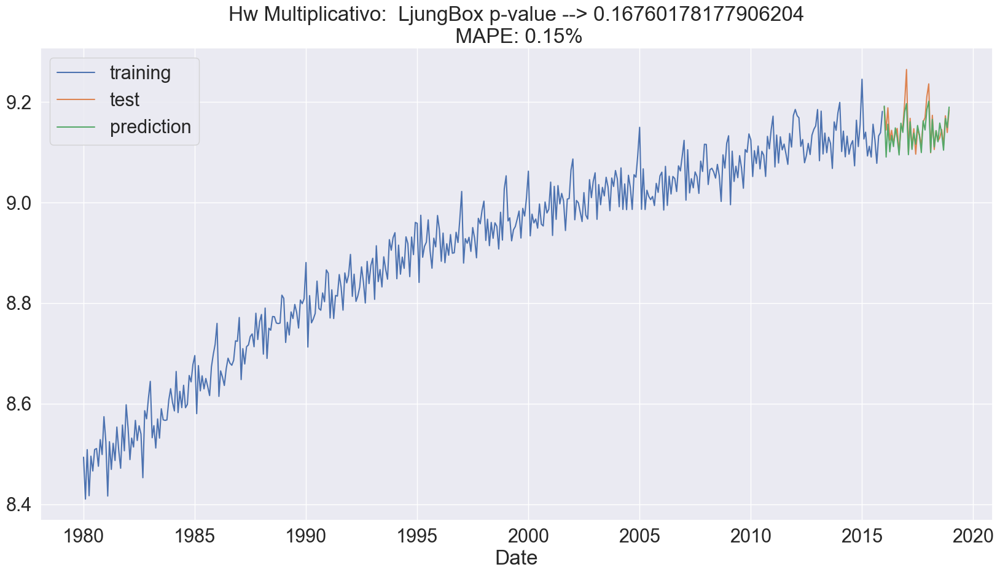

0.16760178177906204


In [90]:
eval_model(hw_mul,Tumors_tr,Tumors_test,'Hw Multiplicativo')

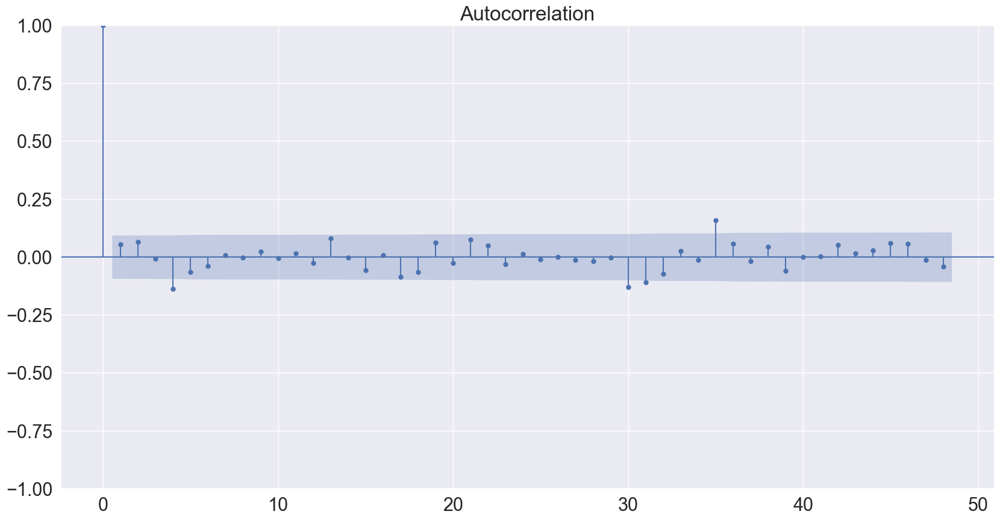

In [91]:
plot_acf(hw_add.resid.dropna(inplace = False), lags = 48)
plt.show()

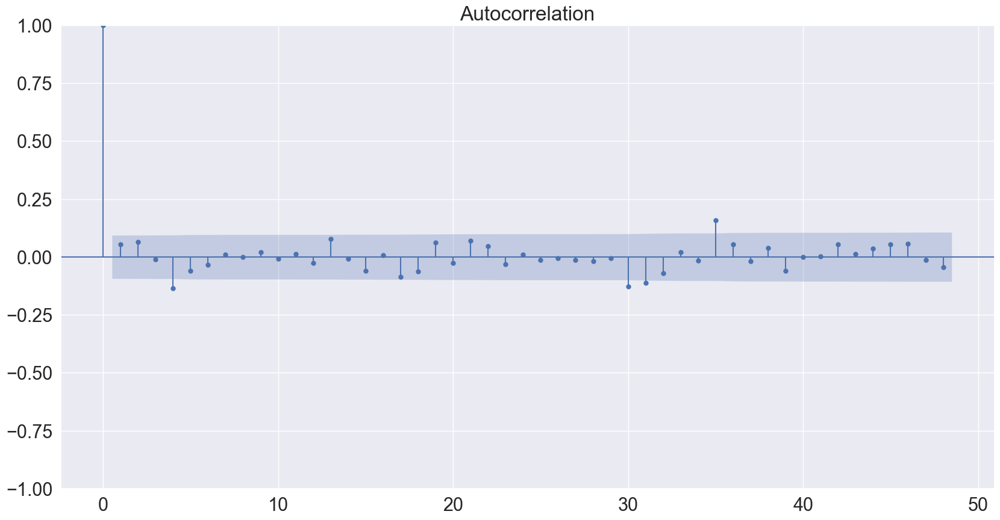

In [92]:
plot_acf(hw_mul.resid.dropna(inplace = False), lags = 48)
plt.show()

### Modelos ARIMA

In [93]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

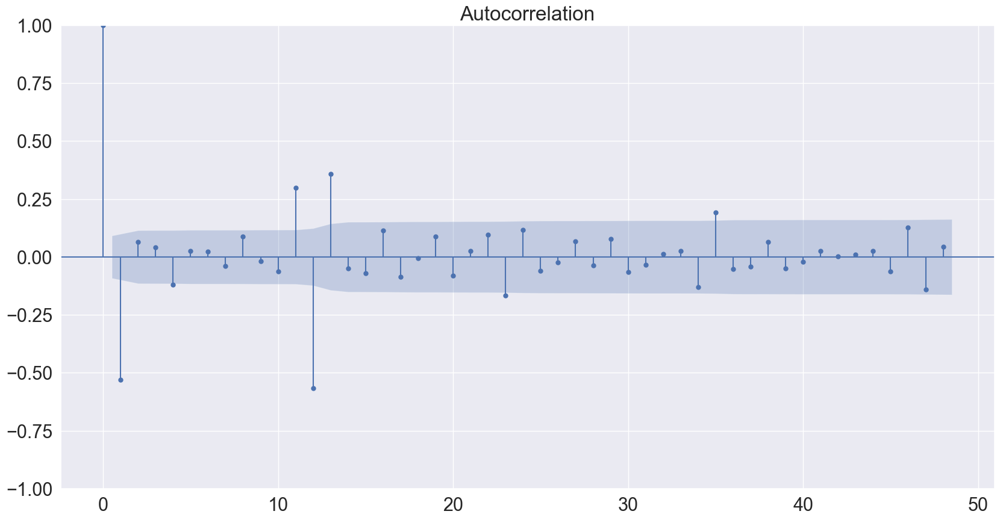

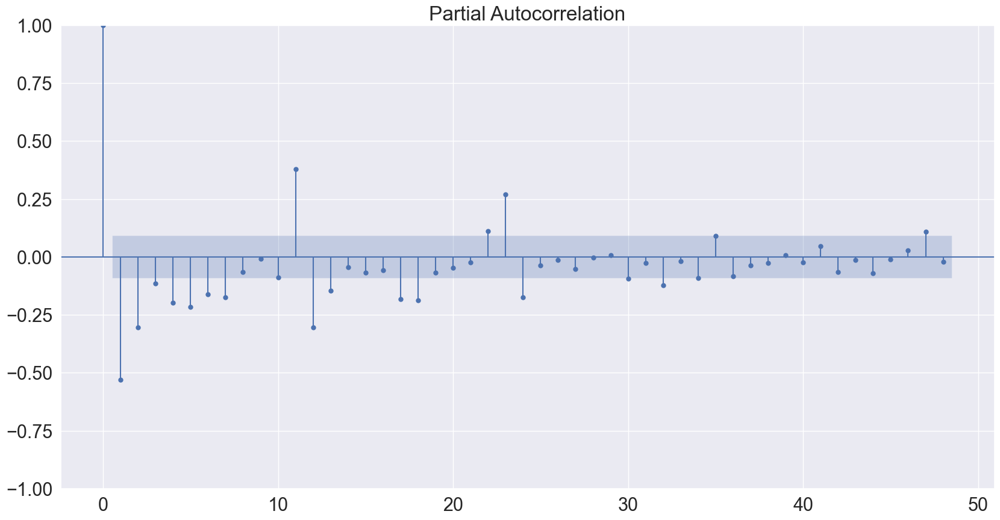

In [94]:
plot_acf(TumorsLog_diff_1_12.dropna(inplace = False), lags = 48)
plt.show()
plot_pacf(TumorsLog_diff_1_12.dropna(inplace = False), lags = 48, method='ywm')
plt.show()


En lo regular, se aprecia un patron mas adecuado para una compente MA, ya que el ACF corta rapidamente, mientras que el PACF decrece bastante rapido, por lo que confirmamos MA orden 1, aunque no tenemos corte haste el retardo 6, me hace dudar por lo que vamos a incluir MA orden 1 y 0 .

En los estacional, en ACF 12 significativo y corte a partir de 24. Sintoma de MA orden 1 En la PACF, tenemos un decrecmiento rapido, por lo tanto sintoma de MA claro, confirmamos orden 1. 

Como hemos diferenciado tanto en lo regular como en lo estacional.

- d = 1
- D = 1 

Dado estas observaciones el modelo ARIMA manual propuesto para esta serie es con todas las componentes MA (0,1,0-1)(0,1,1)12



In [95]:
  
arima1 = SARIMAX(Tumors_tr, 
                order = (0, 1, 0), 
                seasonal_order =(0, 1, 1, 12))
  
arima_1 = arima1.fit()
arima_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                              Tumores   No. Observations:                  432
Model:             SARIMAX(0, 1, 0)x(0, 1, [1], 12)   Log Likelihood                 927.195
Date:                              Mon, 10 Jul 2023   AIC                          -1850.389
Time:                                      15:36:16   BIC                          -1842.313
Sample:                                  01-01-1980   HQIC                         -1847.197
                                       - 12-01-2015                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L12      -0.9783      0.100     -9.802      0.000      -1.174      -0.783
sigma2         0.0006   6.17e-05     10.431      0.000       0.001       0.001
===================================================================================
Ljung-Box (L1) (Q):                 106.58   Jarque-Bera (JB):                 6.46
Prob(Q):                              0.00   Prob(JB):                         0.04
Heteroskedasticity (H):               0.65   Skew:                             0.12
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.56
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

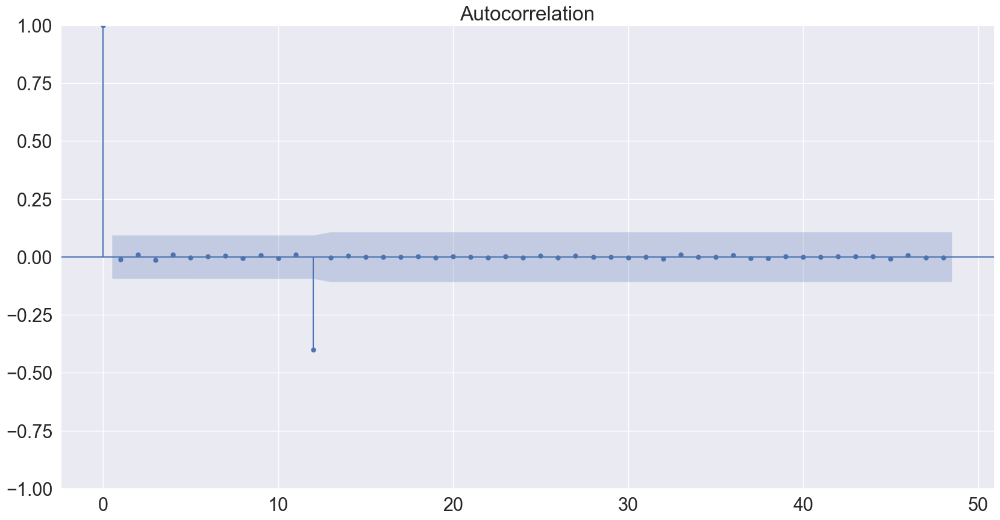

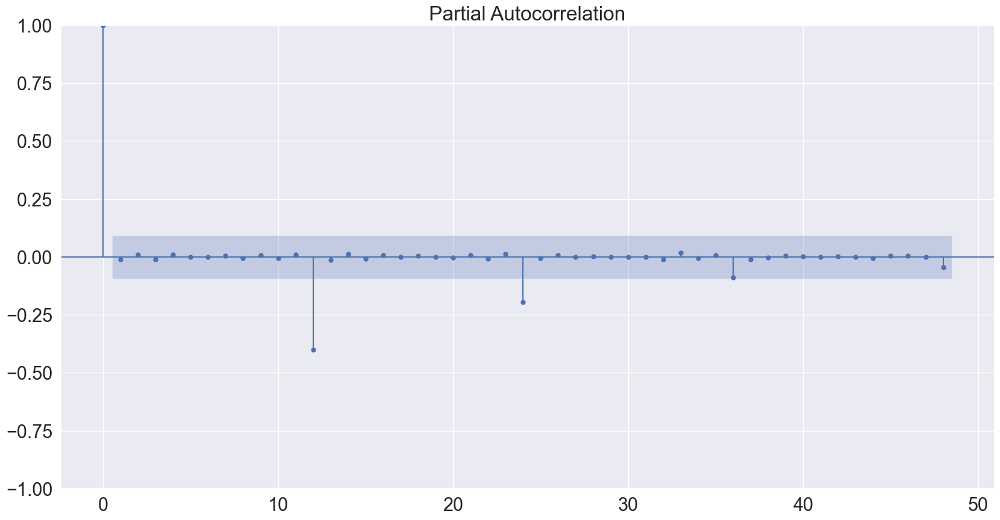

In [96]:
plot_acf(arima_1.resid,lags=48)
plt.show()
plot_pacf(arima_1.resid,lags=48,method='ywm')
plt.show()


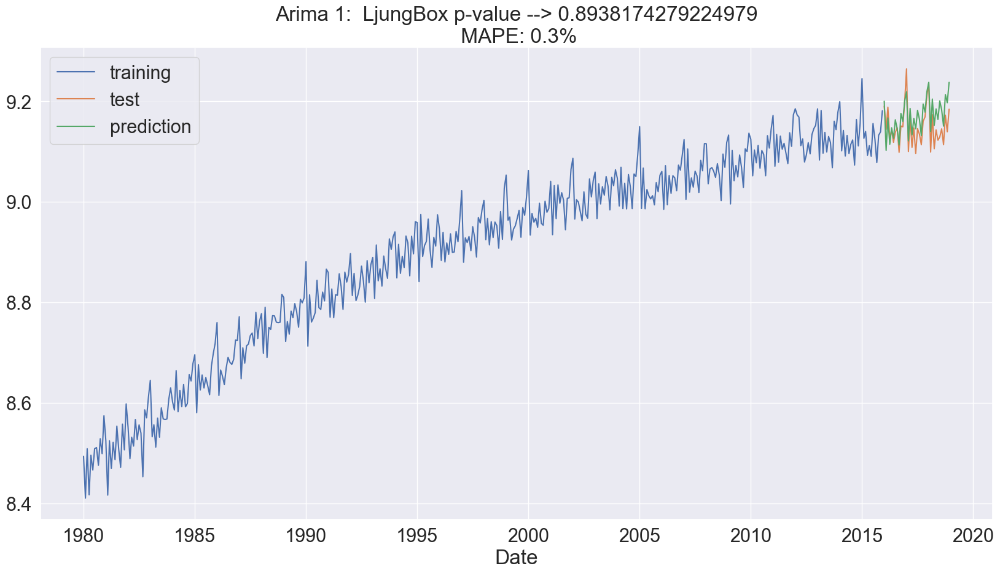

0.8938174279224979


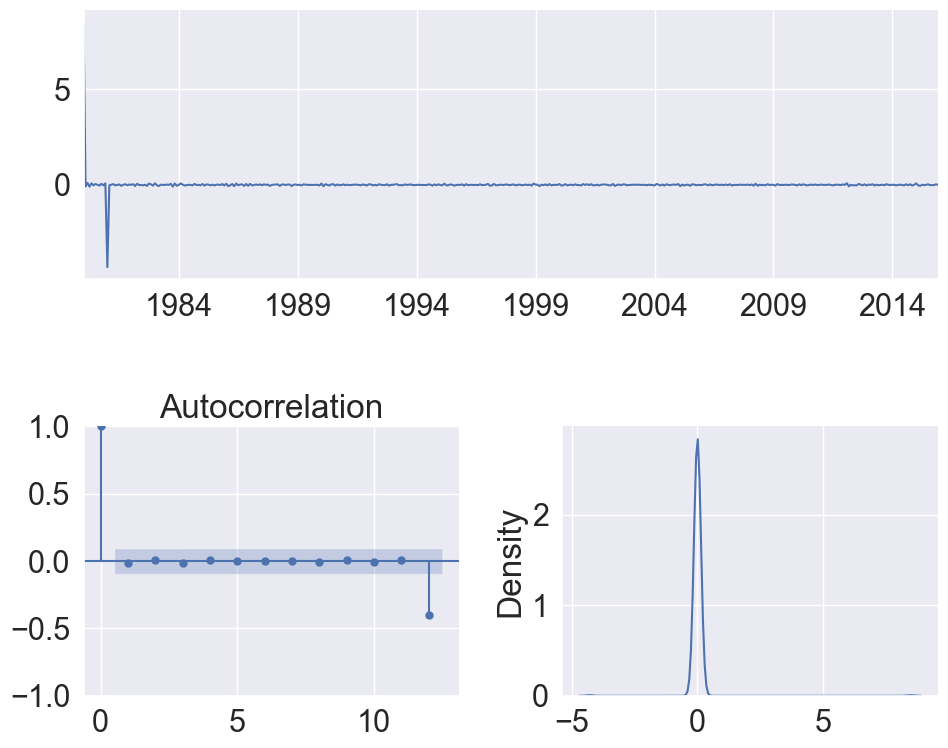

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.894 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel=' '>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [97]:
eval_model(arima_1,Tumors_tr,Tumors_test,'Arima 1')

residcheck(arima_1.resid,12)

El resultado de este modelo no esta mal, sin embargo haciendo una comparativa con los modelos de suavizado anteriormente representados, observamos un mayor error. Por lo tanto, serio candidato a ser eliminado. Continuamos con el sigueinte modelo ARIMA, en el que anyadimos la componente regular en MA con orden 1.

In [98]:
arima_2 = SARIMAX(Tumors_tr, 
                order = (0, 1, 1), 
                seasonal_order =(0, 1, 1, 12))
  
arima_2 = arima_2.fit()
arima_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            Tumores   No. Observations:                  432
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                1030.558
Date:                            Mon, 10 Jul 2023   AIC                          -2055.116
Time:                                    15:36:19   BIC                          -2043.002
Sample:                                01-01-1980   HQIC                         -2050.327
                                     - 12-01-2015                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8356      0.030    -27.755      0.000      -0.895      -0.777
ma.S.L12      -0.8667      0.040    -21.932      0.000      -0.944      -0.789
sigma2         0.0004    2.3e-05     17.808      0.000       0.000       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                46.04
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               0.78   Skew:                             0.45
Prob(H) (two-sided):                  0.14   Kurtosis:                         4.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

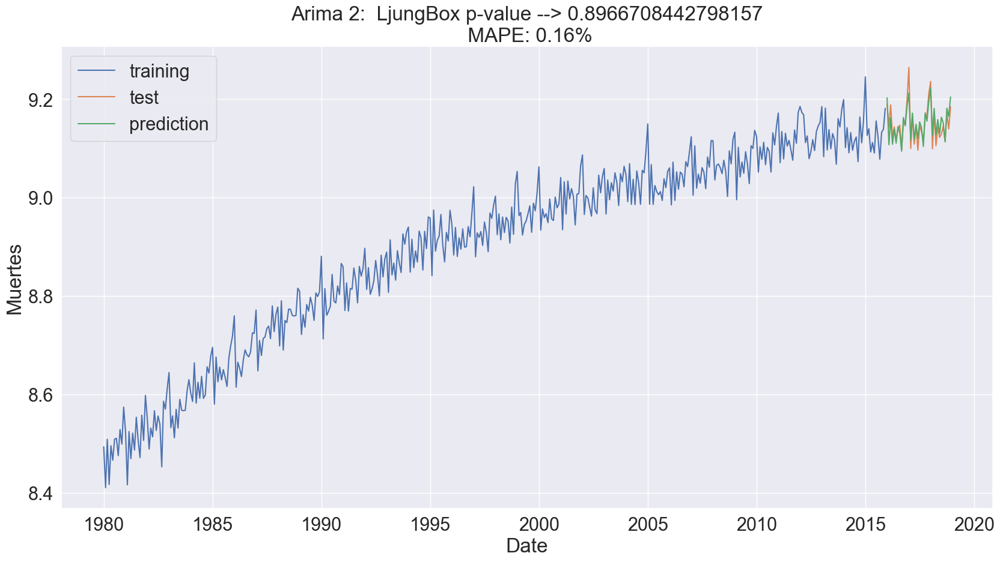

0.8966708442798157


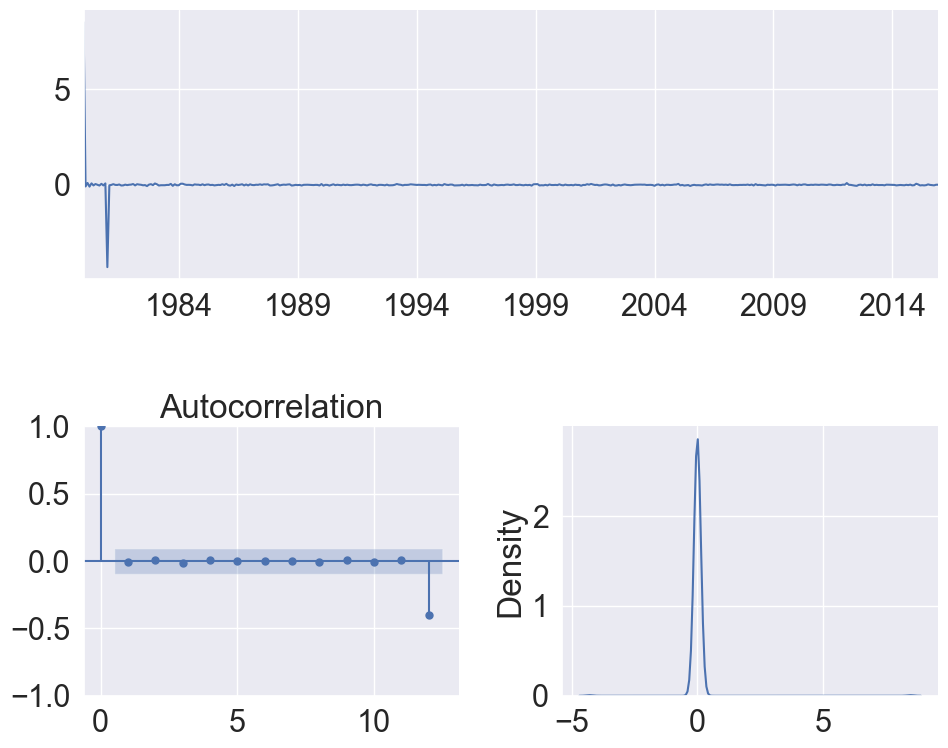

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.897 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel=' '>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [99]:
eval_model(arima_2,Tumors_tr,Tumors_test,'Arima 2', y_label = 'Muertes')

residcheck(arima_2.resid,12)

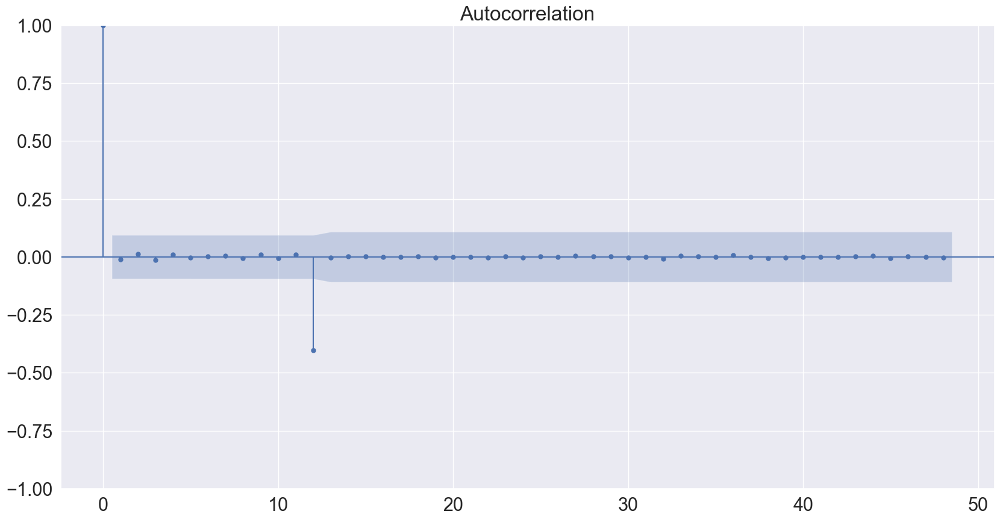

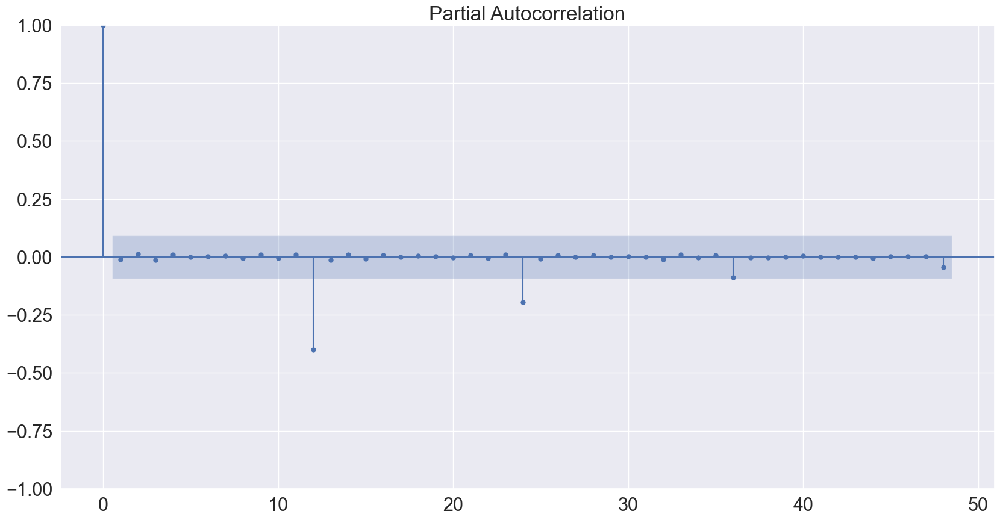

In [100]:
plot_acf(arima_2.resid,lags=48)
plt.show()
plot_pacf(arima_2.resid,lags=48,method='ywm')
plt.show()

Mucho mejor comportamiento, parece ser que era importante anyadir esa componente regular en MA. Comportamiento muy similar en terminos de error a lo que tenemos en suavizado, aunque mejora considerablemente en el test de Ljung-Box. Posible candidato a modelo. Veamos como se comporta en ARIMA automatico.

Aqui definimos el modelo ARIMA automatico, con los parametros espeficados dentro de ella.

In [101]:
import pmdarima as pm

arima_auto = pm.auto_arima(Tumors_tr, start_p=1, start_q=1,
                      test='adf',       
                      max_p=5, max_q=5, 
                      m=12,              
                      d=None,           
                      seasonal=True,   
                      #start_P=None, 
                      D=None, 
                      trace=False,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

In [102]:
print(arima_auto.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  432
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 12)   Log Likelihood                1053.978
Date:                            Mon, 10 Jul 2023   AIC                          -2099.956
Time:                                    15:37:38   BIC                          -2083.691
Sample:                                01-01-1980   HQIC                         -2093.534
                                     - 12-01-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8344      0.029    -28.483      0.000      -0.892      -0.777
ar.S.L12       0.9971      0.002   

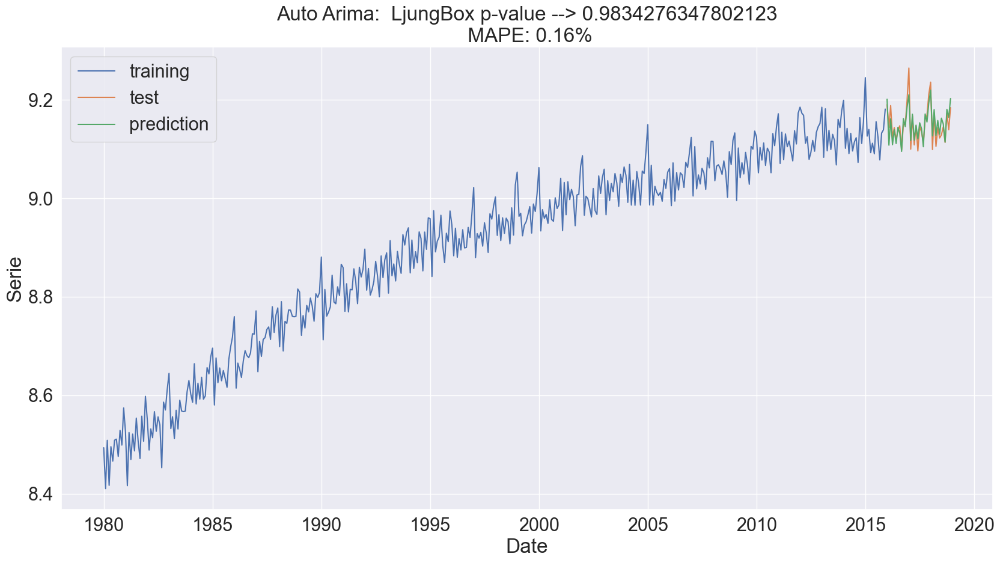

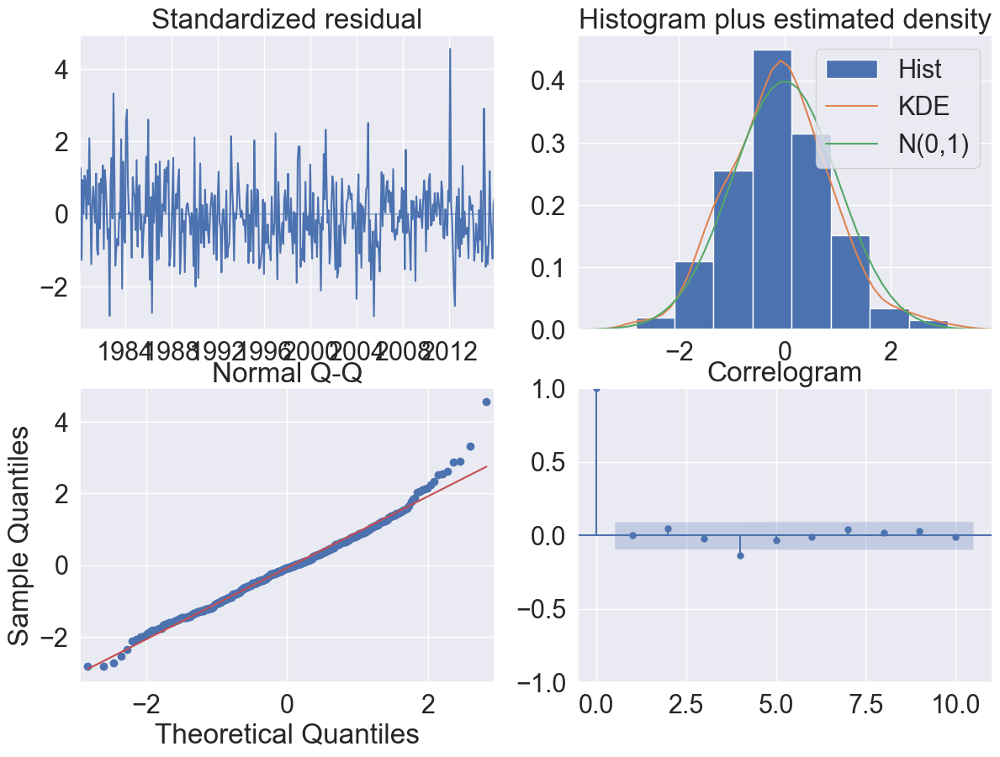

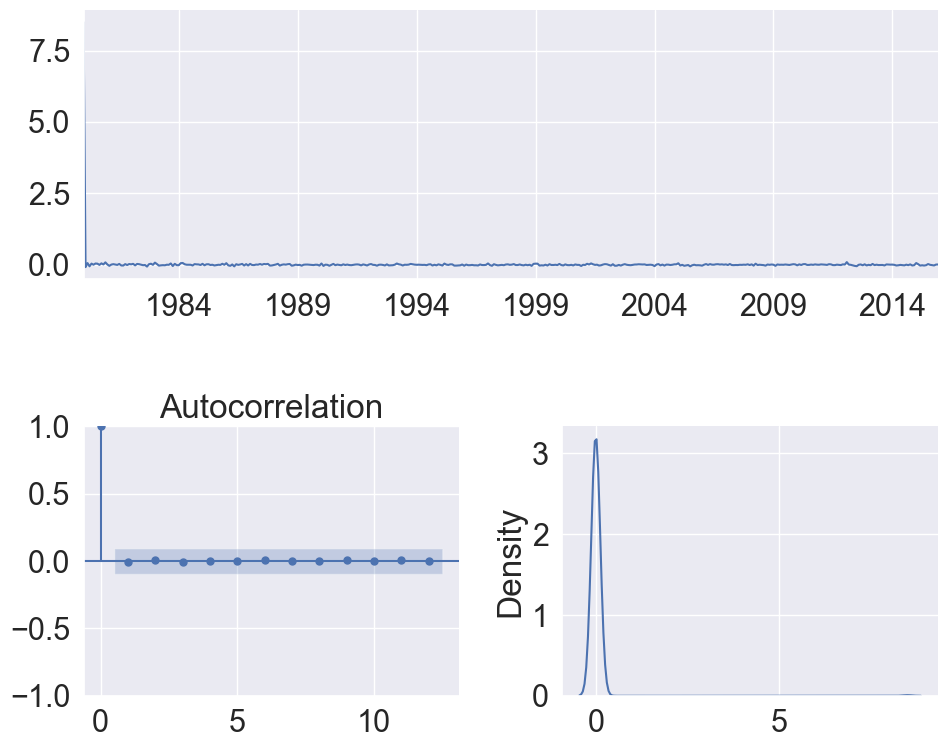

** Mean of the residuals:  0.02

** Ljung Box Test, p-value: 0.983 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot: xlabel=' '>,
 <AxesSubplot: title={'center': 'Autocorrelation'}>,
 <AxesSubplot: ylabel='Density'>)

In [103]:
eval_model_Aarima(arima_auto, Tumors_tr, Tumors_test, 'Auto Arima')
residcheck(arima_auto.resid(),12)

Vemos que el ARIMA auto no ha incluido la diferenciacion estacional, ademas de incluir la componene AR en lo estacional al contrario que el modelo propuesto (_arima2_). Aunque el termino de error no varia parece que tiene un mejor comportamiento en test Ljung-Box (p-valor mayor), aunque nada diferente. 

En conclusion, todos los modelos ofrecen muy buenos resultados tantos los de suavizado como los ARIMA con tasas de errores que no pasan del 0.3%. 

En cuanto a la eleccion de modelo, me decantaria por el (arima2) por varias cosas:
- En primer lugar por la baja tasa de error.
- En segundo lugar por que aplica la diferenciacion estacional, al contrario que el Arima Automatico, que debido a lo que hemos observado en los datos, me resulta bastante importante.
- En tercer lugar, comparandolos con los modelos de suavizado, los cuales tiene una tasa de error un 1 punto porcentual menor, el bajo de numero de parametros de ARIMA gana puntos.

Por lo tanto me quedo con el modelo ARIMA propuesto (0,1,1)(0,1,1)12

## __Ejercicio 3__

 Con los datos de wisconsin.xlsx que se encuentran en la carpeta Datos de la documentación.

In [104]:
#PCA
from sklearn.preprocessing import StandardScaler, scale
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from psynlig import(
    pca_explained_variance,
    pca_residual_variance,
    pca_explained_variance_bar,
    pca_explained_variance_pie,
    pca_1d_loadings,
    pca_2d_loadings,
    pca_2d_scores)

#Factor Analysis
from sklearn.decomposition import FactorAnalysis
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

#Encoding
from sklearn.preprocessing import LabelEncoder

from pca import pca


In [105]:
ruta_archivo_ejercicio3 = path.join(ruta_carpeta, 'wisconsin.xlsx')

In [106]:
Wiskonsin = pd.read_excel(ruta_archivo_ejercicio3, index_col=0)

In [107]:
Wiskonsin.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,,,,,,,,,,,,,,,,,,,,,
842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [108]:
Wiskonsin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 569 entries, 842302 to 92751
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se            

### 2. Obtener la matriz de correlaciones entre las variables numéricas. Conclusiones.

In [109]:
corr = Wiskonsin.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=2)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.00,0.32,1.00,0.99,0.17,0.51,0.68,0.82,0.15,-0.31,0.68,-0.10,0.67,0.74,-0.22,0.21,0.19,0.38,-0.10,-0.04,0.97,0.30,0.97,0.94,0.12,0.41,0.53,0.74,0.16,0.01
texture_mean,0.32,1.00,0.33,0.32,-0.02,0.24,0.30,0.29,0.07,-0.08,0.28,0.39,0.28,0.26,0.01,0.19,0.14,0.16,0.01,0.05,0.35,0.91,0.36,0.34,0.08,0.28,0.30,0.30,0.11,0.12
perimeter_mean,1.00,0.33,1.00,0.99,0.21,0.56,0.72,0.85,0.18,-0.26,0.69,-0.09,0.69,0.74,-0.20,0.25,0.23,0.41,-0.08,-0.01,0.97,0.30,0.97,0.94,0.15,0.46,0.56,0.77,0.19,0.05
area_mean,0.99,0.32,0.99,1.00,0.18,0.50,0.69,0.82,0.15,-0.28,0.73,-0.07,0.73,0.80,-0.17,0.21,0.21,0.37,-0.07,-0.02,0.96,0.29,0.96,0.96,0.12,0.39,0.51,0.72,0.14,0.00
smoothness_mean,0.17,-0.02,0.21,0.18,1.00,0.66,0.52,0.55,0.56,0.58,0.30,0.07,0.30,0.25,0.33,0.32,0.25,0.38,0.20,0.28,0.21,0.04,0.24,0.21,0.81,0.47,0.43,0.50,0.39,0.50
compactness_mean,0.51,0.24,0.56,0.50,0.66,1.00,0.88,0.83,0.60,0.57,0.50,0.05,0.55,0.46,0.14,0.74,0.57,0.64,0.23,0.51,0.54,0.25,0.59,0.51,0.57,0.87,0.82,0.82,0.51,0.69
concavity_mean,0.68,0.30,0.72,0.69,0.52,0.88,1.00,0.92,0.50,0.34,0.63,0.08,0.66,0.62,0.10,0.67,0.69,0.68,0.18,0.45,0.69,0.30,0.73,0.68,0.45,0.75,0.88,0.86,0.41,0.51
concave points_mean,0.82,0.29,0.85,0.82,0.55,0.83,0.92,1.00,0.46,0.17,0.70,0.02,0.71,0.69,0.03,0.49,0.44,0.62,0.10,0.26,0.83,0.29,0.86,0.81,0.45,0.67,0.75,0.91,0.38,0.37
symmetry_mean,0.15,0.07,0.18,0.15,0.56,0.60,0.50,0.46,1.00,0.48,0.30,0.13,0.31,0.22,0.19,0.42,0.34,0.39,0.45,0.33,0.19,0.09,0.22,0.18,0.43,0.47,0.43,0.43,0.70,0.44
fractal_dimension_mean,-0.31,-0.08,-0.26,-0.28,0.58,0.57,0.34,0.17,0.48,1.00,0.00,0.16,0.04,-0.09,0.40,0.56,0.45,0.34,0.35,0.69,-0.25,-0.05,-0.21,-0.23,0.50,0.46,0.35,0.18,0.33,0.77


Aqui vemos la matriz de correlacion de todas la variables numerica. Tiene muy buena pinta, ya que presenta valores bastantes altos especialmente en cuanto a correlacion positiva. Buena senyal. 

Aunque me parece demasiado grande como para obtener conclusiones claras.

### 3 - Sabiendo que se trata de predecir la variable binaria diagnosis (‘M,’B’). ¿Cuál sería el modelo adecuado de predicción? ¿Qué problemas auguras a la luz de la información sobre las correlaciones del archivo?

Cuando nos enfrentamos a un problema de predicción categórica y observamos altas correlaciones entre las variables, puede surgir un desafío conocido como multicolinealidad. La multicolinealidad ocurre cuando las variables predictoras en un modelo estadístico están altamente correlacionadas entre sí. Esto puede afectar negativamente la precisión y estabilidad del modelo, dificultando la interpretación de los resultados.

Para abordar este problema, conviene reducir el número de variables manteniendo la información más relevante. Una técnica comúnmente utilizada para lograr esto es el Análisis de Componentes Principales (ACP). El ACP es un método no supervisado que permite transformar un conjunto de variables correlacionadas en un nuevo conjunto de variables no correlacionadas, llamadas componentes principales.

El objetivo del ACP es encontrar un conjunto de componentes principales que capturen la mayor parte de la varianza de los datos originales. Estos componentes se ordenan en función de su contribución a la varianza total, de modo que los primeros componentes principales explican la mayor parte de la variabilidad en los datos. 

### 4 - Como posible estrategia se plantea la realización de un ACP para la reducción de dimensiones y un modelo de predicción adecuado utilizando como predictores las componentes principales resultantes de tal forma que se  retenga al menos el 70% de la variabilidad del archivo.

a. Valora la adecuación muestral a priori

In [110]:
Wiskonsin_numbers = Wiskonsin.select_dtypes(include = np.number)

Test de esferidad de Bartlett

In [111]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
calculate_bartlett_sphericity(Wiskonsin_numbers)

(39362.120841132666, 0.0)

Indice KMO

In [112]:
from factor_analyzer.factor_analyzer import calculate_kmo

kmo = calculate_kmo(Wiskonsin_numbers)
print(f'KMO General: {kmo[1]}')
kmo_reshaped = np.reshape(kmo[0], (1, -1))
kmo_df = pd.DataFrame(kmo_reshaped, index=['KMO'], columns=Wiskonsin_numbers.columns)
kmo_df


KMO General: 0.8322253094689462


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
KMO,0.834635,0.643526,0.853341,0.864033,0.814716,0.879398,0.891928,0.900277,0.825103,0.831814,...,0.823087,0.603298,0.884938,0.820445,0.753161,0.851277,0.902226,0.891052,0.690748,0.81234


In [113]:
kmo_df.loc[:, kmo_df.loc['KMO'] < 0.7]

,texture_mean,texture_se,smoothness_se,symmetry_se,texture_worst,symmetry_worst
KMO,0.643526,0.484589,0.644279,0.583218,0.603298,0.690748


Aqui vemos como los valores que arroja el KMO, aunque se aprecian algunos que no estan en el rango de aceptacion (>0.7). 
Para observar cuales son, convertimos los resultados en un pandas dataframe, y ahi observamos que las variables que aportan menos son 'texture_se', 'symmetry_se', 'texture_worst', 'texture_mean',
'smoothness_se', 'symmetry_worst'. 
Se tendra en cuenta en cuenta a la hora de seleccion de variables.



Tras ver los pesos de las componentes principales, hemos visto que hay bastante peso de las variables con menos repercusion en el KMO, es decir 'texture_se' y 'symmetry_se'. Por lo que vamos a eliminarla del dataset.

In [114]:
Wiskonsin_numbers = Wiskonsin_numbers.drop(['texture_se', 'symmetry_se'], axis=1)

In [115]:
kmo = calculate_kmo(Wiskonsin_numbers)
print(f'KMO General: {kmo[1]}')
kmo_reshaped = np.reshape(kmo[0], (1, -1))
kmo_df = pd.DataFrame(kmo_reshaped, index=['KMO'], columns=Wiskonsin_numbers.columns)
kmo_df

KMO General: 0.8462575227004269


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
KMO,0.832912,0.712677,0.851843,0.868651,0.823275,0.878221,0.891243,0.898749,0.854554,0.821995,...,0.82158,0.716137,0.884496,0.828314,0.76386,0.850642,0.901604,0.884572,0.828255,0.806189


In [116]:
kmo_df.loc[:, kmo_df.loc['KMO'] < 0.7]

,smoothness_se
KMO,0.627888


In [117]:
scaler = StandardScaler()
scaler.fit(Wiskonsin_numbers)
X = scaler.transform(Wiskonsin_numbers)

b. Realiza el ACP sobre las numéricas. ¿Cuántas componentes se deberían  considerar para cumplir el criterio mencionado? Interpreta la 
componente 1.

In [118]:
pca1 = PCA() 
scores = pca1.fit_transform(X)
pd.DataFrame(scores).head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,9.154942,1.999169,-0.157629,3.678155,1.361963,1.588691,2.094475,0.343957,0.544690,-0.549086,...,0.405240,0.091852,0.068246,-0.193203,-0.122893,-0.227492,-0.230609,-0.027141,0.053308,-0.047766
1,2.461187,-3.547915,-0.045751,0.670696,1.079081,-0.273154,0.098803,0.801139,-0.960275,0.840684,...,-0.172761,-0.084926,-0.189227,0.005543,-0.165840,-0.000565,0.201941,0.037634,-0.002153,-0.001968
2,5.749221,-0.974332,-0.249129,0.746693,0.399549,0.305615,-0.747984,-0.098653,-0.352585,-0.332980,...,-0.042506,-0.157320,-0.071460,0.138274,0.188094,0.003033,0.042791,0.043772,-0.001221,0.000806
3,6.886660,9.856269,-3.801758,1.524837,-0.458831,1.821619,1.452475,0.640132,-0.166683,-0.683549,...,-0.242865,-0.351471,-0.097059,0.204673,0.123157,-0.234904,0.228123,0.049202,-0.060662,-0.020833
4,3.974735,-1.855108,2.545322,1.925292,0.683929,-1.149827,-0.795803,0.832488,-0.194416,0.446995,...,0.044291,0.004906,0.126794,-0.022514,-0.016882,0.030081,0.017276,-0.040218,0.000658,0.021515


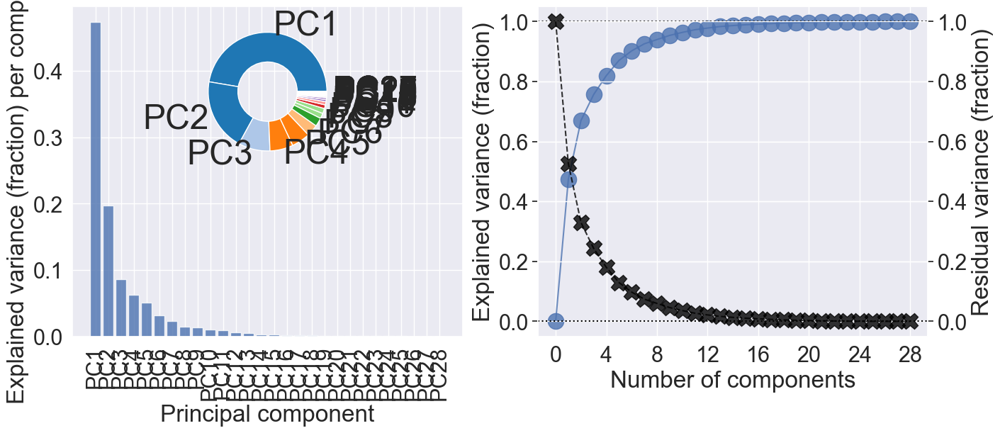

In [119]:
fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, figsize=(14, 6), constrained_layout=True
)
pca_explained_variance_bar(pca1, axi=ax1, alpha=0.8)
pca_explained_variance(pca1, axi=ax2, marker='o', markersize=16, alpha=0.8)
ax4 = ax2.twinx()
pca_residual_variance(
    pca1,
    ax4,
    marker='X',
    markersize=16,
    alpha=0.8,
    color='black',
    linestyle='--'
)
ax3 = inset_axes(ax1, width='45%', height='45%', loc=9)
pca_explained_variance_pie(pca1, axi=ax3, cmap='tab20')
plt.show()

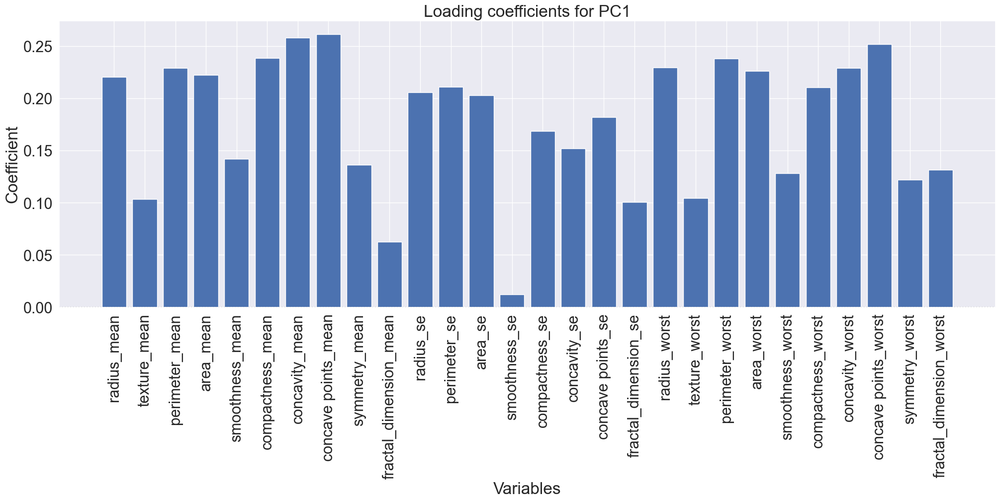

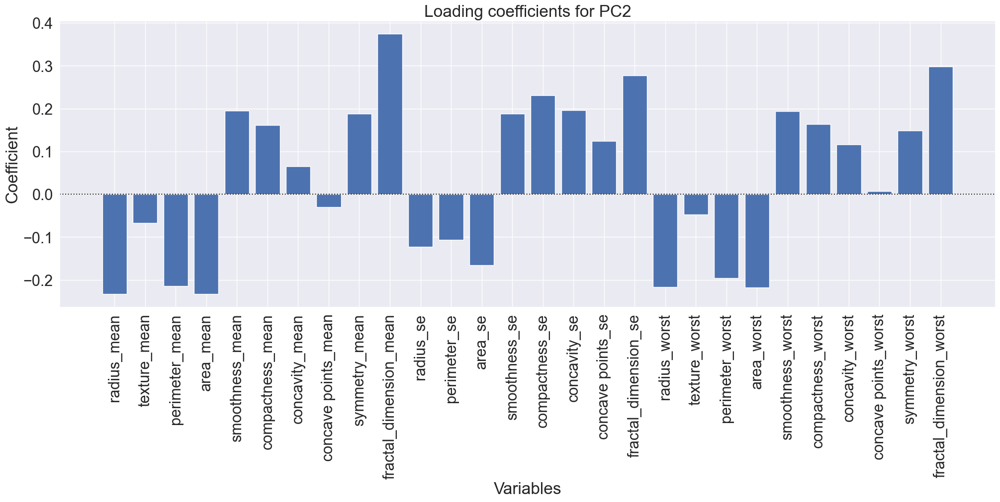

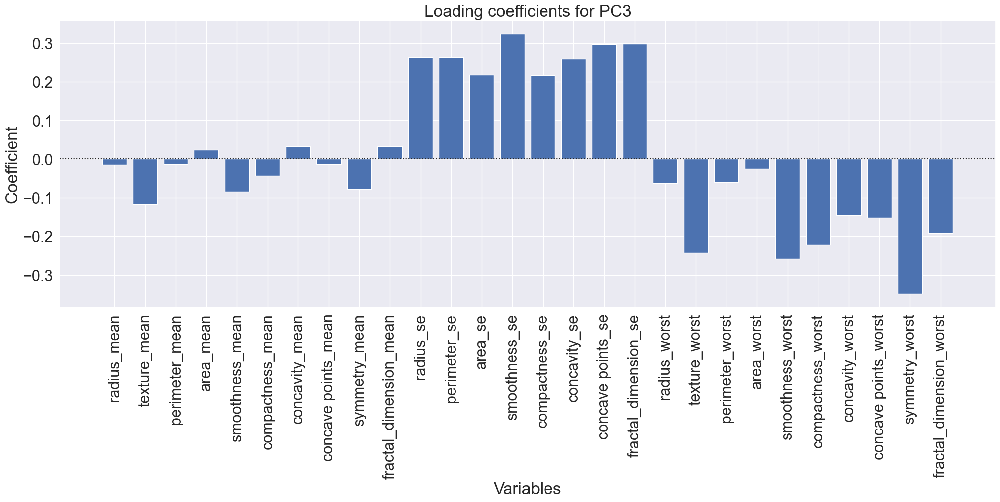

In [120]:
pca_1d_loadings(
        pca1,
        Wiskonsin_numbers.columns,
        select_components={1},
        plot_type='bar',
    )
plt.show()
pca_1d_loadings(
        pca1,
        Wiskonsin_numbers.columns,
        select_components={2},
        plot_type='bar',
    )
plt.show()
pca_1d_loadings(
        pca1,
        Wiskonsin_numbers.columns,
        select_components={3},
        plot_type='bar',
    )
plt.show()

La componente 1 como componente que capta la mayor variabilidad de los datos, tiene cargas bastante altas de cada una de ellas, dejando mas aislada la varialble smoothness_se, que como representamos en la aplicacion del indice KMO una vez retirada las varibles no deseadas, es la que peor comportamiento tiene. 

Por otro lado, vamos a utilizar el paquete pca, ya que me resulta bastante mas atractivo para crear componentes asi como para la visualizacion.

In [121]:
import plotly.express as px
fig = px.scatter(scores, x=0, y=1, text = Wiskonsin['diagnosis'])
fig.show()

In [122]:
from pca import pca
model = pca(normalize=True, n_components=0.7)

# Fit transform
results = model.fit_transform(Wiskonsin_numbers)


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [70.0%] explained variance using the [28] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [70.00%] explained variance.
[pca] >The PCA reduction is performed on the [28] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


(<Figure size 1500x1000 with 1 Axes>,
 <AxesSubplot: title={'center': 'Cumulative explained variance\n 3 Principal Components explain [81.97%] of the variance.'}, xlabel='Principle Component', ylabel='Percentage explained variance'>)

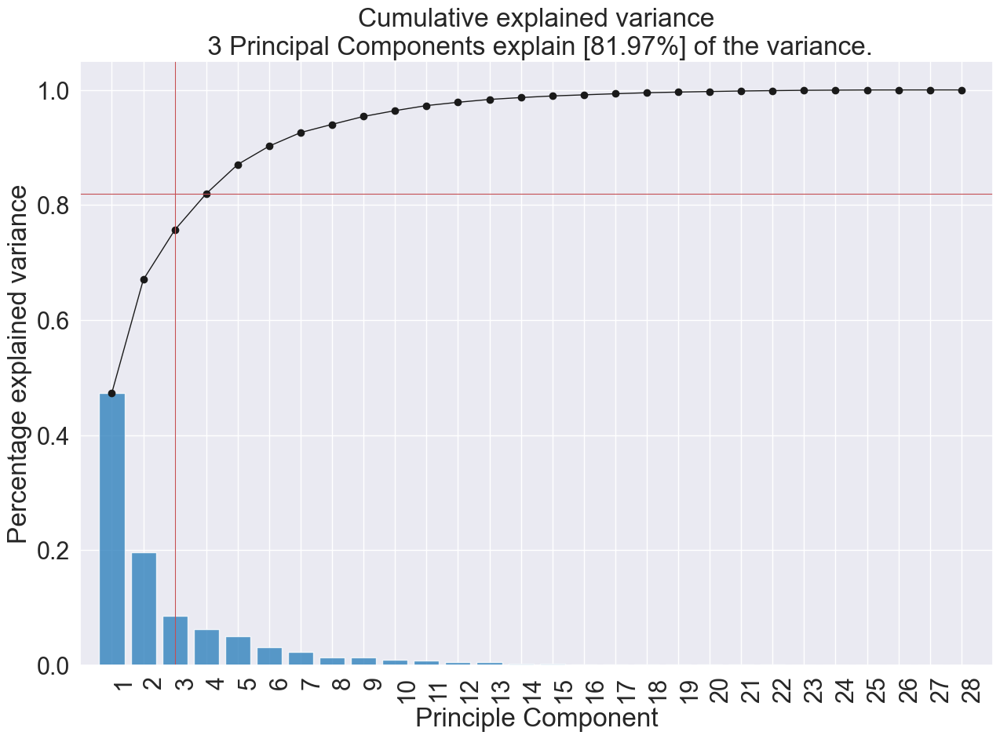

In [123]:
model.plot()

In [124]:
model.results['loadings']

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
PC1,0.220545,0.103597,0.229076,0.222474,0.141894,0.238880,0.258354,0.261377,0.136514,0.062408,...,0.229742,0.104621,0.238275,0.226491,0.128186,0.210434,0.229280,0.251978,0.121982,0.131470
PC2,-0.233095,-0.067504,-0.214038,-0.232616,0.195309,0.161734,0.065445,-0.030271,0.187708,0.374592,...,-0.216278,-0.047169,-0.195853,-0.217811,0.193285,0.163869,0.115568,0.007243,0.148148,0.298392
PC3,-0.015070,-0.116615,-0.013610,0.023032,-0.083693,-0.042919,0.032518,-0.014004,-0.078342,0.032933,...,-0.062020,-0.241846,-0.059990,-0.024836,-0.257114,-0.221332,-0.145573,-0.152562,-0.349210,-0.192562


[datazets] >WARNING> No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[datazets] >WARNING> No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '3 Principal Components explain [81.97%] of the variance'}, xlabel='PC1 (47.3% expl.var)', ylabel='PC2 (19.6% expl.var)'>)

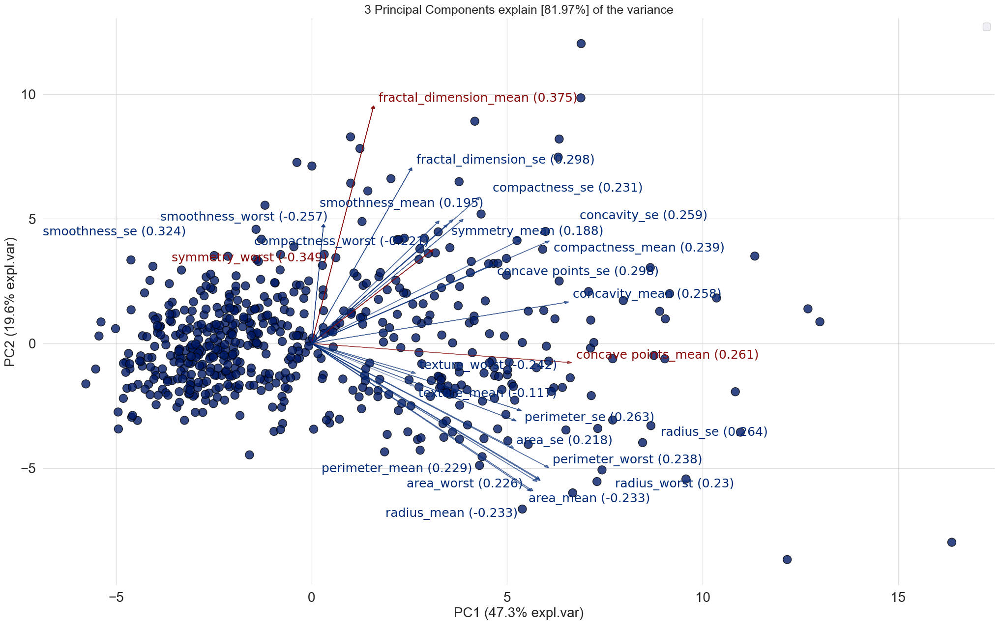

In [125]:
model.biplot()

Tras analizar con varias herramientas la seleccion de componenetes principales (de las cuales el paquete pca es el que mas interesante me parece) llegamos a la conclusion de lo siguiente:

- En primer lugar, para obtener la variabilidad especificida 70% se necesitan tres componentes.

- Como se menciono anteriormente, se eliminaron dos variables del dataset ya que al observar previamente la composicion de la tercera componente, se veia bastante peso de estas dos variables. 
Al retirarlas los resultados de la seleccion de variables principales mejoro a un 81.97 por cierto con la misma cantidad de componentes

c. Crea el input con estas componentes (matriz de scores o puntuaciones) y ajusta un modelo de predicción adecuado para la variable objetivo 
diagnosis.

Para la realizacion del modelo, he utilzado un Pipeline, sobretodo para poner en practica esta herramienta. 

In [126]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, confusion_matrix, roc_auc_score
from sklearn.metrics import classification_report, f1_score

In [127]:
X = Wiskonsin_numbers
y = Wiskonsin['diagnosis'].replace(['B', 'M'], [0, 1])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [128]:
steps = [('scaler', StandardScaler()),
         ('pca', PCA(n_components=.7)),
         ('clf', LogisticRegression())]
         
# Construimos el pipeline
pipe_lr = Pipeline(steps)

# Ajustamos el proceso del pipe en training
pipe_lr.fit(X_train, y_train)
# Predicciones en training
train_predictions = pipe_lr.predict(X_train)
# Predicciones en test
test_predictions = pipe_lr.predict(X_test)

print("TRAIN:")
print(classification_report(y_train, train_predictions))

print("TEST:")
print(classification_report(y_test, test_predictions))

print('ACCURACY')
print(pipe_lr.score(X_test,y_test))

TRAIN:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       286
           1       0.96      0.94      0.95       169

    accuracy                           0.96       455
   macro avg       0.96      0.96      0.96       455
weighted avg       0.96      0.96      0.96       455

TEST:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        71
           1       1.00      0.98      0.99        43

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

ACCURACY
0.9912280701754386


Cross Validation
Score Cross_Val: [0.98026316 0.94736842 0.94701987]
Media Cross_Val: 0.9582171488323458
--------------------------------------
Matris de confusion Train
     0    1
0  280    6
1   10  159
--------------------------------------
Matris de confusion Test
    0   1
0  71   0
1   1  42
--------------------------------------
Curva ROC


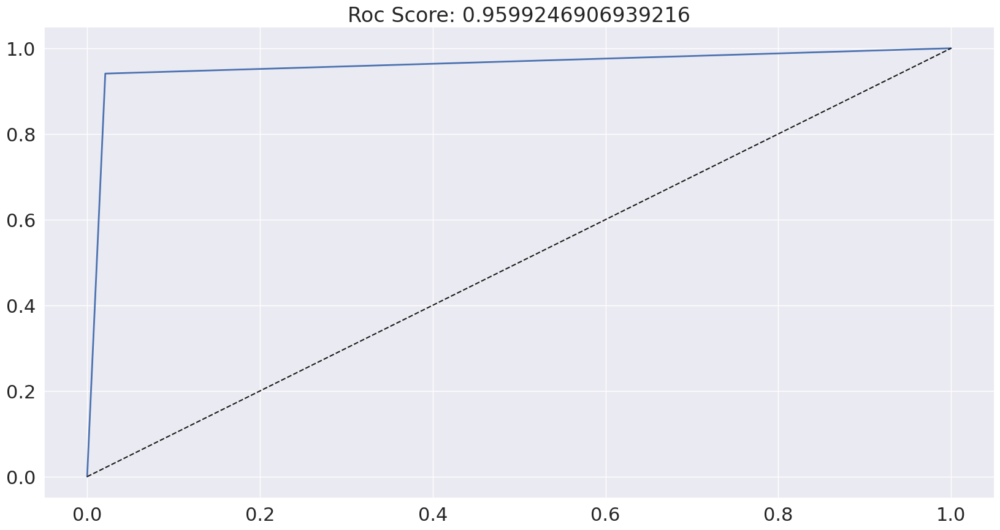

In [129]:
print('Cross Validation')
score_cross_val = cross_val_score(pipe_lr,X_train, y_train, cv=3, scoring = 'accuracy' )
print(f'Score Cross_Val: {score_cross_val}')
print(f'Media Cross_Val: {score_cross_val.mean()}')

print('--------------------------------------')
print('Matris de confusion Train')

print(pd.DataFrame(confusion_matrix(y_train, train_predictions), columns = y.value_counts().index))
print('--------------------------------------')
print('Matris de confusion Test')
print(pd.DataFrame(confusion_matrix(y_test, test_predictions), columns = y.value_counts().index))
print('--------------------------------------')
print('Curva ROC')

fpr, tpr, thresholds = roc_curve(y_train, train_predictions)


def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, linewidth=2)
    plt.plot([0,1],[0,1], 'k--')
    plt.title(f'Roc Score: {roc_auc_score(y_train, train_predictions)}')
plot_roc_curve(fpr, tpr)



El modelo es casi perfecto en todos los indicadores. 

- Buenos parametros de precision y sensibilidad, ademas como resultado de esto, buena puntacion del f1-score. Sacamos la matrix de confusion tanto de training como de test para corroborarlo.
- Un accuracy de 0.99 para test y de 0.96 para training.
- Curva Roc rozando la perfeccion, dejando un area de 0.96 por debajo.
- Y por ultimo los resultados de la validacion cruzada una media de 0.95 de precision.

## **Ejercicio 4**

El conjunto de datos DatosEleccionesEspaña.xlsx contiene información demográfica sobre los distintos municipios de España junto con los resultados que se obtuvieron  en un proceso electoral. En esta práctica, el objetivo fundamental es crear grupos de  comunidades autónomas en función de ciertas características previamente seleccionadas. 

In [247]:
# Gráficos
# ==============================================================================
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')

# Preprocesado y modelado
# ==============================================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestCentroid

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

1- Escoge 10 variables numéricas presentes en el conjunto de datos y realiza un ligera depuración sobre este subconjunto de variables (Valores raros, Outliers, NAs..)

In [248]:
ruta_archivo_ejercicio4 = path.join(ruta_carpeta, 'DatosEleccionesEspaña.xlsx')
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [249]:
data_ejercicio4 = pd.read_excel(ruta_archivo_ejercicio4, index_col = 0)

In [250]:
data_ejercicio4.info()


<class 'pandas.core.frame.DataFrame'>
Index: 8119 entries, Abadía to Zuñeda
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   CodigoProvincia               8119 non-null   int64  
 1   CCAA                          8119 non-null   object 
 2   Population                    8119 non-null   int64  
 3   TotalCensus                   8119 non-null   int64  
 4   AbstentionPtge                8119 non-null   float64
 5   AbstencionAlta                8119 non-null   int64  
 6   Izda_Pct                      8119 non-null   float64
 7   Dcha_Pct                      8119 non-null   float64
 8   Otros_Pct                     8119 non-null   float64
 9   Izquierda                     8119 non-null   int64  
 10  Derecha                       8119 non-null   int64  
 11  Age_0-4_Ptge                  8119 non-null   float64
 12  Age_under19_Ptge              8119 non-null   float64
 13  A

In [251]:
CCAA = data_ejercicio4[['CCAA', 'Population']]

In [252]:
data_ejercicio4.head()

,CodigoProvincia,CCAA,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,ActividadPpal,inmuebles,Pob2010,SUPERFICIE,Densidad,PobChange_pct,PersonasInmueble,Explotaciones
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abadía,10,Extremadura,336,282,20.213,0,60.444,35.555,1.778,1,0,3.869,18.155,55.059,26.785,44.048,0.89,79.762,0.298,19.345,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0,0.0,0.0,0.0,0.0,Otro,216.0,326.0,4507.5593,MuyBaja,3.07,1.56,28
Abertura,10,Extremadura,429,364,25.275,0,54.779,44.118,0.368,1,0,1.632,13.055,56.643,30.304,50.117,1.63,90.909,2.797,7.226,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0,0.0,0.0,0.0,0.0,Otro,382.0,459.0,6270.7646,MuyBaja,-6.54,1.12,67
Acebo,10,Extremadura,569,569,27.241,0,44.203,53.140,0.966,0,1,1.230,9.139,54.834,36.028,49.033,0.70,78.910,0.703,18.102,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0,0.0,0.0,0.0,0.0,Otro,918.0,674.0,5702.1000,MuyBaja,-15.58,0.62,74
Acehúche,10,Extremadura,822,704,30.114,1,50.813,45.325,0.000,1,0,4.258,14.964,60.098,24.940,51.095,0.12,93.917,0.487,5.109,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0,0.0,0.0,0.0,0.0,Otro,599.0,842.0,9106.4649,MuyBaja,-2.38,1.37,66
Aceituna,10,Extremadura,623,540,30.185,1,44.562,49.867,0.796,0,1,3.531,15.569,59.391,25.042,48.154,0.64,93.258,0.161,4.173,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0,0.0,0.0,0.0,0.0,Otro,394.0,625.0,4007.6141,MuyBaja,-0.32,1.58,96


In [253]:
data_ejercicio4.describe()

,CodigoProvincia,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,inmuebles,Pob2010,SUPERFICIE,PobChange_pct,PersonasInmueble,Explotaciones
count,8119.000000,8.119000e+03,8.119000e+03,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8114.000000,7931.000000,7980.000000,8110.000000,8057.000000,7.981000e+03,8.112000e+03,8110.000000,8112.000000,7981.000000,8119.000000
mean,26.670772,5.741855e+03,4.260666e+03,26.506951,0.311368,34.403789,48.915409,14.666183,0.222811,0.621136,3.019429,13.567747,57.371541,29.073583,47.302755,5.619553,81.629141,4.336688,10.729018,7.322292,37.003976,50.180442,8.400982,10.007836,10.837496,58.649705,398.603032,23.419367,48.878321,146.735265,172.149684,3.246160e+03,5.795812e+03,6214.695257,-4.897406,1.296009,2447.204582
std,14.896717,4.621520e+04,3.442889e+04,7.540091,0.463082,16.482285,19.945087,25.093642,0.416158,0.485134,2.053726,6.780648,6.818072,11.745849,4.361907,7.348553,12.289063,6.394440,8.847295,9.408555,20.317306,22.803515,12.958405,12.528441,13.281177,24.259562,4219.366083,158.610811,421.863266,1233.023418,2446.812300,2.431471e+04,4.753568e+04,9218.194603,10.383417,0.566620,15062.738051
min,1.000000,5.000000e+00,5.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.459000,0.000000,11.765000,-8.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000e+00,5.000000e+00,2.578400,-52.270000,0.110000,1.000000
25%,13.000000,1.660000e+02,1.400000e+02,21.678000,0.000000,21.892500,38.690500,0.759500,0.000000,0.000000,1.389000,8.334000,53.845000,19.824500,45.725000,1.060000,75.806000,0.676000,4.933000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000,0.000000,0.000000,0.000000,1.800000e+02,1.777500e+02,1839.191800,-10.400000,0.850000,22.000000
50%,26.000000,5.490000e+02,4.470000e+02,26.429000,0.000000,35.165000,51.582000,1.883000,0.000000,1.000000,2.978000,13.889000,58.655000,27.559000,48.485000,3.590000,84.493000,2.190000,8.271000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000,0.000000,0.000000,0.000000,4.860000e+02,5.820000e+02,3487.737450,-4.960000,1.250000,52.000000
75%,41.000000,2.427500e+03,1.846500e+03,31.475000,1.000000,46.032000,62.201000,16.497000,0.000000,1.000000,4.533000,19.058500,61.818000,36.908000,50.000000,8.180000,90.462000,5.277000,13.898000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000,14.000000,25.000000,65.000000,40.000000,1.589000e+03,2.483000e+03,6893.877800,0.092500,1.730000,137.000000
max,52.000000,3.141991e+06,2.363829e+06,57.576000,1.000000,94.117000,100.000000,100.000000,1.000000,1.000000,13.245000,33.696000,100.002000,76.471000,72.683000,71.470000,127.156000,67.308000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,299397.000000,10521.000000,30343.000000,80856.000000,177677.000000,1.615548e+06,3.273049e+06,175022.910000,138.460000,3.330000,99999.000000


In [254]:
RawData = data_ejercicio4.select_dtypes(include = np.number)

In [255]:
to_factor = list(RawData.loc[:,RawData.nunique() < 10])
RawData[to_factor] = RawData[to_factor].astype('category')

In [256]:
RawData = RawData.select_dtypes(include = np.number)

In [257]:
print(RawData.columns, len(RawData.columns))


Index(['CodigoProvincia', 'Population', 'TotalCensus', 'AbstentionPtge',
       'Izda_Pct', 'Dcha_Pct', 'Otros_Pct', 'Age_0-4_Ptge', 'Age_under19_Ptge',
       'Age_19_65_pct', 'Age_over65_pct', 'WomanPopulationPtge',
       'ForeignersPtge', 'SameComAutonPtge', 'SameComAutonDiffProvPtge',
       'DifComAutonPtge', 'UnemployLess25_Ptge', 'Unemploy25_40_Ptge',
       'UnemployMore40_Ptge', 'AgricultureUnemploymentPtge',
       'IndustryUnemploymentPtge', 'ConstructionUnemploymentPtge',
       'ServicesUnemploymentPtge', 'totalEmpresas', 'Industria',
       'Construccion', 'ComercTTEHosteleria', 'Servicios', 'inmuebles',
       'Pob2010', 'SUPERFICIE', 'PobChange_pct', 'PersonasInmueble',
       'Explotaciones'],
      dtype='object') 34


In [258]:
variables_escogidas = ['Servicios', 'Construccion', 'ComercTTEHosteleria','Industria','Age_under19_Ptge','Age_19_65_pct', 'Age_over65_pct', 'WomanPopulationPtge',
       'ForeignersPtge', 'Explotaciones']
len(variables_escogidas)

10

In [259]:
RawData = RawData.loc[:,variables_escogidas]

In [260]:
RawData.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8119 entries, Abadía to Zuñeda
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Servicios            8057 non-null   float64
 1   Construccion         7980 non-null   float64
 2   ComercTTEHosteleria  8110 non-null   float64
 3   Industria            7931 non-null   float64
 4   Age_under19_Ptge     8119 non-null   float64
 5   Age_19_65_pct        8119 non-null   float64
 6   Age_over65_pct       8119 non-null   float64
 7   WomanPopulationPtge  8119 non-null   float64
 8   ForeignersPtge       8119 non-null   float64
 9   Explotaciones        8119 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 697.7+ KB


In [261]:
RawData.describe()

,Servicios,Construccion,ComercTTEHosteleria,Industria,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Explotaciones
count,8057.000000,7980.000000,8110.000000,7931.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000
mean,172.149684,48.878321,146.735265,23.419367,13.567747,57.371541,29.073583,47.302755,5.619553,2447.204582
std,2446.812300,421.863266,1233.023418,158.610811,6.780648,6.818072,11.745849,4.361907,7.348553,15062.738051
min,0.000000,0.000000,0.000000,0.000000,0.000000,23.459000,0.000000,11.765000,-8.960000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,8.334000,53.845000,19.824500,45.725000,1.060000,22.000000
50%,0.000000,0.000000,0.000000,0.000000,13.889000,58.655000,27.559000,48.485000,3.590000,52.000000
75%,40.000000,25.000000,65.000000,14.000000,19.058500,61.818000,36.908000,50.000000,8.180000,137.000000
max,177677.000000,30343.000000,80856.000000,10521.000000,33.696000,100.002000,76.471000,72.683000,71.470000,99999.000000


In [262]:
RawData = RawData[~RawData.index.duplicated()]

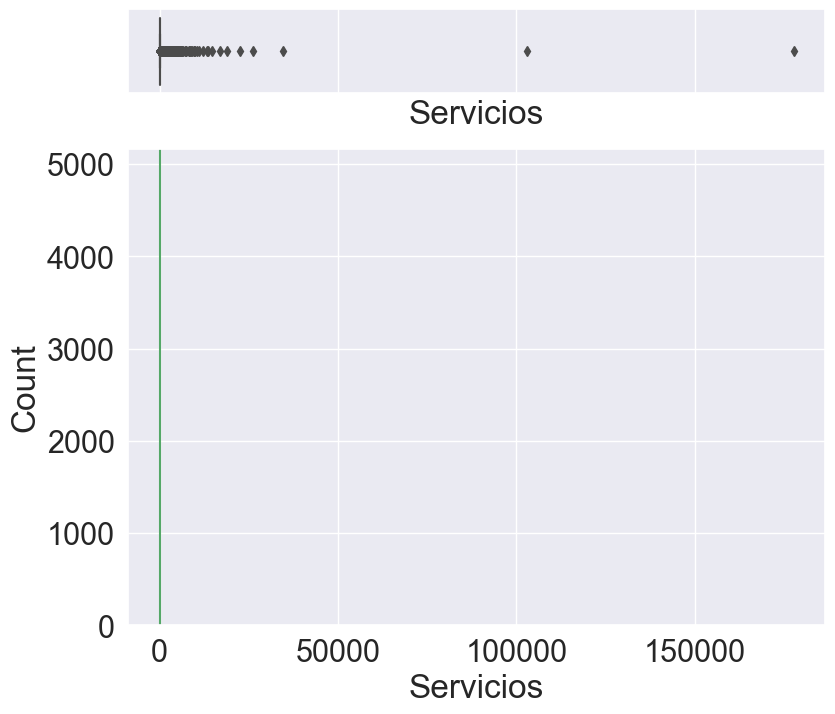

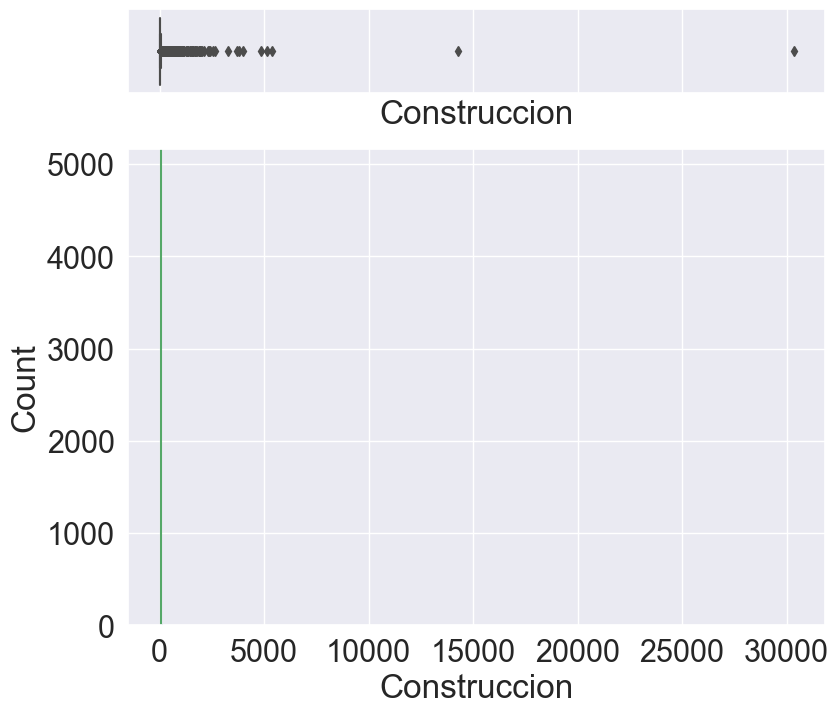

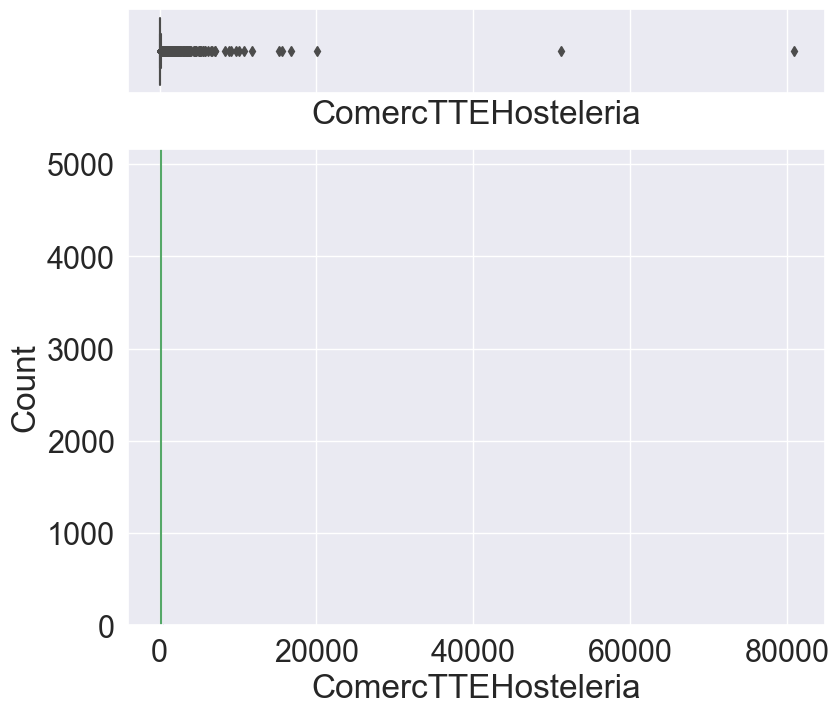

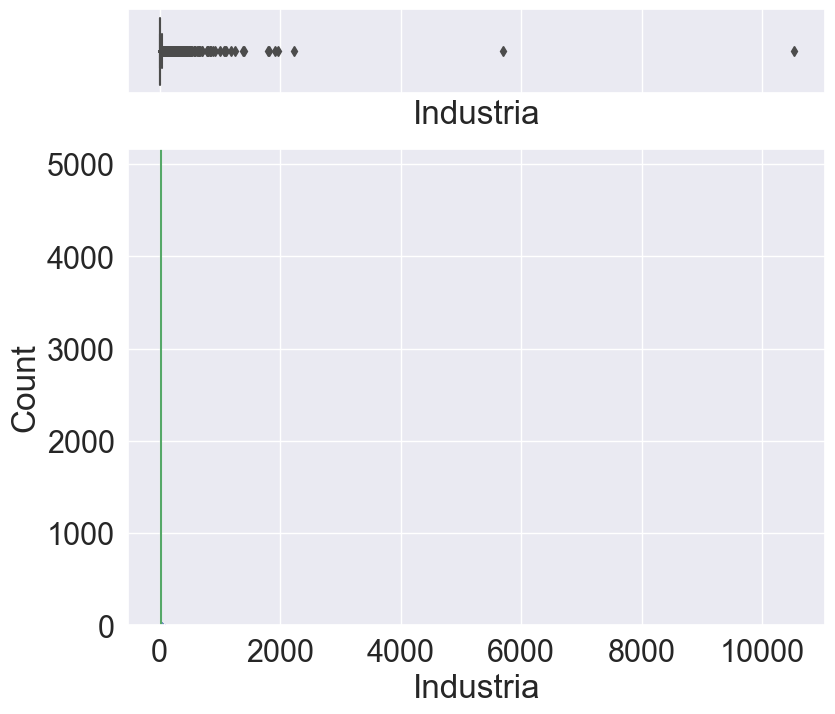

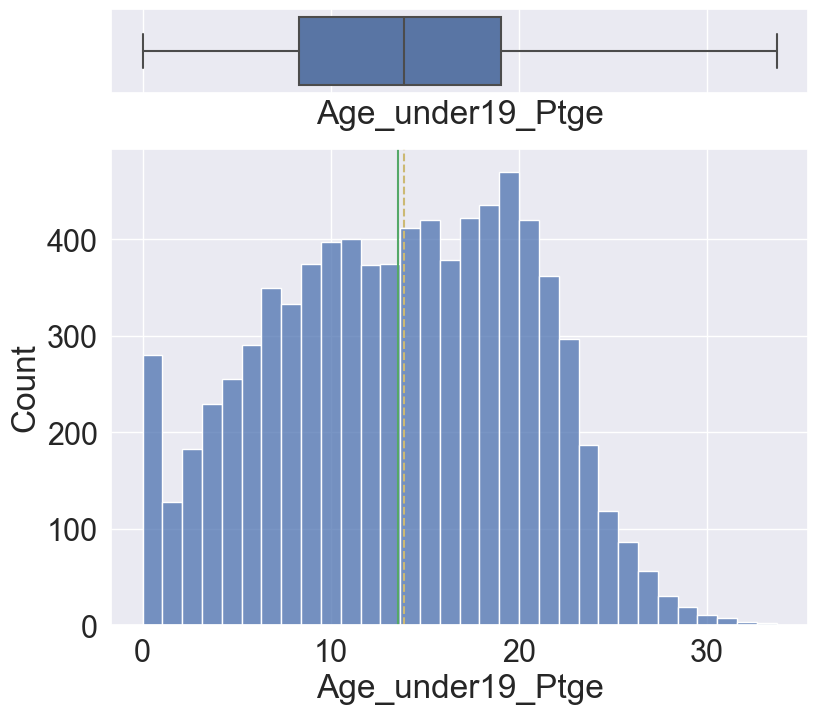

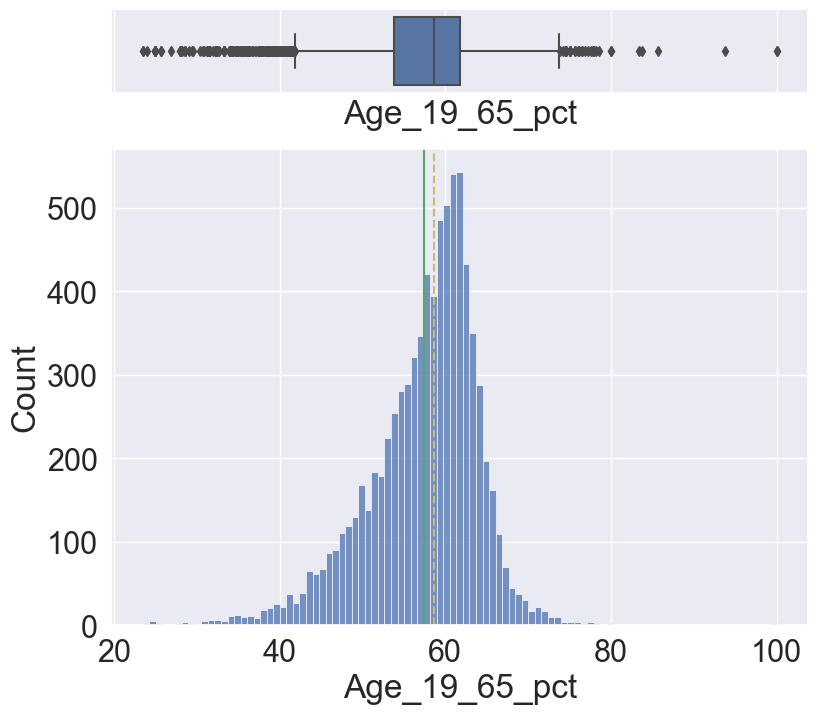

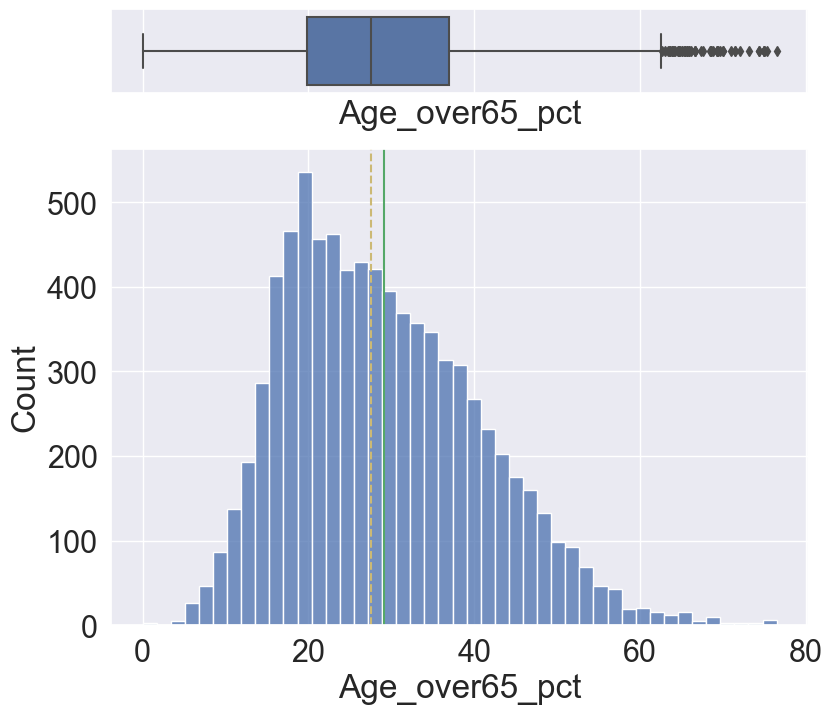

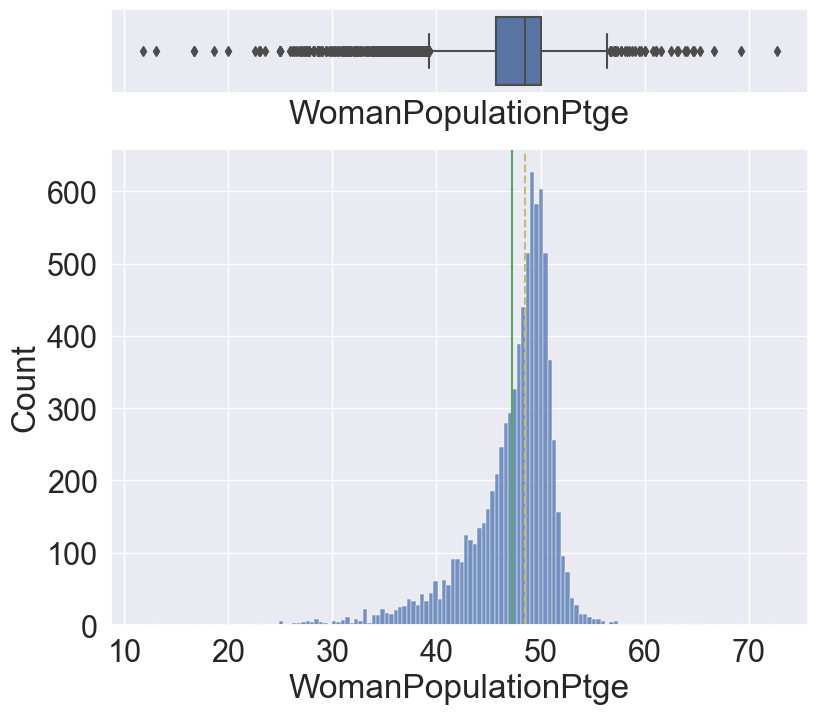

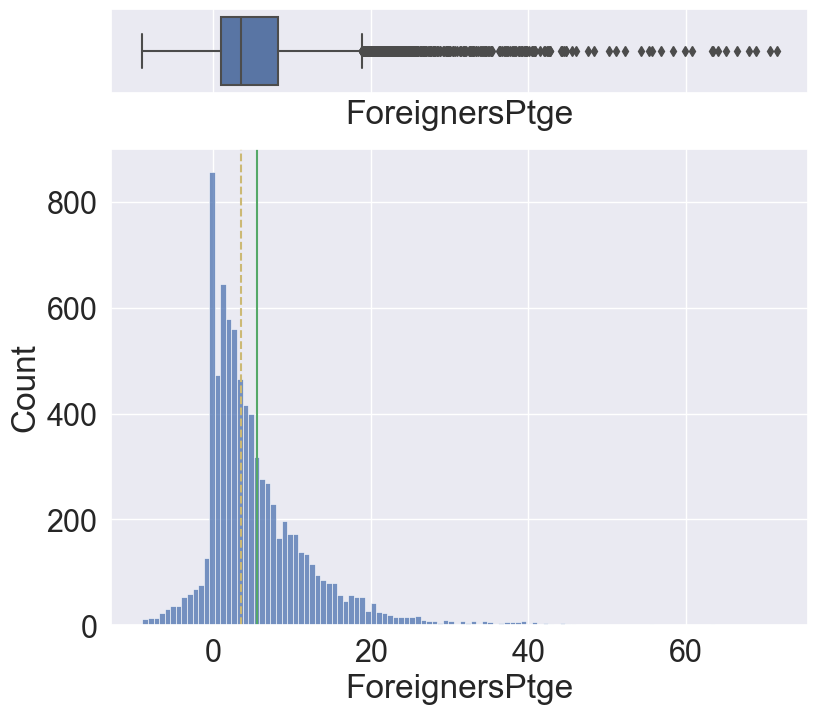

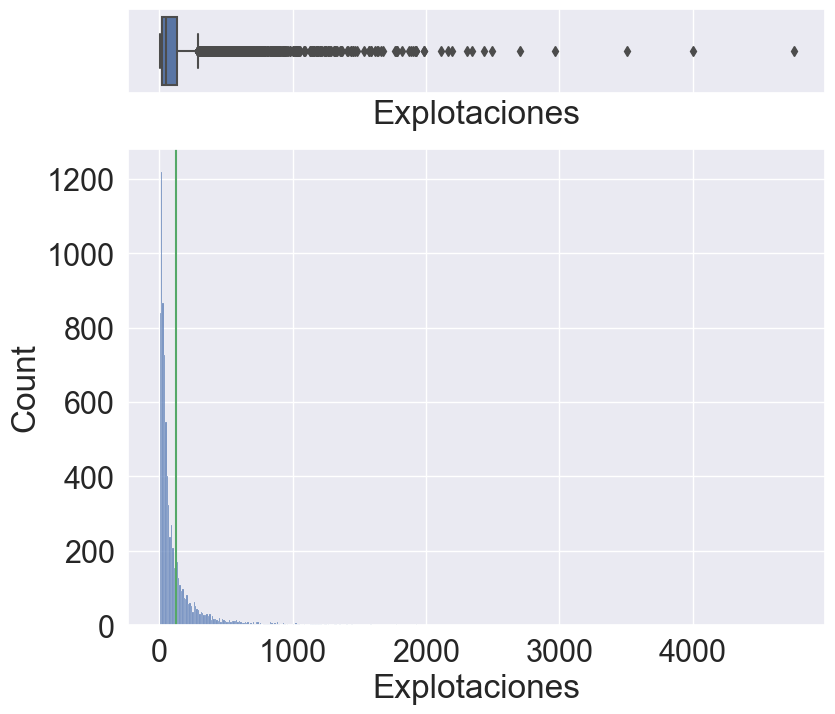

Servicios              None
Construccion           None
ComercTTEHosteleria    None
Industria              None
Age_under19_Ptge       None
Age_19_65_pct          None
Age_over65_pct         None
WomanPopulationPtge    None
ForeignersPtge         None
Explotaciones          None
dtype: object

In [324]:
RawData.apply(histogram_boxplot)

In [264]:
RawData['Explotaciones'].replace(99999, np.nan, inplace=True)

Debido a que mas adelante se van a agregar todos lo municipios por CCAA, hemos decidido no hacer una limpieza muy exhaustiva de los datos, ya que como hemos observado en los graficos representados mediante la funcion _plot()_, la presencia de _outliers_ es bastante importante. Esto se debe principalmente al alto numero de municipios con menos de 1000 habitante (en torno al 50 %). Es decir, las grandes ciudades como Madrid, Barcelona, Sevilla, Valencia, etc. son potenciales _outliers_ en todas las caracterisiticas, sin embargo, la agregacion resolvera este problema.

Por lo que la unica limpieza que hemos hemos hecho ha sido el valor raro en explotaciones (99999) pasandolo a valor perdido.

In [265]:
DepElecc = RawData

In [266]:
DepElecc.describe()

,Servicios,Construccion,ComercTTEHosteleria,Industria,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Explotaciones
count,8040.000000,7963.000000,8093.000000,7914.000000,8102.000000,8102.000000,8102.000000,8102.000000,8102.000000,7913.000000
mean,172.052488,48.839382,146.566663,23.403968,13.567853,57.374242,29.070805,47.301170,5.621203,122.177682
std,2449.287282,422.264810,1234.114653,158.745348,6.779228,6.817411,11.744089,4.363365,7.350982,225.734300
min,0.000000,0.000000,0.000000,0.000000,0.000000,23.459000,0.000000,11.765000,-8.960000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,8.334000,53.846000,19.819000,45.722000,1.062500,22.000000
50%,0.000000,0.000000,0.000000,0.000000,13.889000,58.656000,27.554000,48.485000,3.600000,50.000000
75%,40.000000,25.000000,65.000000,14.000000,19.057250,61.817500,36.898000,50.000000,8.180000,128.000000
max,177677.000000,30343.000000,80856.000000,10521.000000,33.696000,100.002000,76.471000,72.683000,71.470000,4759.000000


2- Agrega los valores por CCAA, distinguiendo entre valores relativos (agregación por la media) y valores absolutos (agregación por suma) 

In [267]:
DepElecc_CCAA = DepElecc.join(CCAA)
DepElecc_CCAA.head()

,Servicios,Construccion,ComercTTEHosteleria,Industria,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Explotaciones,CCAA,Population
Name,,,,,,,,,,,,
A Arnoia,11.0,8.0,10.0,13.0,11.250,49.135,39.615,51.154,0.96,54.0,Galicia,1040
A Baña,52.0,45.0,51.0,16.0,9.600,53.650,36.749,52.163,0.65,450.0,Galicia,3698
A Bola,6.0,10.0,17.0,6.0,7.991,49.142,42.868,52.427,2.61,108.0,Galicia,1339
A Capela,20.0,5.0,28.0,6.0,12.370,57.496,30.135,50.300,1.12,192.0,Galicia,1334
A Cañiza,85.0,55.0,160.0,30.0,14.799,55.641,29.560,51.224,1.99,343.0,Galicia,5230


Aqui definimos las funciones para realizar las agregaciones, una para valores porcentuales (agregacion por media) y otra para valores absolutos (agregacion por suma)

In [268]:
def weighted_mean(group):
    weights = group['Population']
    weighted_columns = group.drop(['CCAA', 'Population'], axis=1)
    return (weighted_columns * weights[:, np.newaxis]).sum() / weights.sum()

def absolute_sum(group):
    return group.sum()

In [269]:
DepElecc_CCAA.columns

Index(['Servicios', 'Construccion', 'ComercTTEHosteleria', 'Industria',
       'Age_under19_Ptge', 'Age_19_65_pct', 'Age_over65_pct',
       'WomanPopulationPtge', 'ForeignersPtge', 'Explotaciones', 'CCAA',
       'Population'],
      dtype='object')

In [270]:
DataAbs = DepElecc_CCAA.loc[:,['Servicios', 'Construccion', 'ComercTTEHosteleria', 'Industria','CCAA', 'Population', 'Explotaciones']]
DataPtce = DepElecc_CCAA.loc[:, ['Age_under19_Ptge', 'Age_19_65_pct', 'Age_over65_pct','WomanPopulationPtge', 'ForeignersPtge','CCAA', 'Population']]


In [271]:
DataPtce.columns

Index(['Age_under19_Ptge', 'Age_19_65_pct', 'Age_over65_pct',
       'WomanPopulationPtge', 'ForeignersPtge', 'CCAA', 'Population'],
      dtype='object')

In [272]:
DataAbs = DataAbs.groupby('CCAA').apply(absolute_sum)
DataPtce = DataPtce.groupby('CCAA').apply(weighted_mean)

In [273]:
DataAbs.drop(['CCAA','Population'], axis=1,inplace=True)

In [274]:
DataPtce.head()

,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge
CCAA,,,,,
Andalucía,21.467705,62.385743,16.210957,50.687422,5.994290
Aragón,18.396171,60.562559,21.041404,50.473223,10.115284
Asturias,14.735910,61.334539,23.929033,52.085192,4.021358
Baleares,20.220291,64.696384,15.083099,50.231833,13.770230
Canarias,19.160717,65.904639,14.933957,50.306663,9.992823


In [275]:
DataAgregado = DataPtce.join(DataAbs)

In [276]:
DataAgregado.index

Index(['Andalucía', 'Aragón', 'Asturias', 'Baleares', 'Canarias', 'Cantabria',
       'CastillaLeón', 'CastillaMancha', 'Cataluña', 'Ceuta', 'ComValenciana',
       'Extremadura', 'Galicia', 'Madrid', 'Melilla', 'Murcia', 'Navarra',
       'PaísVasco', 'Rioja'],
      dtype='object', name='CCAA')

In [277]:
DataAgregado.columns

Index(['Age_under19_Ptge', 'Age_19_65_pct', 'Age_over65_pct',
       'WomanPopulationPtge', 'ForeignersPtge', 'Servicios', 'Construccion',
       'ComercTTEHosteleria', 'Industria', 'Explotaciones'],
      dtype='object')

In [278]:
DataAgregado.describe()

,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Servicios,Construccion,ComercTTEHosteleria,Industria,Explotaciones
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,20.052378,61.687553,18.267529,50.613495,8.630134,72886.157895,20503.842105,62527.578947,9767.789474,51064.105263
std,3.590949,1.512779,4.008253,0.829190,4.067775,86321.737062,20425.359195,64362.988968,9715.008987,60134.885539
min,14.735910,59.733510,9.684000,49.064000,2.514700,1346.000000,310.000000,2023.000000,75.000000,3.000000
25%,18.239272,60.702835,15.647028,50.269248,5.212249,19341.500000,6554.500000,20881.500000,3399.500000,10842.000000
50%,19.710069,61.334539,18.525733,50.522387,8.304446,39241.000000,14507.000000,37596.000000,5630.000000,22660.000000
75%,20.454764,62.037611,20.646619,51.070817,12.522360,67104.500000,25173.500000,68871.000000,11761.000000,70827.000000
max,29.676000,65.904639,24.117940,52.085192,15.120000,278248.000000,70698.000000,207588.000000,34132.000000,239965.000000


3 - Valora la necesidad de escalar los datos y decide el tipo de distancia a aplicar

Debido a la diferentes magnitudes (porcentajes y sumas) procedemos a escalar los datos con la funcion _scale_ de Scikit-Learn.

In [279]:
X_scaled = scale(DataAgregado)

In [280]:
corr = DataAgregado.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=2)


,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Servicios,Construccion,ComercTTEHosteleria,Industria,Explotaciones
Age_under19_Ptge,1.00,0.08,-0.93,-0.79,0.52,-0.09,-0.15,-0.12,-0.13,-0.15
Age_19_65_pct,0.08,1.00,-0.45,-0.04,0.33,0.20,0.14,0.16,0.05,-0.14
Age_over65_pct,-0.93,-0.45,1.00,0.73,-0.59,0.00,0.08,0.04,0.10,0.19
WomanPopulationPtge,-0.79,-0.04,0.73,1.00,-0.39,0.41,0.41,0.35,0.33,0.04
ForeignersPtge,0.52,0.33,-0.59,-0.39,1.00,0.26,0.21,0.15,0.19,-0.24
Servicios,-0.09,0.20,0.00,0.41,0.26,1.00,0.98,0.95,0.94,0.39
Construccion,-0.15,0.14,0.08,0.41,0.21,0.98,1.00,0.97,0.98,0.48
ComercTTEHosteleria,-0.12,0.16,0.04,0.35,0.15,0.95,0.97,1.00,0.97,0.62
Industria,-0.13,0.05,0.10,0.33,0.19,0.94,0.98,0.97,1.00,0.58
Explotaciones,-0.15,-0.14,0.19,0.04,-0.24,0.39,0.48,0.62,0.58,1.00


4- Explora los métodos de clustering jerárquico para estos datos y decide el tipo de Linkage más adecuado.

ward :	0.00s


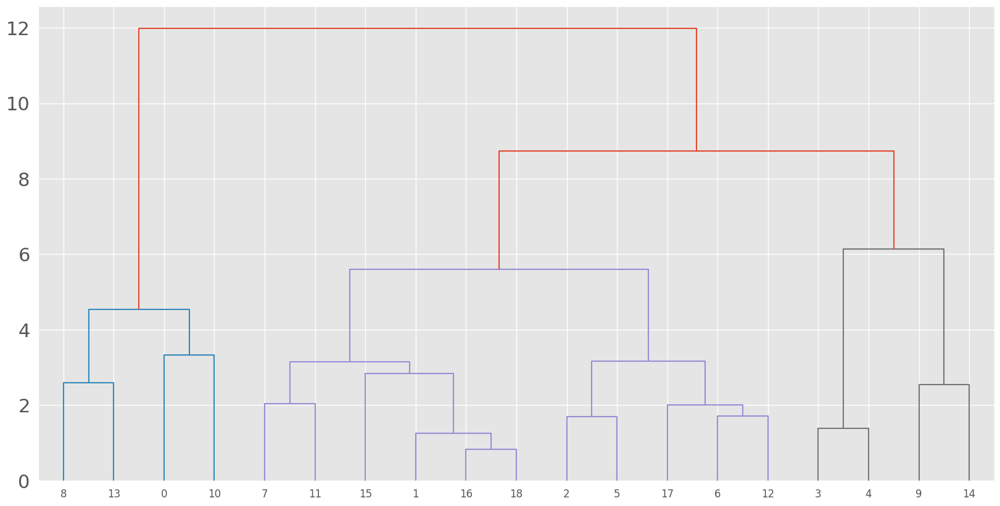

average :	0.00s


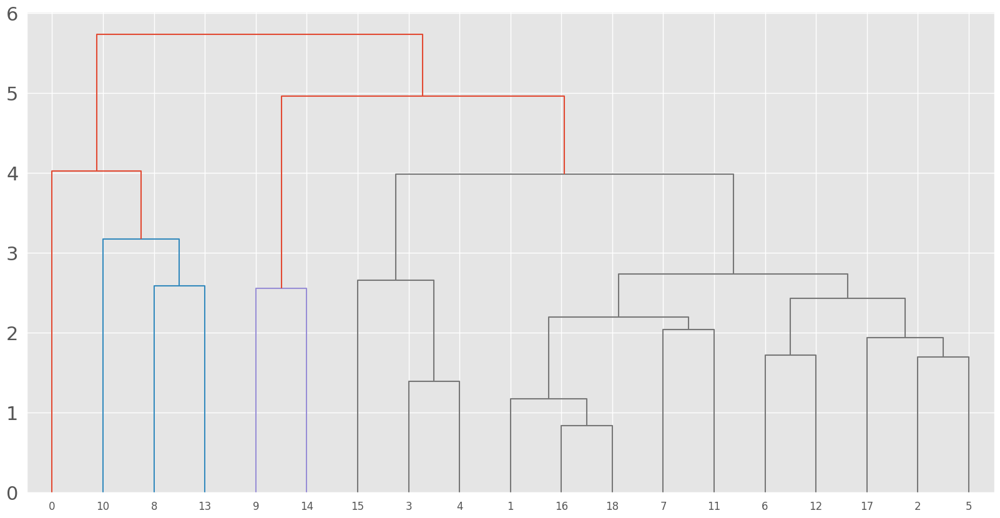

complete :	0.00s


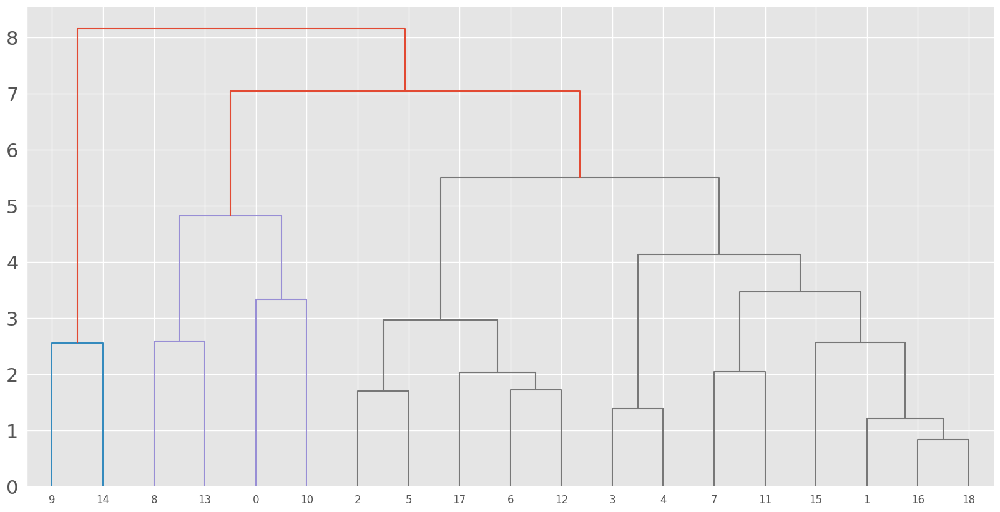

single :	0.00s


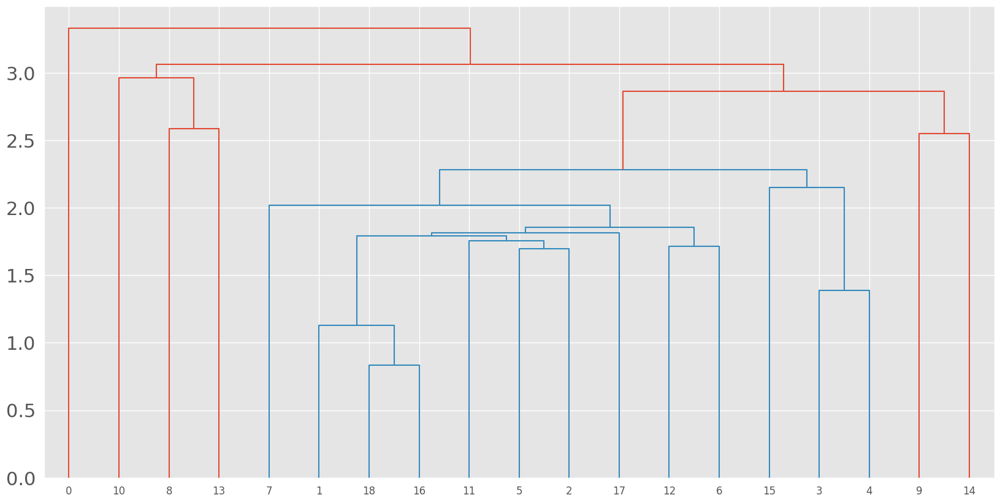

In [281]:
for linkage in ("ward", "average", "complete", "single"):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=None,
                            distance_threshold = 0)
    t0 = time()
    clustering.fit(X_scaled)
    print("%s :\t%.2fs" % (linkage, time() - t0))
    
    plt.clf()
    plot_dendogram(clustering)
    #plot_clustering(X_scaled, clustering.labels_, "%s linkage" % linkage)

Optamos por el metodo _ward_ por la aparente mejor clasificacion grupal.

In [282]:
modelo_hclust_ward = AgglomerativeClustering(
                            affinity = 'euclidean',
                            linkage  = 'ward',
                            n_clusters  = 3
                     )
modelo_hclust_ward.fit(X=X_scaled)
cluster_labels = modelo_hclust_ward.fit_predict(X_scaled)

In [283]:
print(silhouette_score(X_scaled, cluster_labels))

0.3356488821086058


In [284]:
from sklearn import metrics
metrics.calinski_harabasz_score(X_scaled, cluster_labels)


10.97758138856953

In [285]:
clf = NearestCentroid()
clf.fit(X_scaled, cluster_labels)
print(clf.centroids_)

[[ 1.14511482  1.06996774 -1.43162479 -1.11312021  0.66126372 -0.56588303
  -0.65306641 -0.6323168  -0.78012596 -0.76705687]
 [ 0.10227471  0.32175857 -0.210833    0.50073776  0.61959516  1.79042668
   1.74130481  1.77556954  1.75458905  0.94683407]
 [-0.45359619 -0.50608229  0.59725738  0.22268453 -0.46576687 -0.4452886
  -0.39572305 -0.41572827 -0.35435022 -0.06537353]]


In [286]:
DataAgregado.columns

Index(['Age_under19_Ptge', 'Age_19_65_pct', 'Age_over65_pct',
       'WomanPopulationPtge', 'ForeignersPtge', 'Servicios', 'Construccion',
       'ComercTTEHosteleria', 'Industria', 'Explotaciones'],
      dtype='object')

In [287]:
import plotly.express as px
DataAgregado['cluster'] = cluster_labels
fig = px.scatter(DataAgregado, x='WomanPopulationPtge',y='Servicios', color='cluster', text=DataAgregado.index)
fig.show()

Vemos un comportamiento bastante pobre, con valores de silueta y metodo calinski bastante bajos. Esta claro que la agrupacion no es la mejor por lo que nos movemos a K-Means para ver que podemos conseguir.

K-Means

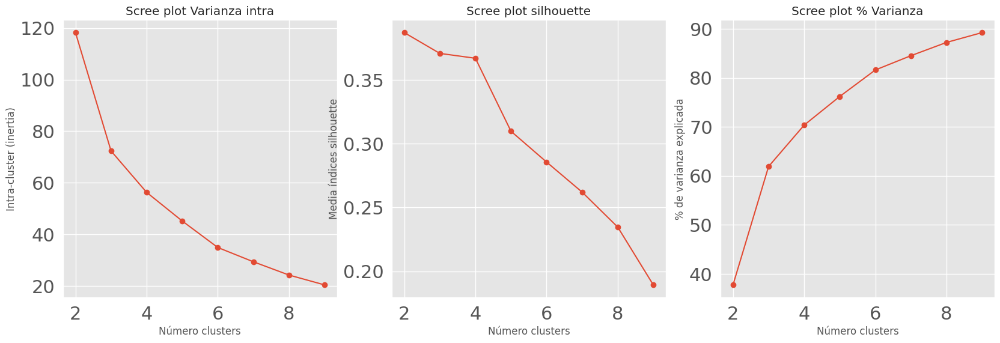

In [288]:
scree_plot_kmeans(X_scaled,10)
plt.show()

Nos decantamos por 3 _cluster_ en _K-Means_, igual que con el metodo _Ward_

In [289]:
modelo_kmeans = KMeans(n_clusters=3, n_init=25, random_state=123)
modelo_kmeans.fit(X=X_scaled)


KMeans(n_clusters=3, n_init=25, random_state=123)

In [290]:
print('Varianza intra: ' + str(modelo_kmeans.inertia_))

Varianza intra: 72.33947887412732


In [291]:
print(modelo_kmeans.cluster_centers_)

[[ 0.10227471  0.32175857 -0.210833    0.50073776  0.61959516  1.79042668
   1.74130481  1.77556954  1.75458905  0.94683407]
 [ 1.0904659   0.88909407 -1.3144089  -1.07273214  0.78078507 -0.54209567
  -0.60508492 -0.58544813 -0.68907165 -0.6794503 ]
 [-0.58614283 -0.57325046  0.74153765  0.33607097 -0.6382306  -0.44512284
  -0.39397946 -0.41750375 -0.35729979 -0.03900848]]


In [292]:
modelo_kmeans.labels_[:10]

array([0, 2, 2, 1, 1, 2, 2, 2, 0, 1])

In [293]:
from sklearn import metrics
metrics.calinski_harabasz_score(X_scaled, cluster_labels)

10.97758138856953

In [294]:
cluster_labels_kmeans = modelo_kmeans.labels_
silhouette_score(X_scaled, cluster_labels)

0.3356488821086058

In [295]:
DataAgregado.columns

Index(['Age_under19_Ptge', 'Age_19_65_pct', 'Age_over65_pct',
       'WomanPopulationPtge', 'ForeignersPtge', 'Servicios', 'Construccion',
       'ComercTTEHosteleria', 'Industria', 'Explotaciones', 'cluster'],
      dtype='object')

In [296]:
DataAgregado['cluster_kmeans'] = cluster_labels_kmeans
fig = px.scatter(DataAgregado, x='Industria',y='Explotaciones', color='cluster_kmeans', text=DataAgregado.index)
fig.show()

In [297]:
fig = px.scatter_3d(DataAgregado, x='Industria',y='Explotaciones', z='Servicios', color='cluster_kmeans', text=DataAgregado.index)
fig.show()

No me gusta nada, tenemos mismos comportamiento tanto para _K-Means_ como para _Ward_, pobre metricas de resultados, lo que nos lleva a deducir que el modelo de agrupacion no presenta buenos resultados con las variables dadas. Es por ello que vamos a servirnos de analisis de componentes principales para observar si obtenemos un mejor modelo.

In [298]:
DataAgregado.iloc[:,:-2].head()

,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Servicios,Construccion,ComercTTEHosteleria,Industria,Explotaciones
CCAA,,,,,,,,,,
Andalucía,21.467705,62.385743,16.210957,50.687422,5.994290,199598.0,51363.0,207588.0,26208.0,239965.0
Aragón,18.396171,60.562559,21.041404,50.473223,10.115284,35805.0,10648.0,29737.0,5630.0,52276.0
Asturias,14.735910,61.334539,23.929033,52.085192,4.021358,27512.0,8092.0,26414.0,3262.0,22660.0
Baleares,20.220291,64.696384,15.083099,50.231833,13.770230,39241.0,14944.0,30511.0,4407.0,10748.0
Canarias,19.160717,65.904639,14.933957,50.306663,9.992823,59363.0,14507.0,56588.0,4999.0,13913.0


Procedemos a analizar las componentes principales con el paquete pca. Vamos a optar por dos componenentes, las cuales captan el 75 % de la variabilidad.

In [299]:
from pca import pca

pcaModel = pca(normalize=True,n_components=2)
results = pcaModel.fit_transform(DataAgregado.iloc[:,:-2])


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


(<Figure size 1500x1000 with 1 Axes>,
 <AxesSubplot: title={'center': 'Cumulative explained variance\n 2 Principal Components explain [75.44%] of the variance.'}, xlabel='Principle Component', ylabel='Percentage explained variance'>)

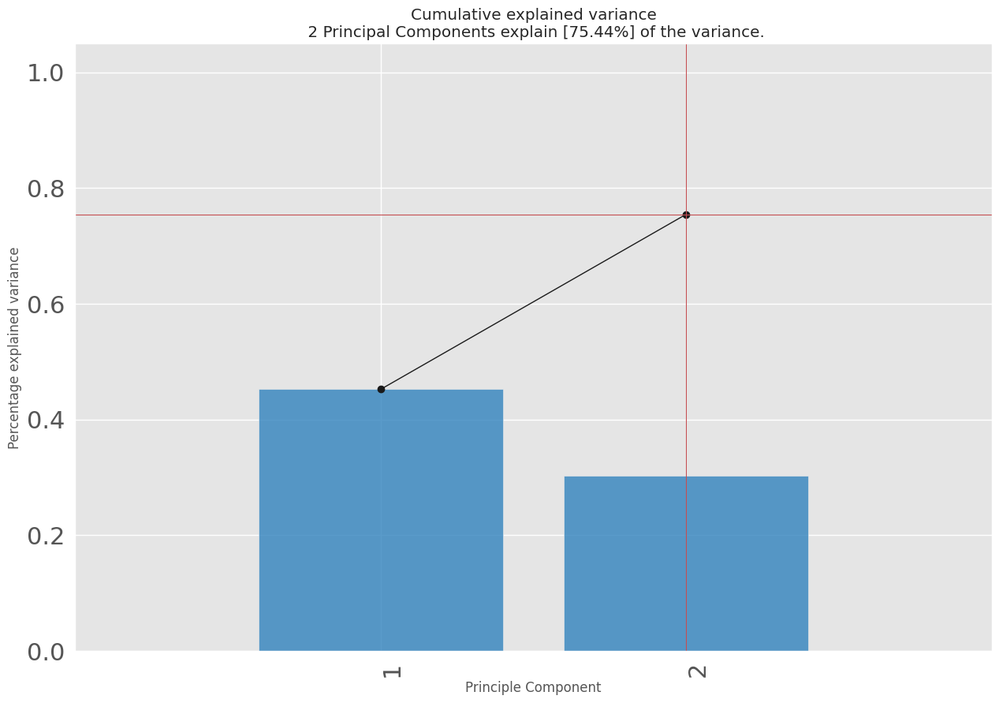

In [300]:
pcaModel.plot()

In [301]:
pcaModel.results['loadings']

,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,Servicios,Construccion,ComercTTEHosteleria,Industria,Explotaciones
PC1,-0.166534,0.036905,0.135798,0.259973,0.010936,0.437534,0.454011,0.453473,0.450392,0.280546
PC2,0.484220,0.259677,-0.531963,-0.370625,0.450292,0.160683,0.124288,0.134611,0.121715,-0.028059


[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '2 Principal Components explain [75.44%] of the variance'}, xlabel='PC1 (45.1% expl.var)', ylabel='PC2 (30.2% expl.var)'>)

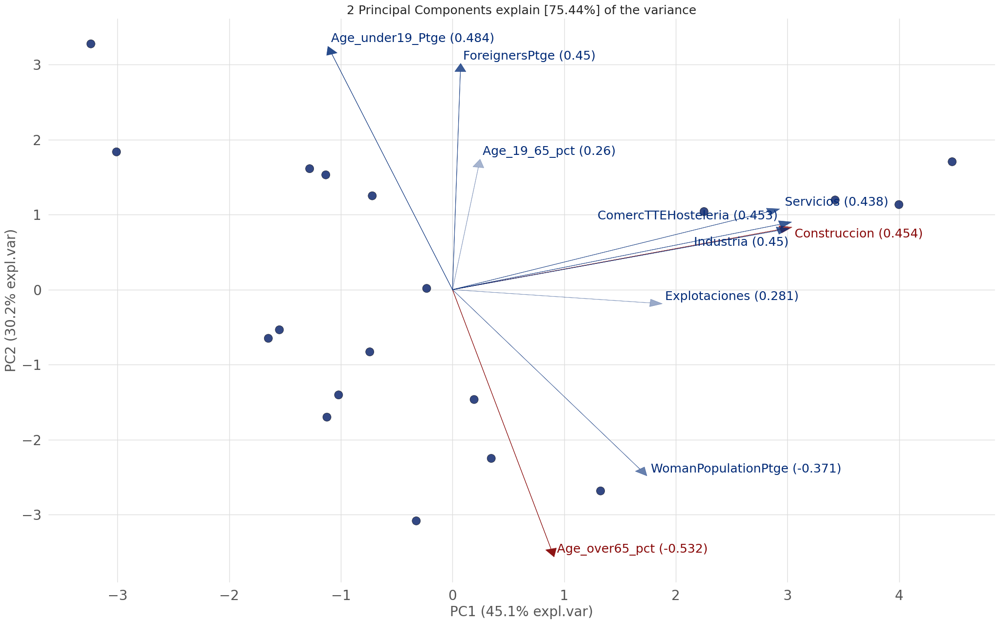

In [302]:
pcaModel.biplot(legend=False)

Vamos como la componente 1 esta principalmente compuesta por aquellos valores que describen mas el apartado economico, como por ejemplo cantidad de empresas clasificadas por sector. Vemos ademas que hay influencia de las variables _WomanPopulationPtge_ y _Age-over65-pct_.

Por otro lado en cuento a la componente 2, esta mas influencia por la categorias demograficas tales como los porcentajes de cada grupo demografico asi como el porcentaje de extranjeros. En esta componente las variables _WomanPopulationPtge_ y _Age-over65-pct_, tiene relacion negativa.

In [303]:
pcaModel.results['PC']

,PC1,PC2
Andalucía,3.998116,1.133920
Aragón,-0.740628,-0.829591
Asturias,-0.324309,-3.082855
Baleares,-1.134683,1.530385
Canarias,-0.718500,1.250930
Cantabria,-1.124480,-1.699705
CastillaLeón,0.347207,-2.249782
CastillaMancha,-0.231199,0.016457
Cataluña,4.474987,1.705248
Ceuta,-3.008942,1.836468


Anyadimos las componetes a los cluster.

In [305]:
datapca = pcaModel.results['PC']

ward :	0.00s


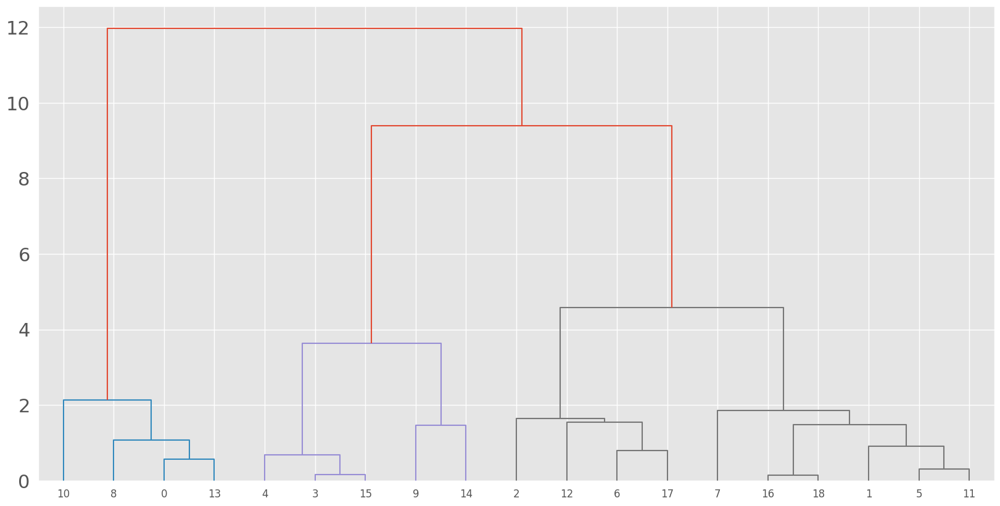

average :	0.00s


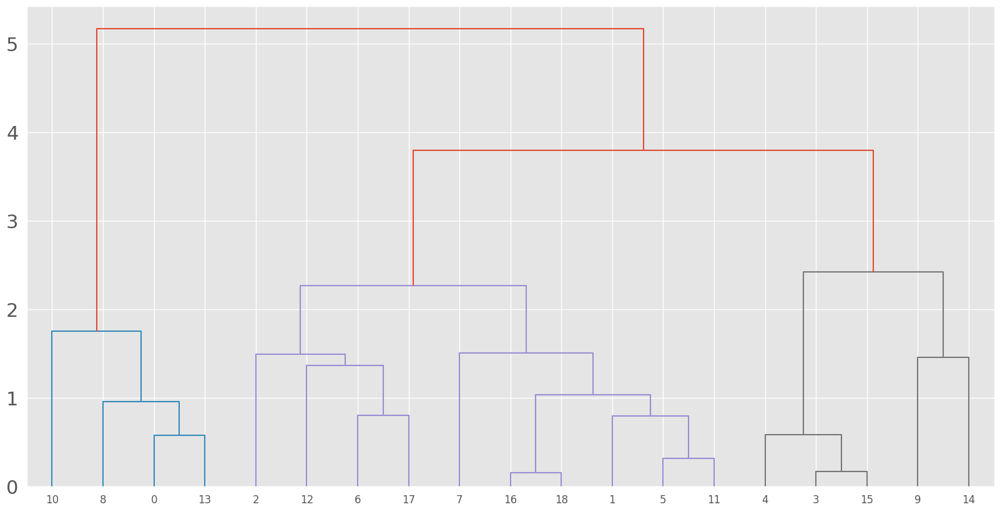

complete :	0.00s


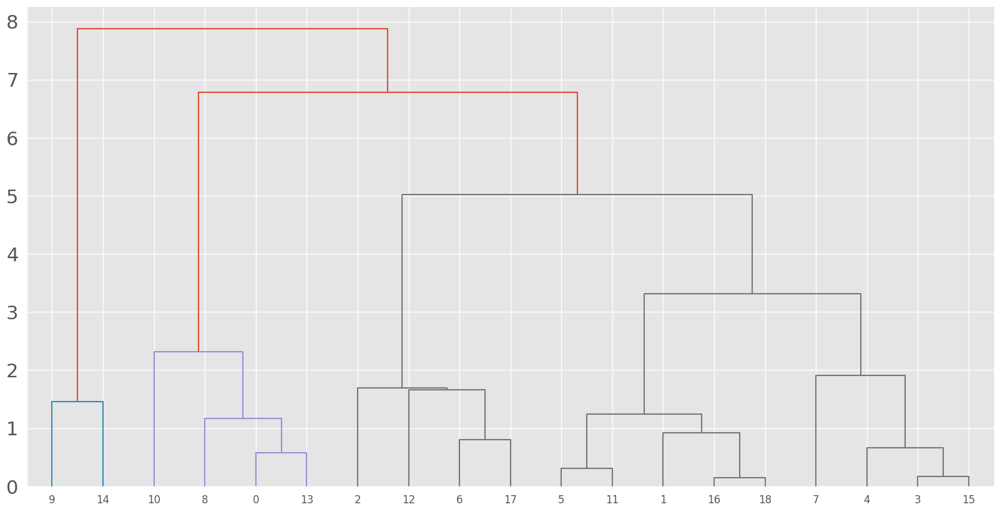

single :	0.00s


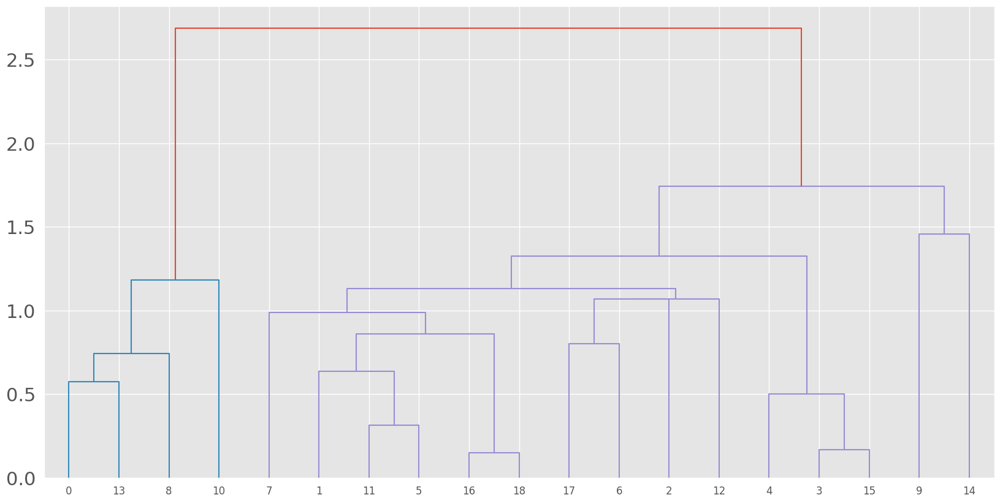

In [306]:
for linkage in ("ward", "average", "complete", "single"):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=None,
                            distance_threshold = 0)
    t0 = time()
    clustering.fit(datapca)
    print("%s :\t%.2fs" % (linkage, time() - t0))
    
    plt.clf()
    plot_dendogram(clustering)
    #plot_clustering(X_scaled, clustering.labels_, "%s linkage" % linkage)

In [307]:
modelo_hclust_ward1 = AgglomerativeClustering(
                            affinity = 'euclidean',
                            linkage  = 'ward',
                            n_clusters  = 3
                     )
modelo_hclust_ward1.fit(X=datapca)
cluster_labels1 = modelo_hclust_ward1.fit_predict(datapca)

In [308]:
from sklearn import metrics
metrics.calinski_harabasz_score(datapca, cluster_labels1)

33.51625402166085

In [309]:
print(silhouette_score(datapca, cluster_labels1))

0.5615094842597486


In [310]:
clf = NearestCentroid()
print('Centroides')
clf.fit(datapca, cluster_labels1)
print(clf.centroids_)

Centroides
[[-0.47727746 -1.45818445]
 [ 3.53816502  1.26876413]
 [-1.8759771   1.9013576 ]]


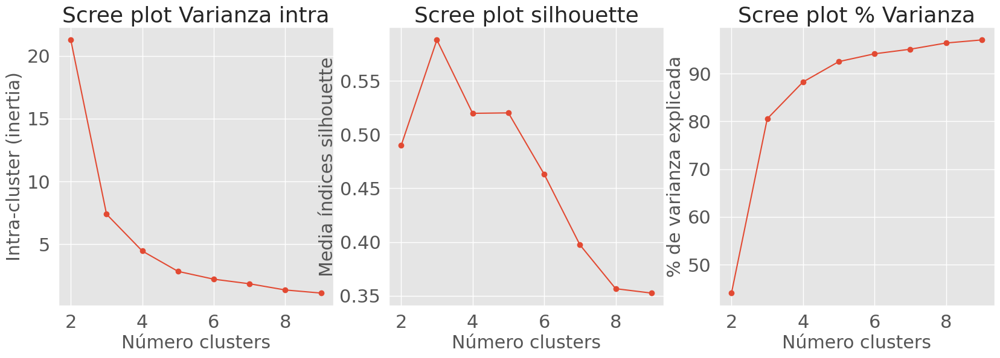

In [311]:
scree_plot_kmeans(datapca,10)
plt.show()

In [312]:
modelo_kmeans1 = KMeans(n_clusters=3, n_init=25, random_state=123)
modelo_kmeans1.fit(X=datapca)

KMeans(n_clusters=3, n_init=25, random_state=123)

In [313]:
cluster_labels_kmeans1 = modelo_kmeans1.labels_

In [314]:
silhouette_score(datapca, modelo_kmeans1.labels_)

0.5615094842597486

In [315]:
from sklearn import metrics
metrics.calinski_harabasz_score(datapca, cluster_labels_kmeans1)

33.51625402166085

In [316]:
print('Varianza intra: ' + str(modelo_kmeans1.inertia_))

Varianza intra: 27.62282613901646


In [317]:
print('Centroides')
print(modelo_kmeans1.cluster_centers_)

Centroides
[[ 3.53816502  1.26876413]
 [-0.47727746 -1.45818445]
 [-1.8759771   1.9013576 ]]


In [321]:
datapca['cluster_kmeans'] = cluster_labels_kmeans1
datapca['cluster_labels'] = cluster_labels1

In [322]:
pd.crosstab(datapca.cluster_labels,datapca.cluster_kmeans)

cluster_kmeans,0,1,2
cluster_labels,,,
0,0,10,0
1,4,0,0
2,0,0,5


In [323]:
fig = px.scatter(datapca, x='PC1',y='PC2', color='cluster_kmeans', text=data_pca.index)
fig.show()

Aqui podemos observar como se ha diferencia cada uno de los grupos.

- En primer lugar, tenemos al grupo compuesto por Catalunya, Comunidad Valencia, Madrid y Andalucia, los cuales recogen mayormente caracteristicas relacionada con la actividad economica, es decir, una de la principales cualidades de esta comunidades es que son pioneras en Espanya por albergar la mayor cantidad de empresas. Anque tambien vemos, aunque en menor menida, influcencia de las variables demograficas (PC2)
- Por otro lado, tenemos a las comunidades del norte y centro de Espanya, cuyas caracteristicas principales van en maytor medida en direccion contraria con respecto a PC2, es decir, poblacion envejecida, poca presencia de extranjeros, etc. Aunque por otro lado, dentro de este grupo podemos observar a Castilla la Macha, cuya composicion es bastente homogenea con respecto a ambas componentes.
- En tercer lugar, senyalando el tercer grupo, vemos que esta compuesto principalmente por las islas, y ciudades autonomas (Ceuta y Melilla), y sus caracteristicas que los hacen capaces de formar un grupo son la composicion demografica y una menor cantidad de empresas, es decir estan compuesta en sentido positivo por la componente PC2 y en sentido negativo por la componente PC1.

En cuanto a los centroides, vemos que tanto los modelos reazidados directamente con los datos escalados como los realizados con PCA presentan los mismo centroides, pero en diferente orden. Es por ello que solo vamos a observar a uno de cada modelo para cada tipo de variable, es decir, uno para componentes principales (PCA) y otro para variables escaladas.

Teniendo en cuenta el concepto de centroide, esta variable representa los puntos medios para cada uno de los _clusters_ creados.

* MODELOS CON PCA

    - [[ 3.53816502  1.26876413] - Coordenadas bidimensionales del grupo 0
    - [-0.47727746 -1.45818445] -  Coordenadas bidimensionales del grupo 1
    - [-1.8759771   1.9013576 ]] -  Coordenadas bidimensionales del grupo 2


* MODELOS CON VARIABLES ESCALADAS

    - [[ 1.14511482  1.06996774 -1.43162479 -1.11312021  0.66126372 -0.56588303
      -0.65306641 -0.6323168  -0.78012596 -0.76705687] - Coordenadas de 10 dimensiones del grupo 0
    - [ 0.10227471  0.32175857 -0.210833    0.50073776  0.61959516  1.79042668
      1.74130481  1.77556954  1.75458905  0.94683407] - Coordenadas bidimensionales del grupo 1
    - [-0.45359619 -0.50608229  0.59725738  0.22268453 -0.46576687 -0.4452886
      -0.39572305 -0.41572827 -0.35435022 -0.06537353]] - Coordenadas bidimensionales del grupo 2
    

Tras la obtencion de las componentes principales, los resultados para ambos modelos, tanto Ward jerarquico como K-Means son mucho mejores. Aunque una cosa que me resulta extranya es como ambos modelos pueden tener el mismo comportamiento en cuannto a metrica se refiere. Es una cosa que me gustaria aclarar.

Pero sin ninguna duda la obtencion de compoenentes principales ha mejorado sustancialmente la separacion de cada uno de los grupos. 
Presenta un mejor resultado en las siguientes metricas:

- Modelo con PCA vs Modelo Variables escaladas

    - Puntuación de Calinski-Harabasz: Mejor resultado en PCA, teniendo en cuenta que valores alto representa buena clasificacion y coherencia de los _cluster_.
        - 33.51 vs 10.97
    - Coeficiente de Silhouette: Mejor resultado en PCA con un valor cercano a 0.6, teniendo en cuenta que 1 representa una buena separacion entre _cluster_.
        - 0.56 vs 0.33 
    - Varianza intracluster(solo K-Means): Como en los dos anteriores, mejor comportamiento en PCA, ya que la varianza intracluster debe ser cuanto mas baja mejor, ya que una varianza alta representa una alta dispersion entre cada unos de los puntos dentro de cada cluster.
        - 27.62 vs 72.33